In [ ]:
# Step 1: Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Function to prepare heart rate data
def prepare_heart_rate_data(file_path):
    df = pd.read_csv(file_path)
    df['Time'] = pd.to_datetime(df['Time'])
    participant_data = {}
    for participant_id in df['Id'].unique():
        participant_df = df[df['Id'] == participant_id].copy()
        participant_df.set_index('Time', inplace=True)
        participant_data[participant_id] = participant_df
    return participant_data

# Function to prepare steps data
def prepare_steps_data(file_path):
    df = pd.read_csv(file_path)
    df['ActivityMinute'] = pd.to_datetime(df['ActivityMinute'])
    participant_data = {}
    for participant_id in df['Id'].unique():
        participant_df = df[df['Id'] == participant_id].copy()
        participant_df.set_index('ActivityMinute', inplace=True)
        participant_data[participant_id] = participant_df
    return participant_data

# Function to aggregate data to a specified interval
def aggregate_data(participant_data, interval):
    aggregated_data = {}
    resample_rules = {
        'minute': 'T',
        '5_minutes': '5T',
        '15_minutes': '15T',
        '30_minutes': '30T',
        'hourly': 'H',
        'daily': 'D',
        'weekly': 'W'
    }
    if interval not in resample_rules:
        print("Invalid interval. Please specify 'minute', '5_minutes', '15_minutes', '30_minutes', 'hourly', 'daily', or 'weekly'.")
        return None
    for pid, pdf in participant_data.items():
        aggregated_data[pid] = pdf.resample(resample_rules[interval]).mean()
    return aggregated_data
    # Example usage
heart_rate_file_path = '/content/drive/MyDrive/mturkfitbit_export_4.12.16-5.12.16/Fitabase Data 4.12.16-5.12.16/heartrate_seconds_merged.csv'  # Replace with your file path
steps_file_path = '/content/drive/MyDrive/mturkfitbit_export_4.12.16-5.12.16/Fitabase Data 4.12.16-5.12.16/minuteStepsNarrow_merged.csv'  # Replace with your file path

# Prepare heart rate and steps data
heart_rate_data = prepare_heart_rate_data(heart_rate_file_path)
steps_data = prepare_steps_data(steps_file_path)
aggregated_heart_rate_data = aggregate_data(heart_rate_data, 'minute')
aggregated_steps_data = aggregate_data(steps_data, 'minute')



<ipython-input-1-f26c86795dd3>:20: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['ActivityMinute'] = pd.to_datetime(df['ActivityMinute'])


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
def align_and_merge_data(heart_rate_data, steps_data):
    merged_data = {}
    for participant_id in heart_rate_data.keys():
        if participant_id in steps_data:
            hr_df = heart_rate_data[participant_id]
            steps_df = steps_data[participant_id]
            common_start_time = max(hr_df.index.min(), steps_df.index.min())
            hr_df = hr_df[hr_df.index >= common_start_time]
            steps_df = steps_df[steps_df.index >= common_start_time]
            merged_df = pd.merge(hr_df, steps_df, left_index=True, right_index=True, how='outer', suffixes=('_hr', '_steps'))
            #merged_df.fillna(method='ffill', inplace=True)
            #merged_df.fillna(method='bfill', inplace=True)
            merged_data[participant_id] = merged_df
    return merged_data


# Align and merge data for each participant
merged_data = align_and_merge_data(aggregated_heart_rate_data, aggregated_steps_data)


In [ ]:
merged_data[5553957443]

,Id_hr,Value,Id_steps,Steps
2016-04-12 00:00:00,5.553957e+09,59.333333,5.553957e+09,0.0
2016-04-12 00:01:00,5.553957e+09,58.666667,5.553957e+09,0.0
2016-04-12 00:02:00,5.553957e+09,59.400000,5.553957e+09,0.0
2016-04-12 00:03:00,5.553957e+09,56.800000,5.553957e+09,0.0
2016-04-12 00:04:00,5.553957e+09,56.400000,5.553957e+09,0.0
...,...,...,...,...
2016-05-12 09:55:00,NaN,NaN,5.553957e+09,0.0
2016-05-12 09:56:00,NaN,NaN,5.553957e+09,0.0
2016-05-12 09:57:00,NaN,NaN,5.553957e+09,0.0
2016-05-12 09:58:00,NaN,NaN,5.553957e+09,0.0


In [ ]:
X, scaler = prepare_data_for_lstm(merged_data[2347167796][['Value', 'Steps']])
X.shape

NameError: name 'prepare_data_for_lstm' is not defined

In [ ]:
import pandas as pd

# Sample merged_data dictionary with participant IDs as keys and their DataFrames as values
# Example:
# merged_data = {
#     'participant_1': pd.DataFrame(...),
#     'participant_2': pd.DataFrame(...),
#     ...
# }

def calculate_missing_data(merged_data):
    missing_data_info = {}

    for participant_id, data in merged_data.items():
        total_steps_entries = data['Steps'].shape[0]  # Total number of steps data points
        missing_steps_entries = data['Steps'].isnull().sum()  # Missing steps data points
        missing_steps_percentage = (missing_steps_entries / total_steps_entries) * 100

        total_heart_rate_entries = data['Value'].shape[0]  # Total number of heart rate data points
        missing_heart_rate_entries = data['Value'].isnull().sum()  # Missing heart rate data points
        missing_heart_rate_percentage = (missing_heart_rate_entries / total_heart_rate_entries) * 100

        missing_data_info[participant_id] = {
            'Missing Steps Percentage': missing_steps_percentage,
            'Missing Heart Rate Percentage': missing_heart_rate_percentage
        }

    return pd.DataFrame(missing_data_info).transpose()




missing_data_info = calculate_missing_data(merged_data)

missing_data_info

,Missing Steps Percentage,Missing Heart Rate Percentage
2022484408,0.112108,51.766267
2026352035,0.000000,98.842479
2347167796,0.233053,7.985117
4020332650,0.047791,74.481691
4388161847,0.032807,10.697380
4558609924,0.047970,39.367705
5553957443,0.000000,8.447489
5577150313,0.011769,18.185242
6117666160,0.158739,28.555761
6775888955,0.019997,85.496772


In [ ]:
import pandas as pd

def calculate_missing_data(merged_data):
    missing_data_info = {}

    for participant_id, data in merged_data.items():
        # Ensure the index is a datetime object
        data.index = pd.to_datetime(data.index)

        # Calculate total and missing entries for 'Steps'
        total_steps_entries = data['Steps'].shape[0]  # Total number of steps data points
        missing_steps_entries = data['Steps'].isnull().sum()  # Missing steps data points
        missing_steps_percentage = (missing_steps_entries / total_steps_entries) * 100

        # Calculate total and missing entries for 'Value'
        total_heart_rate_entries = data['Value'].shape[0]  # Total number of heart rate data points
        missing_heart_rate_entries = data['Value'].isnull().sum()  # Missing heart rate data points
        missing_heart_rate_percentage = (missing_heart_rate_entries / total_heart_rate_entries) * 100

        # Calculate the duration from the first to the last date
        duration_days = (data.index.max() - data.index.min()).days

        # Store the results
        missing_data_info[participant_id] = {
            'Missing Steps Percentage': missing_steps_percentage,
            'Missing Heart Rate Percentage': missing_heart_rate_percentage,
            'Duration (days)': duration_days
        }

    return pd.DataFrame(missing_data_info).transpose()



# Calculate missing data information
missing_data_info = calculate_missing_data(merged_data)

missing_data_info




,Missing Steps Percentage,Missing Heart Rate Percentage,Duration (days)
2022484408,0.112108,51.766267,30.0
2026352035,0.000000,98.842479,25.0
2347167796,0.233053,7.985117,16.0
4020332650,0.047791,74.481691,30.0
4388161847,0.032807,10.697380,29.0
4558609924,0.047970,39.367705,30.0
5553957443,0.000000,8.447489,30.0
5577150313,0.011769,18.185242,29.0
6117666160,0.158739,28.555761,24.0
6775888955,0.019997,85.496772,24.0


In [ ]:
import pandas as pd

def calculate_missing_data(merged_data):
    missing_data_info = {}

    for participant_id, data in merged_data.items():
        # Ensure the index is a datetime object
        data.index = pd.to_datetime(data.index)

        # Calculate total and missing entries for 'Steps'
        total_steps_entries = data['Steps'].shape[0]  # Total number of steps data points
        missing_steps_entries = data['Steps'].isnull().sum()  # Missing steps data points
        missing_steps_percentage = (missing_steps_entries / total_steps_entries) * 100

        # Calculate total and missing entries for 'Value'
        total_heart_rate_entries = data['Value'].shape[0]  # Total number of heart rate data points
        missing_heart_rate_entries = data['Value'].isnull().sum()  # Missing heart rate data points
        missing_heart_rate_percentage = (missing_heart_rate_entries / total_heart_rate_entries) * 100

        # Calculate the duration from the first to the last date
        duration_days = (data.index.max() - data.index.min()).days

        # Store the results
        missing_data_info[participant_id] = {
            'Missing Steps Percentage': missing_steps_percentage,
            'Missing Heart Rate Percentage': missing_heart_rate_percentage,
            'Duration (days)': duration_days
        }

    return pd.DataFrame(missing_data_info).transpose()

# Calculate missing data information
missing_data_info = calculate_missing_data(merged_data)

# Sort the DataFrame by 'Missing Heart Rate Percentage'
sorted_missing_data_info = missing_data_info.sort_values(by='Missing Heart Rate Percentage')

# Display the sorted results
sorted_missing_data_info


,Missing Steps Percentage,Missing Heart Rate Percentage,Duration (days)
6962181067,0.000000,5.532787,30.0
2347167796,0.233053,7.985117,16.0
5553957443,0.000000,8.447489,30.0
4388161847,0.032807,10.697380,29.0
5577150313,0.011769,18.185242,29.0
6117666160,0.158739,28.555761,24.0
8877689391,0.103034,37.369204,30.0
4558609924,0.047970,39.367705,30.0
7007744171,0.000000,43.953645,24.0
8792009665,0.000000,50.361338,27.0


Shape of X: (30, 1440, 2)
Epoch 1/100
1/1 [==============================] - 15s 15s/step - loss: 0.7732 - val_loss: 0.8492
Epoch 2/100
1/1 [==============================] - 1s 1s/step - loss: 0.7201 - val_loss: 0.7792
Epoch 3/100
1/1 [==============================] - 2s 2s/step - loss: 0.6715 - val_loss: 0.7147
Epoch 4/100
1/1 [==============================] - 2s 2s/step - loss: 0.6277 - val_loss: 0.6570
Epoch 5/100
1/1 [==============================] - 2s 2s/step - loss: 0.5896 - val_loss: 0.6078
Epoch 6/100
1/1 [==============================] - 1s 1s/step - loss: 0.5584 - val_loss: 0.5685
Epoch 7/100
1/1 [==============================] - 1s 1s/step - loss: 0.5349 - val_loss: 0.5403
Epoch 8/100
1/1 [==============================] - 1s 1s/step - loss: 0.5197 - val_loss: 0.5221
Epoch 9/100
1/1 [==============================] - 1s 1s/step - loss: 0.5111 - val_loss: 0.5103
Epoch 10/100
1/1 [==============================] - 1s 1s/step - loss: 0.5054 - val_loss: 0.5004
Epoch 11/10

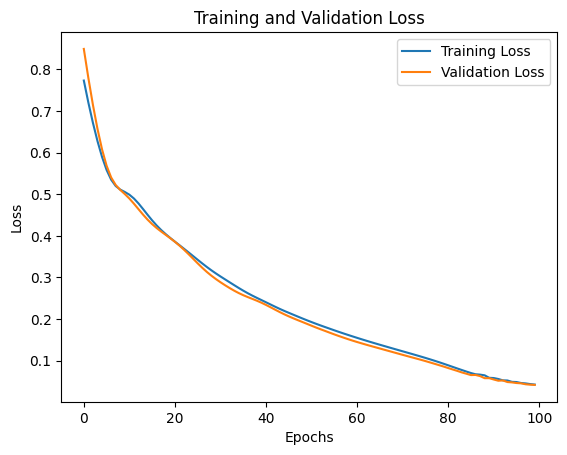

1/1 [==============================] - 0s 250ms/step - loss: 0.0670
Test Loss: 0.06703507900238037


In [ ]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Example function to prepare data for LSTM training
def prepare_data_for_lstm(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequence_length = 1440  # Number of minutes in a day
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Load your data into a DataFrame (assuming 'minute_data' is a DataFrame)
# For example: merged_data = pd.read_csv('your_data.csv')

# Fill NaN with column mean
merged_data[5553957443].fillna(merged_data[5553957443].mean(), inplace=True)

# Prepare data for LSTM training
data = merged_data[5553957443][['Value', 'Steps']]
X, scaler = prepare_data_for_lstm(data)

# Verify shape of X (samples, time_steps, features)
print(f"Shape of X: {X.shape}")  # Should print (number_of_samples, 1440, number_of_features)

# Split data into training, validation, and test sets
train_data, test_data = train_test_split(X, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(train_data, test_size=0.25, random_state=42)

# Initialize LSTM model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(1440, X.shape[2])))
model.add(LSTM(units=50, return_sequences=True))  # Ensure this layer returns sequences
model.add(Dense(units=X.shape[2]))  # Adjust units based on number of features
model.compile(optimizer='adam', loss='mean_squared_error')

# Example of training the model
history = model.fit(train_data, train_data, epochs=100, batch_size=32, validation_data=(val_data, val_data))

# Evaluate model performance or use for predictions
# Example: plot loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Evaluate the model on the test data
test_loss = model.evaluate(test_data, test_data)
print(f"Test Loss: {test_loss}")


Shape of X: (30, 1440, 2)
Epoch 1/100
1/1 [==============================] - 8s 8s/step - loss: 1.0033 - val_loss: 1.2071
Epoch 2/100
1/1 [==============================] - 1s 1s/step - loss: 0.9193 - val_loss: 1.1081
Epoch 3/100
1/1 [==============================] - 1s 1s/step - loss: 0.8424 - val_loss: 1.0156
Epoch 4/100
1/1 [==============================] - 1s 1s/step - loss: 0.7715 - val_loss: 0.9293
Epoch 5/100
1/1 [==============================] - 3s 3s/step - loss: 0.7061 - val_loss: 0.8493
Epoch 6/100
1/1 [==============================] - 3s 3s/step - loss: 0.6463 - val_loss: 0.7767
Epoch 7/100
1/1 [==============================] - 1s 1s/step - loss: 0.5926 - val_loss: 0.7132
Epoch 8/100
1/1 [==============================] - 1s 1s/step - loss: 0.5461 - val_loss: 0.6607
Epoch 9/100
1/1 [==============================] - 1s 1s/step - loss: 0.5084 - val_loss: 0.6211
Epoch 10/100
1/1 [==============================] - 1s 1s/step - loss: 0.4806 - val_loss: 0.5950
Epoch 11/100


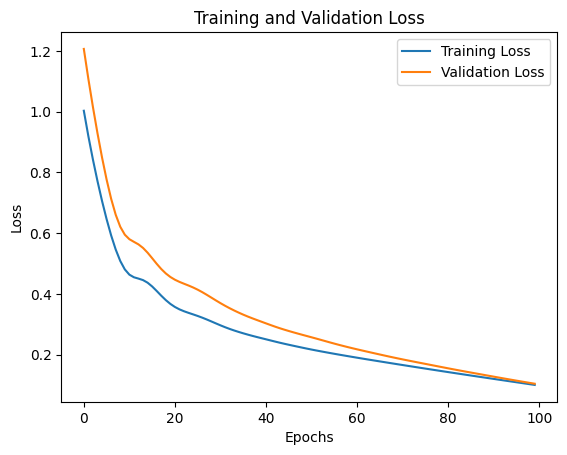

1/1 [==============================] - 0s 236ms/step - loss: 0.1110
Test Loss: 0.11095695942640305


In [ ]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Example function to prepare data for LSTM training
def prepare_data_for_lstm(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequence_length = 1440  # Number of minutes in a day
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Load your data into a DataFrame (assuming 'minute_data' is a DataFrame)
# For example: merged_data = pd.read_csv('your_data.csv')

# Fill NaN with column mean
merged_data[6962181067].fillna(merged_data[6962181067].mean(), inplace=True)

# Prepare data for LSTM training
data = merged_data[6962181067][['Value', 'Steps']]
X, scaler = prepare_data_for_lstm(data)

# Verify shape of X (samples, time_steps, features)
print(f"Shape of X: {X.shape}")  # Should print (number_of_samples, 1440, number_of_features)

# Split data into training, validation, and test sets
train_data, test_data = train_test_split(X, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(train_data, test_size=0.25, random_state=42)

# Initialize LSTM model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(1440, X.shape[2])))
model.add(LSTM(units=50, return_sequences=True))  # Ensure this layer returns sequences
model.add(Dense(units=X.shape[2]))  # Adjust units based on number of features
model.compile(optimizer='adam', loss='mean_squared_error')

# Example of training the model
history = model.fit(train_data, train_data, epochs=100, batch_size=32, validation_data=(val_data, val_data))

# Evaluate model performance or use for predictions
# Example: plot loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Evaluate the model on the test data
test_loss = model.evaluate(test_data, test_data)
print(f"Test Loss: {test_loss}")


Shape of X: (30, 1440, 2)
Epoch 1/100
1/1 [==============================] - 15s 15s/step - loss: 0.8004 - val_loss: 0.9065
Epoch 2/100
1/1 [==============================] - 3s 3s/step - loss: 0.7486 - val_loss: 0.8384
Epoch 3/100
1/1 [==============================] - 1s 1s/step - loss: 0.7002 - val_loss: 0.7742
Epoch 4/100
1/1 [==============================] - 1s 1s/step - loss: 0.6551 - val_loss: 0.7141
Epoch 5/100
1/1 [==============================] - 1s 1s/step - loss: 0.6134 - val_loss: 0.6584
Epoch 6/100
1/1 [==============================] - 1s 1s/step - loss: 0.5756 - val_loss: 0.6081
Epoch 7/100
1/1 [==============================] - 1s 1s/step - loss: 0.5425 - val_loss: 0.5645
Epoch 8/100
1/1 [==============================] - 1s 1s/step - loss: 0.5150 - val_loss: 0.5290
Epoch 9/100
1/1 [==============================] - 1s 1s/step - loss: 0.4941 - val_loss: 0.5020
Epoch 10/100
1/1 [==============================] - 2s 2s/step - loss: 0.4795 - val_loss: 0.4822
Epoch 11/10

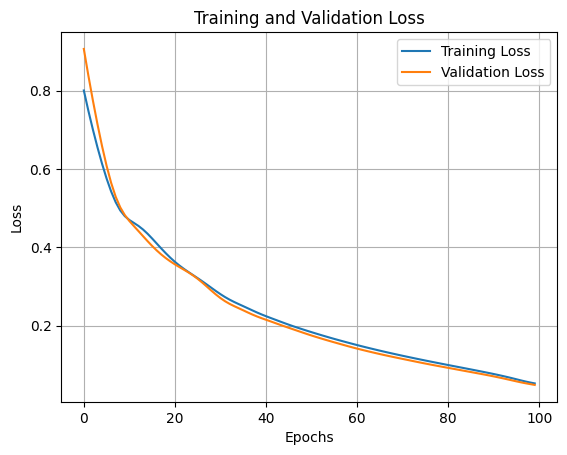

1/1 [==============================] - 0s 388ms/step - loss: 0.0749
Test Loss: 0.07491035014390945
1/1 [==============================] - 0s 321ms/step


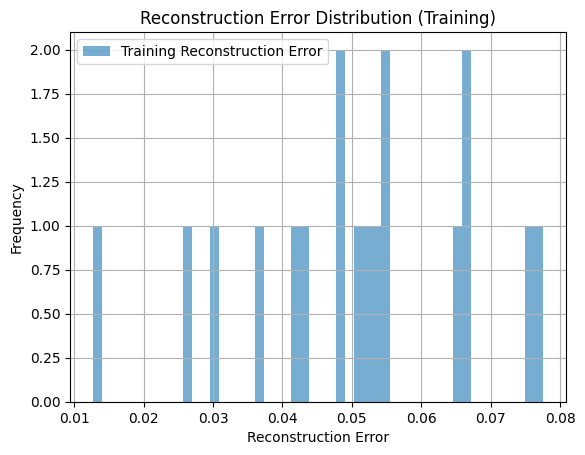

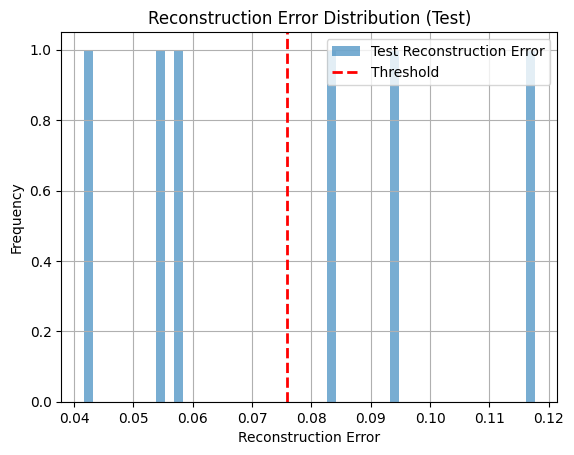

Reconstruction Error Threshold: 0.07580528388322601


In [ ]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Example function to prepare data for LSTM training
def prepare_data_for_lstm(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequence_length = 1440  # Number of minutes in a day
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Function to calculate reconstruction errors
def calculate_reconstruction_error(model, data):
    reconstructed_data = model.predict(data)
    mse = np.mean(np.power(data - reconstructed_data, 2), axis=(1, 2))
    return mse

# Load your data into a DataFrame (assuming 'minute_data' is a DataFrame)
# For example: merged_data = pd.read_csv('your_data.csv')

# Fill NaN values with column mean
merged_data[5553957443].fillna(merged_data[5553957443].mean(), inplace=True)

# Prepare data for LSTM training
data = merged_data[5553957443][['Value', 'Steps']]
X, scaler = prepare_data_for_lstm(data)

# Verify shape of X (samples, time_steps, features)
print(f"Shape of X: {X.shape}")  # Should print (number_of_samples, 1440, number_of_features)

# Split data into training, validation, and test sets
train_data, test_data = train_test_split(X, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(train_data, test_size=0.25, random_state=42)

# Initialize LSTM model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(1440, X.shape[2])))
model.add(LSTM(units=50, return_sequences=True))  # Ensure this layer returns sequences
model.add(Dense(units=X.shape[2]))  # Adjust units based on number of features
model.compile(optimizer='adam', loss='mean_squared_error')

# Example of training the model
history = model.fit(train_data, train_data, epochs=100, batch_size=32, validation_data=(val_data, val_data))

# Plot training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

# Evaluate the model on the test data
test_loss = model.evaluate(test_data, test_data)
print(f"Test Loss: {test_loss}")

# Calculate reconstruction errors
train_reconstruction_error = calculate_reconstruction_error(model, train_data)
val_reconstruction_error = calculate_reconstruction_error(model, val_data)
test_reconstruction_error = calculate_reconstruction_error(model, test_data)

# Plot reconstruction error for training data to determine threshold
plt.hist(train_reconstruction_error, bins=50, alpha=0.6, label='Training Reconstruction Error')
plt.xlabel('Reconstruction Error')
plt.ylabel('Frequency')
plt.title('Reconstruction Error Distribution (Training)')
plt.legend()
plt.grid(True)
plt.show()

# Determine threshold for significant changes
threshold = np.percentile(train_reconstruction_error, 95)  # e.g., 95th percentile

# Plot reconstruction error for test data
plt.hist(test_reconstruction_error, bins=50, alpha=0.6, label='Test Reconstruction Error')
plt.axvline(threshold, color='r', linestyle='dashed', linewidth=2, label='Threshold')
plt.xlabel('Reconstruction Error')
plt.ylabel('Frequency')
plt.title('Reconstruction Error Distribution (Test)')
plt.legend()
plt.grid(True)
plt.show()

print(f"Reconstruction Error Threshold: {threshold}")


Shape of X: (30, 1440, 2)
Epoch 1/100
1/1 [==============================] - 7s 7s/step - loss: 0.8221 - val_loss: 1.0764
Epoch 2/100
1/1 [==============================] - 3s 3s/step - loss: 0.7682 - val_loss: 0.9948
Epoch 3/100
1/1 [==============================] - 2s 2s/step - loss: 0.7179 - val_loss: 0.9182
Epoch 4/100
1/1 [==============================] - 1s 1s/step - loss: 0.6715 - val_loss: 0.8470
Epoch 5/100
1/1 [==============================] - 1s 1s/step - loss: 0.6290 - val_loss: 0.7816
Epoch 6/100
1/1 [==============================] - 2s 2s/step - loss: 0.5909 - val_loss: 0.7228
Epoch 7/100
1/1 [==============================] - 1s 1s/step - loss: 0.5577 - val_loss: 0.6716
Epoch 8/100
1/1 [==============================] - 1s 1s/step - loss: 0.5299 - val_loss: 0.6291
Epoch 9/100
1/1 [==============================] - 1s 1s/step - loss: 0.5081 - val_loss: 0.5963
Epoch 10/100
1/1 [==============================] - 2s 2s/step - loss: 0.4924 - val_loss: 0.5728
Epoch 11/100


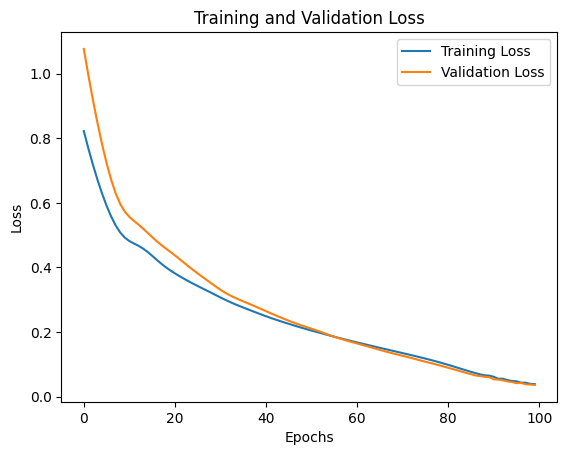

1/1 [==============================] - 0s 234ms/step - loss: 0.0544
Test Loss: 0.05439750477671623
1/1 [==============================] - 1s 1s/step
Test Reconstruction Error (MSE): 0.05439750319727724


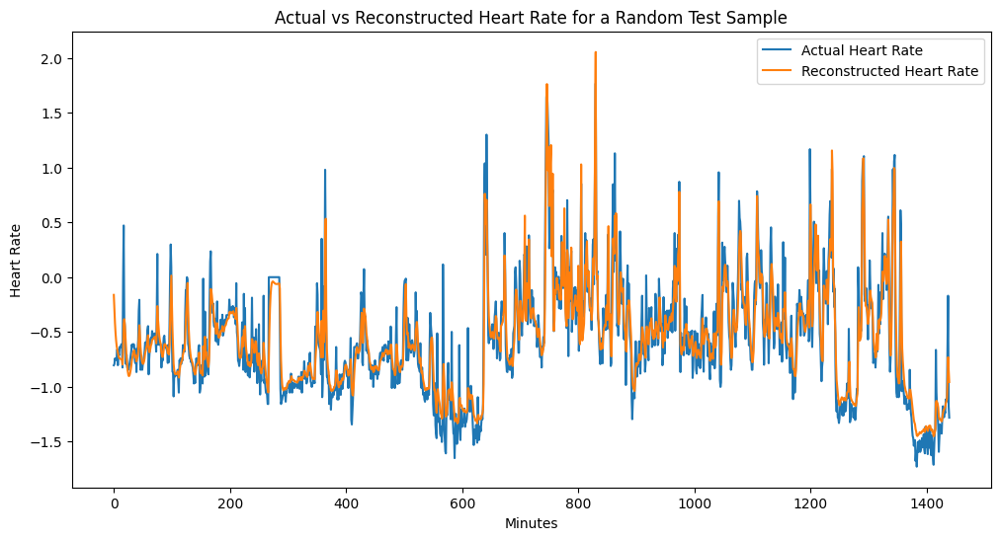

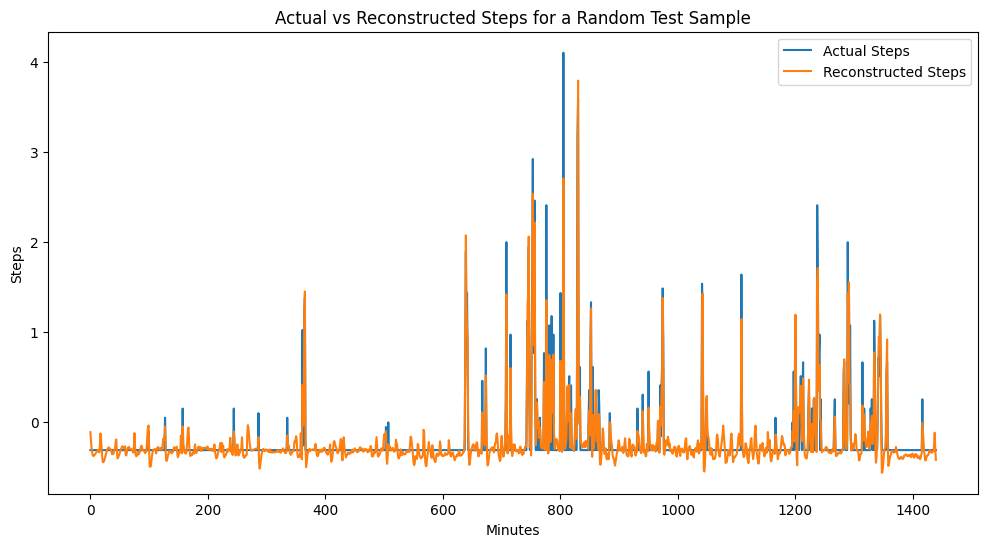

In [ ]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Example function to prepare data for LSTM training
def prepare_data_for_lstm(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequence_length = 1440  # Number of minutes in a day
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Load your data into a DataFrame (assuming 'minute_data' is a DataFrame)
# For example: merged_data = pd.read_csv('your_data.csv')

# Fill NaN with column mean
merged_data[5553957443].fillna(merged_data[5553957443].mean(), inplace=True)

# Prepare data for LSTM training
data = merged_data[5553957443][['Value', 'Steps']]
X, scaler = prepare_data_for_lstm(data)

# Verify shape of X (samples, time_steps, features)
print(f"Shape of X: {X.shape}")  # Should print (number_of_samples, 1440, number_of_features)

# Split data into training, validation, and test sets
train_data, test_data = train_test_split(X, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(train_data, test_size=0.2, random_state=42)

# Initialize LSTM model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(1440, X.shape[2])))
model.add(LSTM(units=50, return_sequences=True))  # Ensure this layer returns sequences
model.add(Dense(units=X.shape[2]))  # Adjust units based on number of features
model.compile(optimizer='adam', loss='mean_squared_error')

# Example of training the model
history = model.fit(train_data, train_data, epochs=100, batch_size=32, validation_data=(val_data, val_data))

# Plot training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Evaluate the model on the test data
test_loss = model.evaluate(test_data, test_data)
print(f"Test Loss: {test_loss}")

# Predict on the test data
predictions = model.predict(test_data)

# Calculate reconstruction error (MSE) for the test set
from sklearn.metrics import mean_squared_error

test_mse = mean_squared_error(test_data.reshape(-1, test_data.shape[-1]), predictions.reshape(-1, predictions.shape[-1]))
print(f"Test Reconstruction Error (MSE): {test_mse}")

# Plot actual vs reconstructed heart rate for a random test sample
random_index = np.random.randint(0, test_data.shape[0])
plt.figure(figsize=(12, 6))
plt.plot(test_data[random_index, :, 0], label='Actual Heart Rate')
plt.plot(predictions[random_index, :, 0], label='Reconstructed Heart Rate')
plt.xlabel('Minutes')
plt.ylabel('Heart Rate')
plt.title('Actual vs Reconstructed Heart Rate for a Random Test Sample')
plt.legend()
plt.show()

# Plot actual vs reconstructed steps for a random test sample
plt.figure(figsize=(12, 6))
plt.plot(test_data[random_index, :, 1], label='Actual Steps')
plt.plot(predictions[random_index, :, 1], label='Reconstructed Steps')
plt.xlabel('Minutes')
plt.ylabel('Steps')
plt.title('Actual vs Reconstructed Steps for a Random Test Sample')
plt.legend()
plt.show()


Shape of X: (30, 1440, 2)
Epoch 1/100
1/1 [==============================] - 14s 14s/step - loss: 0.8093 - val_loss: 1.0622
Epoch 2/100
1/1 [==============================] - 2s 2s/step - loss: 0.7643 - val_loss: 0.9985
Epoch 3/100
1/1 [==============================] - 4s 4s/step - loss: 0.7225 - val_loss: 0.9382
Epoch 4/100
1/1 [==============================] - 4s 4s/step - loss: 0.6835 - val_loss: 0.8810
Epoch 5/100
1/1 [==============================] - 1s 1s/step - loss: 0.6471 - val_loss: 0.8271
Epoch 6/100
1/1 [==============================] - 1s 1s/step - loss: 0.6135 - val_loss: 0.7771
Epoch 7/100
1/1 [==============================] - 2s 2s/step - loss: 0.5830 - val_loss: 0.7316
Epoch 8/100
1/1 [==============================] - 1s 1s/step - loss: 0.5559 - val_loss: 0.6914
Epoch 9/100
1/1 [==============================] - 1s 1s/step - loss: 0.5326 - val_loss: 0.6574
Epoch 10/100
1/1 [==============================] - 1s 1s/step - loss: 0.5136 - val_loss: 0.6296
Epoch 11/10

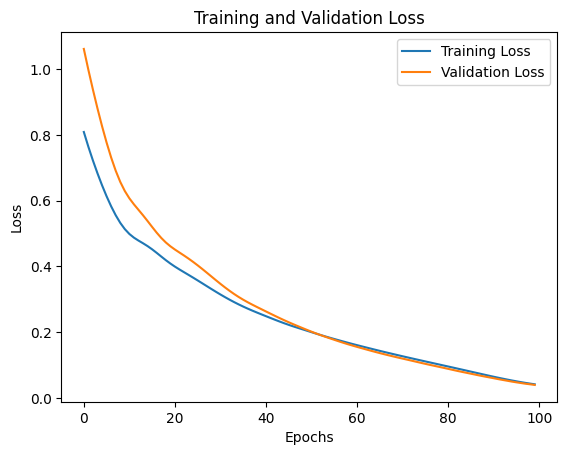

1/1 [==============================] - 0s 410ms/step


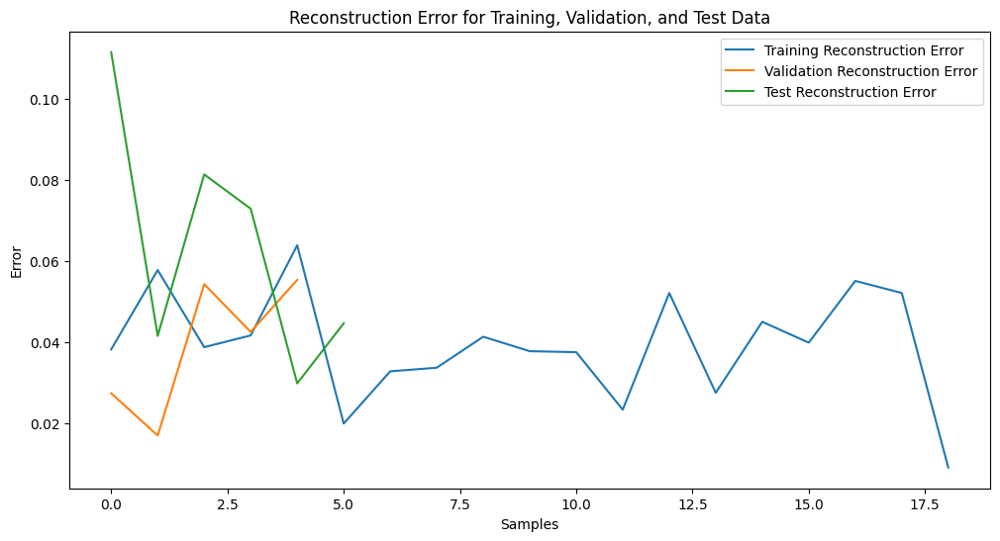

Threshold for anomaly detection: 0.08018713379173194
Number of anomalies in the test set: 2


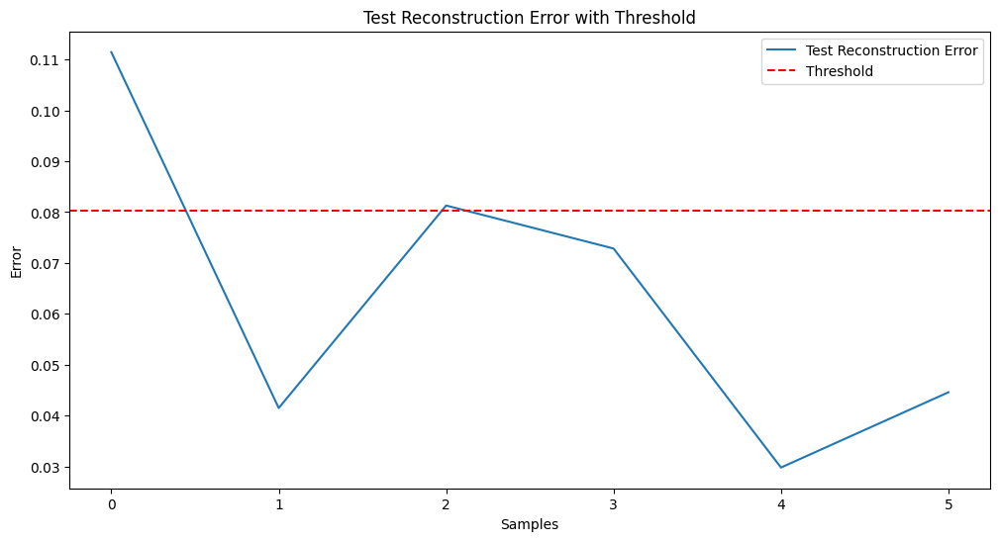

In [ ]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Example function to prepare data for LSTM training
def prepare_data_for_lstm(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequence_length = 1440  # Number of minutes in a day
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Load your data into a DataFrame (assuming 'minute_data' is a DataFrame)
# For example: merged_data = pd.read_csv('your_data.csv')

# Fill NaN with column mean
merged_data[5553957443].fillna(merged_data[5553957443].mean(), inplace=True)

# Prepare data for LSTM training
data = merged_data[5553957443][['Value', 'Steps']]
X, scaler = prepare_data_for_lstm(data)

# Verify shape of X (samples, time_steps, features)
print(f"Shape of X: {X.shape}")  # Should print (number_of_samples, 1440, number_of_features)

# Split data into training, validation, and test sets
train_data, test_data = train_test_split(X, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(train_data, test_size=0.2, random_state=42)

# Initialize LSTM model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(1440, X.shape[2])))
model.add(LSTM(units=50, return_sequences=True))  # Ensure this layer returns sequences
model.add(Dense(units=X.shape[2]))  # Adjust units based on number of features
model.compile(optimizer='adam', loss='mean_squared_error')

# Example of training the model
history = model.fit(train_data, train_data, epochs=100, batch_size=32, validation_data=(val_data, val_data))

# Plot training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Predict on the training, validation, and test data
train_predictions = model.predict(train_data)
val_predictions = model.predict(val_data)
test_predictions = model.predict(test_data)

# Calculate reconstruction error (MSE) for each set
from sklearn.metrics import mean_squared_error

train_mse = np.mean(np.square(train_data - train_predictions), axis=(1, 2))
val_mse = np.mean(np.square(val_data - val_predictions), axis=(1, 2))
test_mse = np.mean(np.square(test_data - test_predictions), axis=(1, 2))

# Plot reconstruction error for training, validation, and test sets
plt.figure(figsize=(12, 6))
plt.plot(train_mse, label='Training Reconstruction Error')
plt.plot(val_mse, label='Validation Reconstruction Error')
plt.plot(test_mse, label='Test Reconstruction Error')
plt.xlabel('Samples')
plt.ylabel('Error')
plt.title('Reconstruction Error for Training, Validation, and Test Data')
plt.legend()
plt.show()

# Calculate thresholds based on training and validation errors
train_val_mse = np.concatenate([train_mse, val_mse])
threshold = np.mean(train_val_mse) + 3 * np.std(train_val_mse)
print(f"Threshold for anomaly detection: {threshold}")

# Check if test errors are within the threshold
anomalies = test_mse > threshold
print(f"Number of anomalies in the test set: {np.sum(anomalies)}")

# Plot test reconstruction errors and the threshold
plt.figure(figsize=(12, 6))
plt.plot(test_mse, label='Test Reconstruction Error')
plt.axhline(y=threshold, color='r', linestyle='--', label='Threshold')
plt.xlabel('Samples')
plt.ylabel('Error')
plt.title('Test Reconstruction Error with Threshold')
plt.legend()
plt.show()


Shape of X: (30, 1440, 2)
Epoch 1/100
1/1 [==============================] - 9s 9s/step - loss: 1.0437 - val_loss: 1.2978
Epoch 2/100
1/1 [==============================] - 1s 1s/step - loss: 0.9474 - val_loss: 1.1833
Epoch 3/100
1/1 [==============================] - 1s 1s/step - loss: 0.8619 - val_loss: 1.0787
Epoch 4/100
1/1 [==============================] - 1s 1s/step - loss: 0.7848 - val_loss: 0.9820
Epoch 5/100
1/1 [==============================] - 1s 1s/step - loss: 0.7145 - val_loss: 0.8931
Epoch 6/100
1/1 [==============================] - 2s 2s/step - loss: 0.6509 - val_loss: 0.8124
Epoch 7/100
1/1 [==============================] - 2s 2s/step - loss: 0.5942 - val_loss: 0.7414
Epoch 8/100
1/1 [==============================] - 2s 2s/step - loss: 0.5453 - val_loss: 0.6818
Epoch 9/100
1/1 [==============================] - 2s 2s/step - loss: 0.5056 - val_loss: 0.6352
Epoch 10/100
1/1 [==============================] - 1s 1s/step - loss: 0.4760 - val_loss: 0.6022
Epoch 11/100


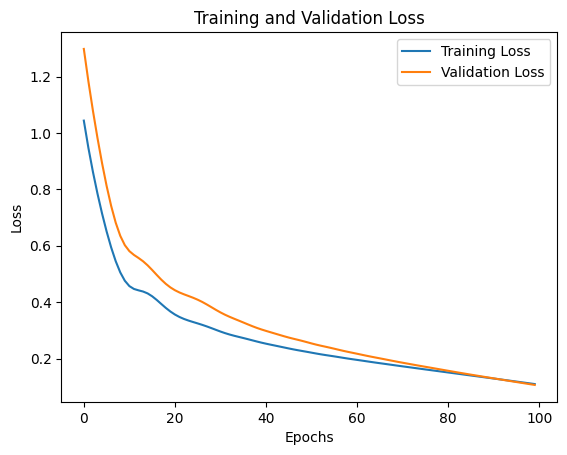

1/1 [==============================] - 0s 212ms/step - loss: 0.1180
Test Loss: 0.1180301383137703
1/1 [==============================] - 1s 1s/step
Test Reconstruction Error (MSE): 0.11803013435694523


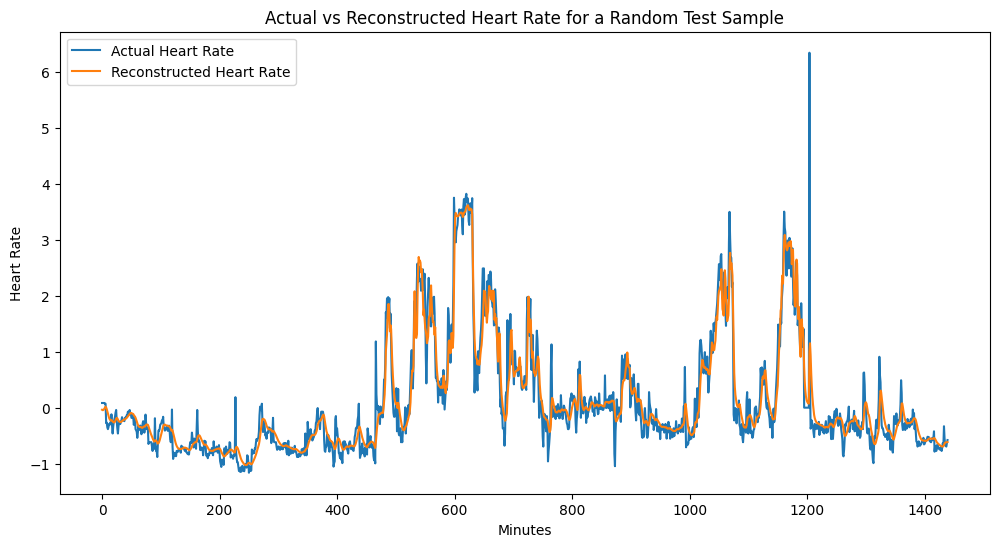

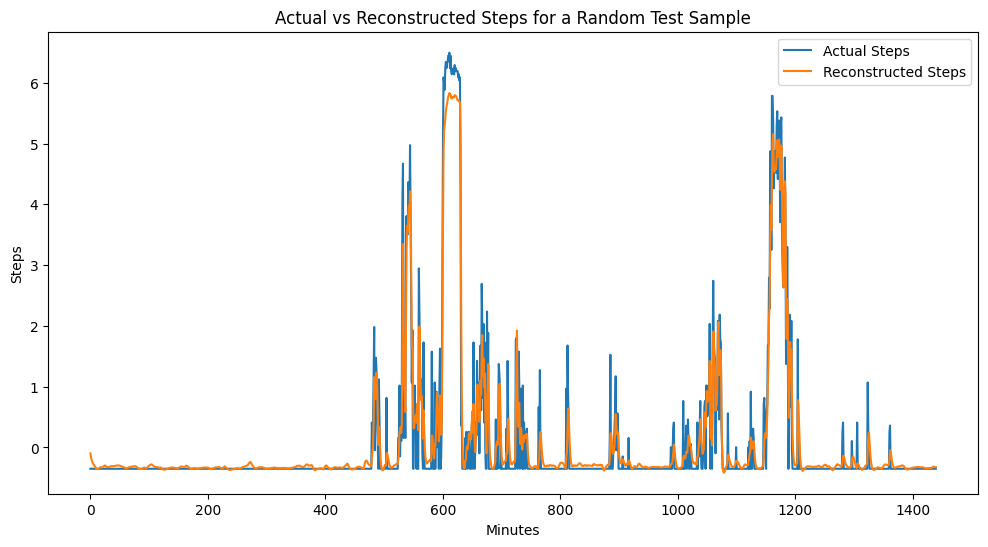

In [ ]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Example function to prepare data for LSTM training
def prepare_data_for_lstm(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequence_length = 1440  # Number of minutes in a day
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Load your data into a DataFrame (assuming 'minute_data' is a DataFrame)
# For example: merged_data = pd.read_csv('your_data.csv')

# Fill NaN with column mean
merged_data[6962181067].fillna(merged_data[6962181067].mean(), inplace=True)

# Prepare data for LSTM training
data = merged_data[6962181067][['Value', 'Steps']]
X, scaler = prepare_data_for_lstm(data)

# Verify shape of X (samples, time_steps, features)
print(f"Shape of X: {X.shape}")  # Should print (number_of_samples, 1440, number_of_features)

# Split data into training, validation, and test sets
train_data, test_data = train_test_split(X, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(train_data, test_size=0.2, random_state=42)

# Initialize LSTM model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(1440, X.shape[2])))
model.add(LSTM(units=50, return_sequences=True))  # Ensure this layer returns sequences
model.add(Dense(units=X.shape[2]))  # Adjust units based on number of features
model.compile(optimizer='adam', loss='mean_squared_error')

# Example of training the model
history = model.fit(train_data, train_data, epochs=100, batch_size=32, validation_data=(val_data, val_data))

# Plot training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Evaluate the model on the test data
test_loss = model.evaluate(test_data, test_data)
print(f"Test Loss: {test_loss}")

# Predict on the test data
predictions = model.predict(test_data)

# Calculate reconstruction error (MSE) for the test set
from sklearn.metrics import mean_squared_error

test_mse = mean_squared_error(test_data.reshape(-1, test_data.shape[-1]), predictions.reshape(-1, predictions.shape[-1]))
print(f"Test Reconstruction Error (MSE): {test_mse}")

# Plot actual vs reconstructed heart rate for a random test sample
random_index = np.random.randint(0, test_data.shape[0])
plt.figure(figsize=(12, 6))
plt.plot(test_data[random_index, :, 0], label='Actual Heart Rate')
plt.plot(predictions[random_index, :, 0], label='Reconstructed Heart Rate')
plt.xlabel('Minutes')
plt.ylabel('Heart Rate')
plt.title('Actual vs Reconstructed Heart Rate for a Random Test Sample')
plt.legend()
plt.show()

# Plot actual vs reconstructed steps for a random test sample
plt.figure(figsize=(12, 6))
plt.plot(test_data[random_index, :, 1], label='Actual Steps')
plt.plot(predictions[random_index, :, 1], label='Reconstructed Steps')
plt.xlabel('Minutes')
plt.ylabel('Steps')
plt.title('Actual vs Reconstructed Steps for a Random Test Sample')
plt.legend()
plt.show()

Shape of X: (30, 1440, 2)
Epoch 1/100
1/1 [==============================] - 9s 9s/step - loss: 0.9013 - val_loss: 1.1409
Epoch 2/100
1/1 [==============================] - 2s 2s/step - loss: 0.8370 - val_loss: 1.0693
Epoch 3/100
1/1 [==============================] - 2s 2s/step - loss: 0.7801 - val_loss: 1.0035
Epoch 4/100
1/1 [==============================] - 1s 1s/step - loss: 0.7285 - val_loss: 0.9419
Epoch 5/100
1/1 [==============================] - 1s 1s/step - loss: 0.6810 - val_loss: 0.8836
Epoch 6/100
1/1 [==============================] - 2s 2s/step - loss: 0.6367 - val_loss: 0.8281
Epoch 7/100
1/1 [==============================] - 1s 1s/step - loss: 0.5954 - val_loss: 0.7755
Epoch 8/100
1/1 [==============================] - 1s 1s/step - loss: 0.5573 - val_loss: 0.7264
Epoch 9/100
1/1 [==============================] - 2s 2s/step - loss: 0.5229 - val_loss: 0.6821
Epoch 10/100
1/1 [==============================] - 3s 3s/step - loss: 0.4932 - val_loss: 0.6435
Epoch 11/100


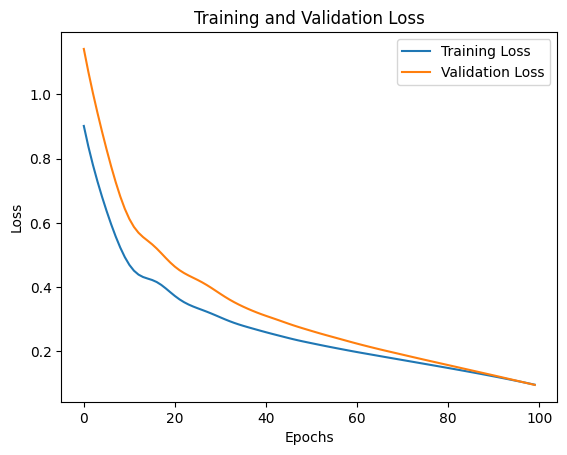

1/1 [==============================] - 0s 221ms/step - loss: 0.1039
Test Loss: 0.10394519567489624
1/1 [==============================] - 0s 235ms/step


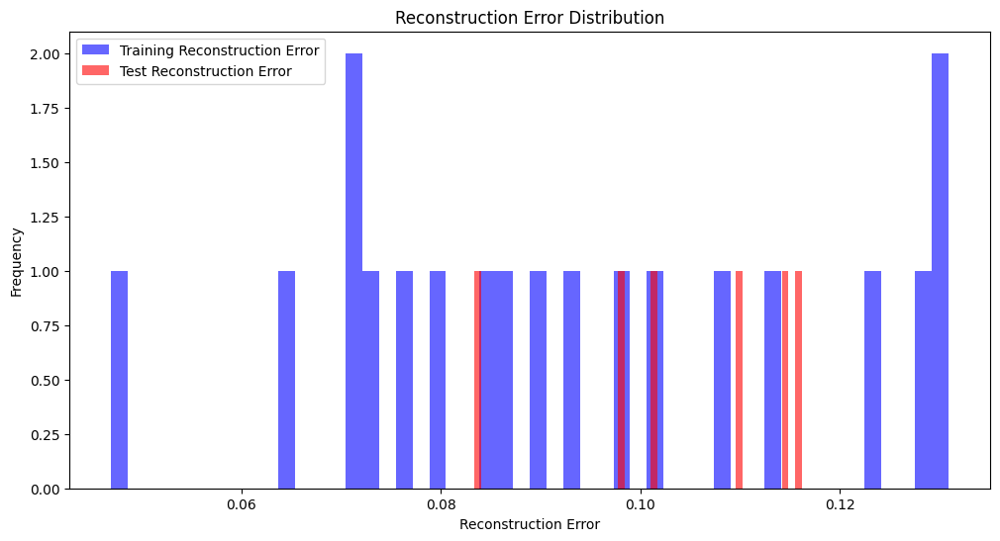

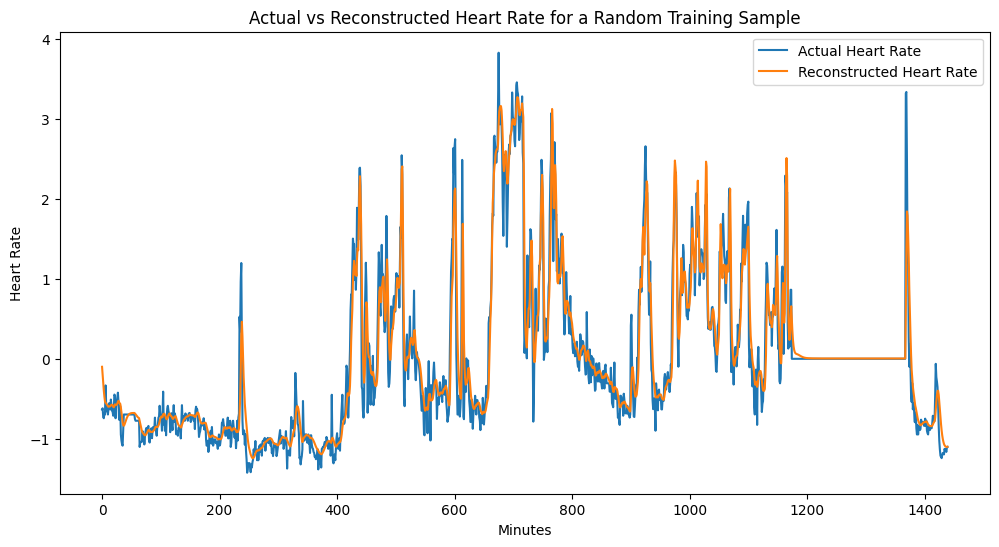

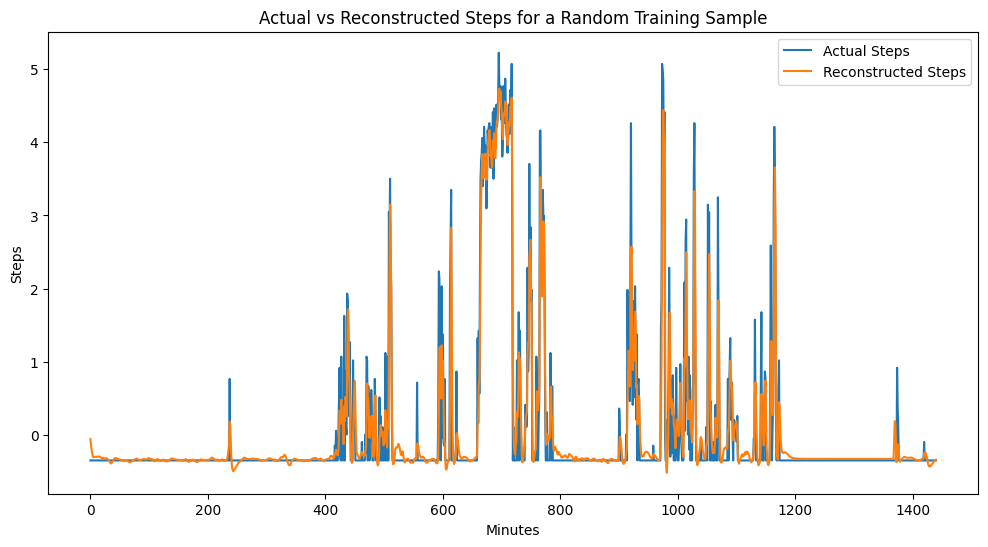

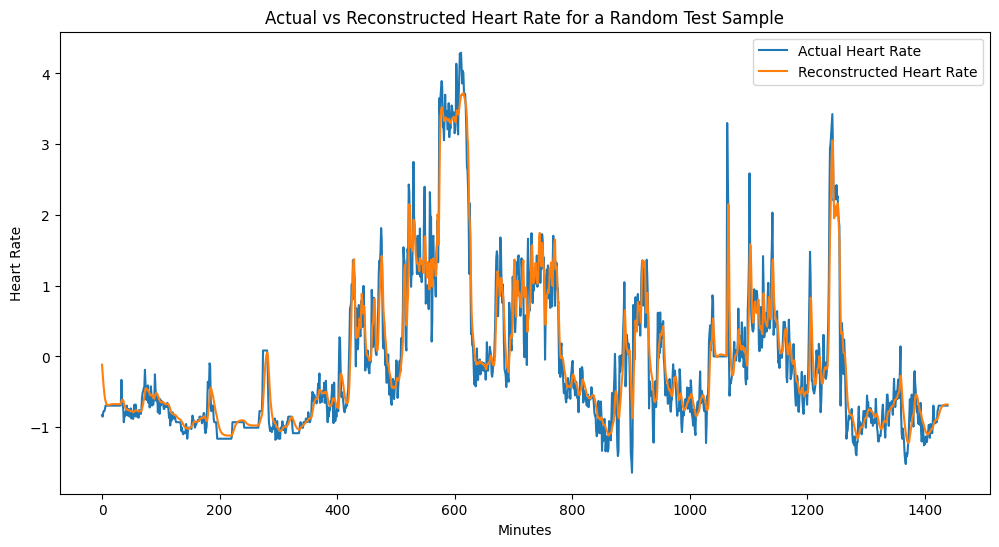

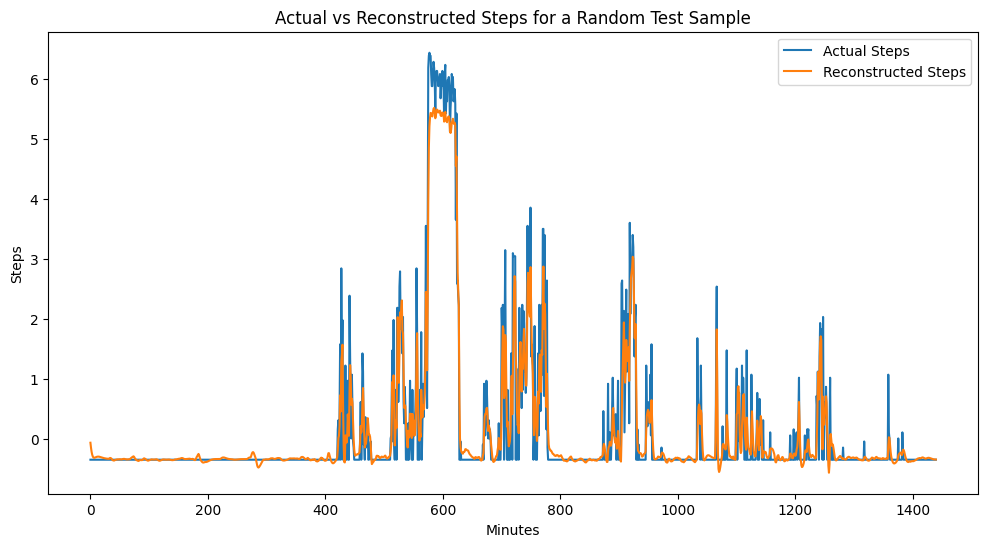

In [ ]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Function to prepare data for LSTM training
def prepare_data_for_lstm(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequence_length = 1440  # Number of minutes in a day
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Load your data into a DataFrame (assuming 'minute_data' is a DataFrame)
# For example: merged_data = pd.read_csv('your_data.csv')

# Fill NaN with column mean
merged_data[6962181067].fillna(merged_data[6962181067].mean(), inplace=True)

# Prepare data for LSTM training
data = merged_data[6962181067][['Value', 'Steps']]
X, scaler = prepare_data_for_lstm(data)

# Verify shape of X (samples, time_steps, features)
print(f"Shape of X: {X.shape}")  # Should print (number_of_samples, 1440, number_of_features)

# Split data into training, validation, and test sets
train_data, test_data = train_test_split(X, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(train_data, test_size=0.2, random_state=42)

# Initialize LSTM model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(1440, X.shape[2])))
model.add(LSTM(units=50, return_sequences=True))  # Ensure this layer returns sequences
model.add(Dense(units=X.shape[2]))  # Adjust units based on number of features
model.compile(optimizer='adam', loss='mean_squared_error')

# Example of training the model
history = model.fit(train_data, train_data, epochs=100, batch_size=32, validation_data=(val_data, val_data))

# Plot training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Evaluate the model on the test data
test_loss = model.evaluate(test_data, test_data)
print(f"Test Loss: {test_loss}")

# Predict on the training and test data
train_predictions = model.predict(train_data)
test_predictions = model.predict(test_data)

# Calculate reconstruction error (MSE) for the training and test sets
train_mse = np.mean(np.square(train_data - train_predictions), axis=(1, 2))
test_mse = np.mean(np.square(test_data - test_predictions), axis=(1, 2))

# Plot reconstruction error for training and test sets
plt.figure(figsize=(12, 6))
plt.hist(train_mse, bins=50, alpha=0.6, label='Training Reconstruction Error', color='blue')
plt.hist(test_mse, bins=50, alpha=0.6, label='Test Reconstruction Error', color='red')
plt.xlabel('Reconstruction Error')
plt.ylabel('Frequency')
plt.title('Reconstruction Error Distribution')
plt.legend()
plt.show()

# Plot actual vs reconstructed heart rate for a random training sample
random_index = np.random.randint(0, train_data.shape[0])
plt.figure(figsize=(12, 6))
plt.plot(train_data[random_index, :, 0], label='Actual Heart Rate')
plt.plot(train_predictions[random_index, :, 0], label='Reconstructed Heart Rate')
plt.xlabel('Minutes')
plt.ylabel('Heart Rate')
plt.title('Actual vs Reconstructed Heart Rate for a Random Training Sample')
plt.legend()
plt.show()

# Plot actual vs reconstructed steps for a random training sample
plt.figure(figsize=(12, 6))
plt.plot(train_data[random_index, :, 1], label='Actual Steps')
plt.plot(train_predictions[random_index, :, 1], label='Reconstructed Steps')
plt.xlabel('Minutes')
plt.ylabel('Steps')
plt.title('Actual vs Reconstructed Steps for a Random Training Sample')
plt.legend()
plt.show()

# Plot actual vs reconstructed heart rate for a random test sample
random_index = np.random.randint(0, test_data.shape[0])
plt.figure(figsize=(12, 6))
plt.plot(test_data[random_index, :, 0], label='Actual Heart Rate')
plt.plot(test_predictions[random_index, :, 0], label='Reconstructed Heart Rate')
plt.xlabel('Minutes')
plt.ylabel('Heart Rate')
plt.title('Actual vs Reconstructed Heart Rate for a Random Test Sample')
plt.legend()
plt.show()

# Plot actual vs reconstructed steps for a random test sample
plt.figure(figsize=(12, 6))
plt.plot(test_data[random_index, :, 1], label='Actual Steps')
plt.plot(test_predictions[random_index, :, 1], label='Reconstructed Steps')
plt.xlabel('Minutes')
plt.ylabel('Steps')
plt.title('Actual vs Reconstructed Steps for a Random Test Sample')
plt.legend()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Lambda
from tensorflow.keras.losses import mse
from tensorflow.keras import backend as K
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Function to prepare data for LSTM training
def prepare_data_for_lstm(data, sequence_length=1440):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Sampling function for the variational autoencoder
def sampling(args):
    z_mean, z_log_var = args
    batch = K.shape(z_mean)[0]
    dim = K.int_shape(z_mean)[1]
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

# Define the variational LSTM autoencoder model
def create_variational_lstm_autoencoder(input_shape, latent_dim=50):
    inputs = Input(shape=input_shape)
    encoded = LSTM(50, return_sequences=False)(inputs)

    z_mean = Dense(latent_dim)(encoded)
    z_log_var = Dense(latent_dim)(encoded)

    z = Lambda(sampling, output_shape=(latent_dim,))([z_mean, z_log_var])

    encoder = Model(inputs, [z_mean, z_log_var, z], name='encoder')

    latent_inputs = Input(shape=(latent_dim,), name='z_sampling')
    x = Dense(input_shape[0])(latent_inputs)
    x = LSTM(50, return_sequences=True)(x)
    decoded = LSTM(input_shape[1], return_sequences=True)(x)

    decoder = Model(latent_inputs, decoded, name='decoder')

    outputs = decoder(encoder(inputs)[2])
    vae = Model(inputs, outputs, name='vae')

    reconstruction_loss = mse(inputs, outputs)
    reconstruction_loss *= input_shape[0] * input_shape[1]
    kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
    kl_loss = K.sum(kl_loss, axis=-1)
    kl_loss *= -0.5
    vae_loss = K.mean(reconstruction_loss + kl_loss)
    vae.add_loss(vae_loss)
    vae.compile(optimizer='adam')

    return vae, encoder, decoder

# Load your data into a DataFrame (assuming 'minute_data' is a DataFrame)
# For example: merged_data = pd.read_csv('your_data.csv')

# Fill NaN with column mean
merged_data[6962181067].fillna(merged_data[6962181067].mean(), inplace=True)

# Prepare data for LSTM training
data = merged_data[6962181067][['Value', 'Steps']]
X, scaler = prepare_data_for_lstm(data)

# Verify shape of X (samples, time_steps, features)
print(f"Shape of X: {X.shape}")  # Should print (number_of_samples, 1440, number_of_features)

# Split data into training, validation, and test sets
train_data, test_data = train_test_split(X, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(train_data, test_size=0.2, random_state=42)

# Initialize and train the variational LSTM autoencoder
vae, encoder, decoder = create_variational_lstm_autoencoder((1440, X.shape[2]))

history = vae.fit(train_data, epochs=100, batch_size=32, validation_data=(val_data, None))

# Plot training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Predict on the training, validation, and test data
train_predictions = vae.predict(train_data)
val_predictions = vae.predict(val_data)
test_predictions = vae.predict(test_data)

# Calculate reconstruction error (MSE) for each set
train_mse = np.mean(np.square(train_data - train_predictions), axis=(1, 2))
val_mse = np.mean(np.square(val_data - val_predictions), axis=(1, 2))
test_mse = np.mean(np.square(test_data - test_predictions), axis=(1, 2))

# Plot reconstruction error for training, validation, and test sets
plt.figure(figsize=(12, 6))
plt.plot(train_mse, label='Training Reconstruction Error')
plt.plot(val_mse, label='Validation Reconstruction Error')
plt.plot(test_mse, label='Test Reconstruction Error')
plt.xlabel('Samples')
plt.ylabel('Error')
plt.title('Reconstruction Error for Training, Validation, and Test Data')
plt.legend()
plt.show()

# Plot actual vs reconstructed heart rate for a random training sample
random_index = np.random.randint(0, train_data.shape[0])
plt.figure(figsize=(12, 6))
plt.plot(train_data[random_index, :, 0], label='Actual Heart Rate')
plt.plot(train_predictions[random_index, :, 0], label='Reconstructed Heart Rate')
plt.xlabel('Minutes')
plt.ylabel('Heart Rate')
plt.title('Actual vs Reconstructed Heart Rate for a Random Training Sample')
plt.legend()
plt.show()

# Plot actual vs reconstructed steps for a random training sample
plt.figure(figsize=(12, 6))
plt.plot(train_data[random_index, :, 1], label='Actual Steps')
plt.plot(train_predictions[random_index, :, 1], label='Reconstructed Steps')
plt.xlabel('Minutes')
plt.ylabel('Steps')
plt.title('Actual vs Reconstructed Steps for a Random Training Sample')
plt.legend()
plt.show()

# Plot actual vs reconstructed heart rate for a random test sample
random_index = np.random.randint(0, test_data.shape[0])
plt.figure(figsize=(12, 6))
plt.plot(test_data[random_index, :, 0], label='Actual Heart Rate')
plt.plot(test_predictions[random_index, :, 0], label='Reconstructed Heart Rate')
plt.xlabel('Minutes')
plt.ylabel('Heart Rate')
plt.title('Actual vs Reconstructed Heart Rate for a Random Test Sample')
plt.legend()
plt.show()

# Plot actual vs reconstructed steps for a random test sample
plt.figure(figsize=(12, 6))
plt.plot(test_data[random_index, :, 1], label='Actual Steps')
plt.plot(test_predictions[random_index, :, 1], label='Reconstructed Steps')
plt.xlabel('Minutes')
plt.ylabel('Steps')
plt.title('Actual vs Reconstructed Steps for a Random Test Sample')
plt.legend()
plt.show()


Shape of X: (30, 1440, 2)


ValueError: Input 0 of layer "lstm_11" is incompatible with the layer: expected ndim=3, found ndim=2. Full shape received: (None, 1440)

In [ ]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Lambda
from tensorflow.keras.losses import mse
from tensorflow.keras import backend as K
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Example function to prepare data for LSTM training
def prepare_data_for_lstm(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequence_length = 1440  # Number of minutes in a day
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Sampling function for the variational autoencoder
def sampling(args):
    z_mean, z_log_var = args
    batch = K.shape(z_mean)[0]
    dim = K.int_shape(z_mean)[1]
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

# Define the variational LSTM autoencoder model
def create_variational_lstm_autoencoder(input_shape, latent_dim=50):
    inputs = Input(shape=input_shape)
    encoded = LSTM(50, return_sequences=False)(inputs)

    z_mean = Dense(latent_dim)(encoded)
    z_log_var = Dense(latent_dim)(encoded)

    z = Lambda(sampling, output_shape=(latent_dim,))([z_mean, z_log_var])

    encoder = Model(inputs, [z_mean, z_log_var, z], name='encoder')

    latent_inputs = Input(shape=(latent_dim,), name='z_sampling')
    x = Dense(input_shape[1])(latent_inputs)  # Adjust input_shape[1] based on your feature dimension
    x = LSTM(50, return_sequences=True)(x)
    decoded = LSTM(input_shape[1], return_sequences=True)(x)

    decoder = Model(latent_inputs, decoded, name='decoder')

    outputs = decoder(encoder(inputs)[2])
    vae = Model(inputs, outputs, name='vae')

    reconstruction_loss = mse(inputs, outputs)
    reconstruction_loss *= input_shape[0] * input_shape[1]
    kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
    kl_loss = K.sum(kl_loss, axis=-1)
    kl_loss *= -0.5
    vae_loss = K.mean(reconstruction_loss + kl_loss)
    vae.add_loss(vae_loss)
    vae.compile(optimizer='adam')

    return vae, encoder, decoder

# Load your data into a DataFrame (assuming 'minute_data' is a DataFrame)
# For example: merged_data = pd.read_csv('your_data.csv')

# Fill NaN with column mean
merged_data[5553957443].fillna(merged_data[5553957443].mean(), inplace=True)

# Prepare data for LSTM training
data = merged_data[5553957443][['Value', 'Steps']]
X, scaler = prepare_data_for_lstm(data)

# Verify shape of X (samples, time_steps, features)
print(f"Shape of X: {X.shape}")  # Should print (number_of_samples, 1440, number_of_features)

# Split data into training, validation, and test sets
train_data, test_data = train_test_split(X, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(train_data, test_size=0.2, random_state=42)

# Initialize and train the variational LSTM autoencoder
vae, encoder, decoder = create_variational_lstm_autoencoder((1440, X.shape[2]))

history = vae.fit(train_data, epochs=100, batch_size=32, validation_data=(val_data, None))

# Plot training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Predict on the training, validation, and test data
train_predictions = vae.predict(train_data)
val_predictions = vae.predict(val_data)
test_predictions = vae.predict(test_data)

# Calculate reconstruction error (MSE) for each set
train_mse = np.mean(np.square(train_data - train_predictions), axis=(1, 2))
val_mse = np.mean(np.square(val_data - val_predictions), axis=(1, 2))
test_mse = np.mean(np.square(test_data - test_predictions), axis=(1, 2))

# Plot reconstruction error for training, validation, and test sets
plt.figure(figsize=(12, 6))
plt.plot(train_mse, label='Training Reconstruction Error')
plt.plot(val_mse, label='Validation Reconstruction Error')
plt.plot(test_mse, label='Test Reconstruction Error')
plt.xlabel('Samples')
plt.ylabel('Error')
plt.title('Reconstruction Error for Training, Validation, and Test Data')
plt.legend()
plt.show()


Shape of X: (30, 1440, 2)


ValueError: Input 0 of layer "lstm_13" is incompatible with the layer: expected ndim=3, found ndim=2. Full shape received: (None, 2)

In [ ]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Lambda
from tensorflow.keras.losses import mse
from tensorflow.keras import backend as K
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Example function to prepare data for LSTM training
def prepare_data_for_lstm(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequence_length = 1440  # Number of minutes in a day
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Sampling function for the variational autoencoder
def sampling(args):
    z_mean, z_log_var = args
    batch = K.shape(z_mean)[0]
    dim = K.int_shape(z_mean)[1]
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

# Define the variational LSTM autoencoder model
def create_variational_lstm_autoencoder(input_shape, latent_dim=50):
    inputs = Input(shape=input_shape)
    encoded = LSTM(50, return_sequences=False)(inputs)

    z_mean = Dense(latent_dim)(encoded)
    z_log_var = Dense(latent_dim)(encoded)

    z = Lambda(sampling, output_shape=(latent_dim,))([z_mean, z_log_var])

    encoder = Model(inputs, [z_mean, z_log_var, z], name='encoder')

    latent_inputs = Input(shape=(latent_dim,), name='z_sampling')
    x = Dense(input_shape[1])(latent_inputs)  # Adjust input_shape[1] based on your feature dimension
    x = RepeatVector(input_shape[0])(x)  # Repeat the latent vector across the time steps
    x = LSTM(50, return_sequences=True)(x)
    decoded = LSTM(input_shape[1], return_sequences=True)(x)

    decoder = Model(latent_inputs, decoded, name='decoder')

    outputs = decoder(encoder(inputs)[2])
    vae = Model(inputs, outputs, name='vae')

    reconstruction_loss = mse(inputs, outputs)
    reconstruction_loss *= input_shape[0] * input_shape[1]
    kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
    kl_loss = K.sum(kl_loss, axis=-1)
    kl_loss *= -0.5
    vae_loss = K.mean(reconstruction_loss + kl_loss)
    vae.add_loss(vae_loss)
    vae.compile(optimizer='adam')

    return vae, encoder, decoder

# Load your data into a DataFrame (assuming 'minute_data' is a DataFrame)
# For example: merged_data = pd.read_csv('your_data.csv')

# Fill NaN with column mean
merged_data[5553957443].fillna(merged_data[5553957443].mean(), inplace=True)

# Prepare data for LSTM training
data = merged_data[5553957443][['Value', 'Steps']]
X, scaler = prepare_data_for_lstm(data)

# Verify shape of X (samples, time_steps, features)
print(f"Shape of X: {X.shape}")  # Should print (number_of_samples, 1440, number_of_features)

# Split data into training, validation, and test sets
train_data, test_data = train_test_split(X, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(train_data, test_size=0.2, random_state=42)

# Initialize and train the variational LSTM autoencoder
vae, encoder, decoder = create_variational_lstm_autoencoder((1440, X.shape[2]))

history = vae.fit(train_data, epochs=100, batch_size=32, validation_data=(val_data, None))

# Plot training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Predict on the training, validation, and test data
train_predictions = vae.predict(train_data)
val_predictions = vae.predict(val_data)
test_predictions = vae.predict(test_data)

# Calculate reconstruction error (MSE) for each set
train_mse = np.mean(np.square(train_data - train_predictions), axis=(1, 2))
val_mse = np.mean(np.square(val_data - val_predictions), axis=(1, 2))
test_mse = np.mean(np.square(test_data - test_predictions), axis=(1, 2))

# Plot reconstruction error for training, validation, and test sets
plt.figure(figsize=(12, 6))
plt.plot(train_mse, label='Training Reconstruction Error')
plt.plot(val_mse, label='Validation Reconstruction Error')
plt.plot(test_mse, label='Test Reconstruction Error')
plt.xlabel('Samples')
plt.ylabel('Error')
plt.title('Reconstruction Error for Training, Validation, and Test Data')
plt.legend()
plt.show()


Shape of X: (30, 1440, 2)


NameError: name 'RepeatVector' is not defined

NameError: name 'participant_data' is not defined

In [ ]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Lambda
from tensorflow.keras.losses import mse
from tensorflow.keras import backend as K
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Example function to prepare data for LSTM training
def prepare_data_for_lstm(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequence_length = 1440  # Number of minutes in a day
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Sampling function for the variational autoencoder
def sampling(args):
    z_mean, z_log_var = args
    batch = K.shape(z_mean)[0]
    dim = K.int_shape(z_mean)[1]
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

# Define the variational LSTM autoencoder model
def create_variational_lstm_autoencoder(input_shape, latent_dim=50):
    inputs = Input(shape=input_shape)
    encoded = LSTM(50, return_sequences=False)(inputs)

    z_mean = Dense(latent_dim)(encoded)
    z_log_var = Dense(latent_dim)(encoded)

    z = Lambda(sampling, output_shape=(latent_dim,))([z_mean, z_log_var])

    encoder = Model(inputs, [z_mean, z_log_var, z], name='encoder')

    latent_inputs = Input(shape=(latent_dim,), name='z_sampling')
    x = Dense(input_shape[0])(latent_inputs)
    x = LSTM(50, return_sequences=True)(x)
    decoded = LSTM(input_shape[1], return_sequences=True)(x)

    decoder = Model(latent_inputs, decoded, name='decoder')

    outputs = decoder(encoder(inputs)[2])
    vae = Model(inputs, outputs, name='vae')

    reconstruction_loss = mse(inputs, outputs)
    reconstruction_loss *= input_shape[0] * input_shape[1]
    kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
    kl_loss = K.sum(kl_loss, axis=-1)
    kl_loss *= -0.5
    vae_loss = K.mean(reconstruction_loss + kl_loss)
    vae.add_loss(vae_loss)
    vae.compile(optimizer='adam')

    return vae, encoder, decoder

# Load your data into a DataFrame (assuming 'minute_data' is a DataFrame)
# For example: merged_data = pd.read_csv('your_data.csv')

# Fill NaN with column mean
merged_data[5553957443].fillna(merged_data[5553957443].mean(), inplace=True)

# Prepare data for LSTM training
data = merged_data[5553957443][['Value', 'Steps']]
X, scaler = prepare_data_for_lstm(data)

# Verify shape of X (samples, time_steps, features)
print(f"Shape of X: {X.shape}")  # Should print (number_of_samples, 1440, number_of_features)

# Split data into training, validation, and test sets
train_data, test_data = train_test_split(X, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(train_data, test_size=0.2, random_state=42)

# Initialize and train the variational LSTM autoencoder
vae, encoder, decoder = create_variational_lstm_autoencoder((1440, X.shape[2]))

history = vae.fit(train_data, epochs=100, batch_size=32, validation_data=(val_data, None))

# Plot training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Predict on the training, validation, and test data
train_predictions = vae.predict(train_data)
val_predictions = vae.predict(val_data)
test_predictions = vae.predict(test_data)

# Calculate reconstruction error (MSE) for each set
train_mse = np.mean(np.square(train_data - train_predictions), axis=(1, 2))
val_mse = np.mean(np.square(val_data - val_predictions), axis=(1, 2))
test_mse = np.mean(np.square(test_data - test_predictions), axis=(1, 2))

# Plot reconstruction error for training, validation, and test sets
plt.figure(figsize=(12, 6))
plt.plot(train_mse, label='Training Reconstruction Error')
plt.plot(val_mse, label='Validation Reconstruction Error')
plt.plot(test_mse, label='Test Reconstruction Error')
plt.xlabel('Samples')
plt.ylabel('Error')
plt.title('Reconstruction Error for Training, Validation, and Test Data')
plt.legend()
plt.show()


Shape of X: (30, 1440, 2)


ValueError: Input 0 of layer "lstm_3" is incompatible with the layer: expected ndim=3, found ndim=2. Full shape received: (None, 1440)

Shape of X: (30, 1440, 2)
Epoch 1/100
1/1 [==============================] - 9s 9s/step - loss: 0.8766 - val_loss: 1.1610
Epoch 2/100
1/1 [==============================] - 1s 1s/step - loss: 0.8204 - val_loss: 1.0804
Epoch 3/100
1/1 [==============================] - 1s 1s/step - loss: 0.7688 - val_loss: 1.0054
Epoch 4/100
1/1 [==============================] - 1s 1s/step - loss: 0.7212 - val_loss: 0.9350
Epoch 5/100
1/1 [==============================] - 1s 1s/step - loss: 0.6772 - val_loss: 0.8690
Epoch 6/100
1/1 [==============================] - 2s 2s/step - loss: 0.6367 - val_loss: 0.8073
Epoch 7/100
1/1 [==============================] - 2s 2s/step - loss: 0.5999 - val_loss: 0.7508
Epoch 8/100
1/1 [==============================] - 2s 2s/step - loss: 0.5672 - val_loss: 0.7006
Epoch 9/100
1/1 [==============================] - 3s 3s/step - loss: 0.5393 - val_loss: 0.6580
Epoch 10/100
1/1 [==============================] - 1s 1s/step - loss: 0.5167 - val_loss: 0.6236
Epoch 11/100


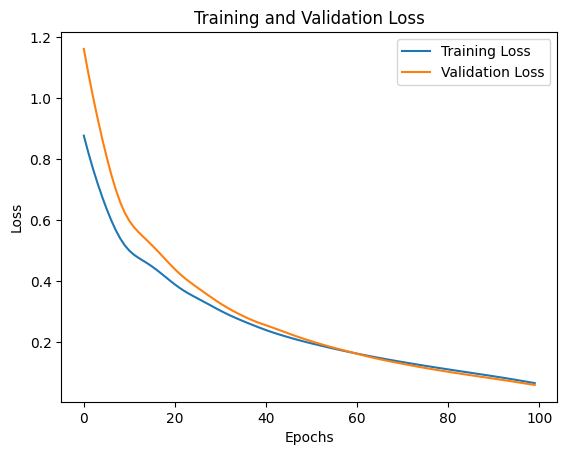

1/1 [==============================] - 0s 218ms/step - loss: 0.0905
Test Loss: 0.09047143906354904
1/1 [==============================] - 0s 214ms/step


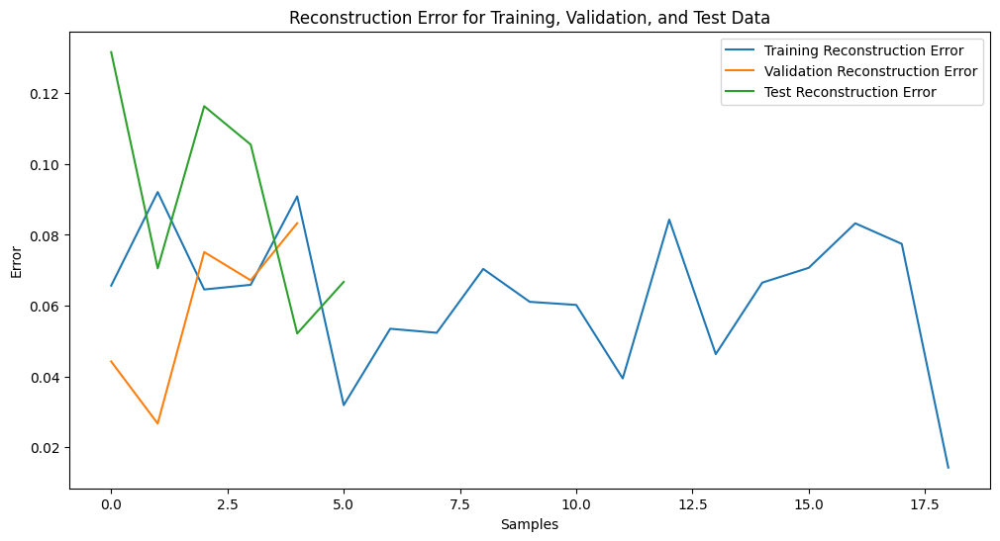

In [ ]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Example function to prepare data for LSTM training
def prepare_data_for_lstm(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequence_length = 1440  # Number of minutes in a day
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Load your data into a DataFrame (assuming 'minute_data' is a DataFrame)
# For example: merged_data = pd.read_csv('your_data.csv')

# Fill NaN with column mean
merged_data[5553957443].fillna(merged_data[5553957443].mean(), inplace=True)

# Prepare data for LSTM training
data = merged_data[5553957443][['Value', 'Steps']]
X, scaler = prepare_data_for_lstm(data)

# Verify shape of X (samples, time_steps, features)
print(f"Shape of X: {X.shape}")  # Should print (number_of_samples, 1440, number_of_features)

# Split data into training, validation, and test sets
train_data, test_data = train_test_split(X, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(train_data, test_size=0.2, random_state=42)

# Initialize LSTM model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(1440, X.shape[2])))
model.add(LSTM(units=50, return_sequences=True))  # Ensure this layer returns sequences
model.add(Dense(units=X.shape[2]))  # Adjust units based on number of features
model.compile(optimizer='adam', loss='mean_squared_error')

# Example of training the model
history = model.fit(train_data, train_data, epochs=100, batch_size=32, validation_data=(val_data, val_data))

# Plot training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Evaluate the model on the test data
test_loss = model.evaluate(test_data, test_data)
print(f"Test Loss: {test_loss}")

# Predict on the training, validation, and test data
train_predictions = model.predict(train_data)
val_predictions = model.predict(val_data)
test_predictions = model.predict(test_data)

# Calculate reconstruction error (MSE) for each set
from sklearn.metrics import mean_squared_error

train_mse = np.mean(np.square(train_data - train_predictions), axis=(1, 2))
val_mse = np.mean(np.square(val_data - val_predictions), axis=(1, 2))
test_mse = np.mean(np.square(test_data - test_predictions), axis=(1, 2))

# Plot reconstruction error for training, validation, and test sets
plt.figure(figsize=(12, 6))
plt.plot(train_mse, label='Training Reconstruction Error')
plt.plot(val_mse, label='Validation Reconstruction Error')
plt.plot(test_mse, label='Test Reconstruction Error')
plt.xlabel('Samples')
plt.ylabel('Error')
plt.title('Reconstruction Error for Training, Validation, and Test Data')
plt.legend()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Lambda
from tensorflow.keras.losses import mse
from tensorflow.keras import backend as K
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Example function to prepare data for LSTM training
def prepare_data_for_lstm(data, sequence_length=1440):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Sampling function for the variational autoencoder
def sampling(args):
    z_mean, z_log_var = args
    batch = K.shape(z_mean)[0]
    dim = K.int_shape(z_mean)[1]
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

# Define the variational LSTM autoencoder model
def create_variational_lstm_autoencoder(input_shape, latent_dim=50):
    inputs = Input(shape=input_shape)
    encoded = LSTM(50, return_sequences=False)(inputs)

    z_mean = Dense(latent_dim)(encoded)
    z_log_var = Dense(latent_dim)(encoded)

    z = Lambda(sampling, output_shape=(latent_dim,))([z_mean, z_log_var])

    encoder = Model(inputs, [z_mean, z_log_var, z], name='encoder')

    latent_inputs = Input(shape=(latent_dim,), name='z_sampling')
    x = Dense(input_shape[0])(latent_inputs)
    x = LSTM(50, return_sequences=True)(x)
    decoded = LSTM(input_shape[1], return_sequences=True)(x)

    decoder = Model(latent_inputs, decoded, name='decoder')

    outputs = decoder(encoder(inputs)[2])
    vae = Model(inputs, outputs, name='vae')

    reconstruction_loss = mse(inputs, outputs)
    reconstruction_loss *= input_shape[0] * input_shape[1]
    kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
    kl_loss = K.sum(kl_loss, axis=-1)
    kl_loss *= -0.5
    vae_loss = K.mean(reconstruction_loss + kl_loss)
    vae.add_loss(vae_loss)
    vae.compile(optimizer='adam')

    return vae, encoder, decoder

# Load your data into a DataFrame (assuming 'minute_data' is a DataFrame)
# For example: merged_data = pd.read_csv('your_data.csv')

# Fill NaN with column mean
merged_data[5553957443].fillna(merged_data[5553957443].mean(), inplace=True)

# Prepare data for LSTM training
data = merged_data[5553957443][['Value', 'Steps']]
X, scaler = prepare_data_for_lstm(data)

# Verify shape of X (samples, time_steps, features)
print(f"Shape of X: {X.shape}")  # Should print (number_of_samples, 1440, number_of_features)

# Split data into training, validation, and test sets
train_data, test_data = train_test_split(X, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(train_data, test_size=0.2, random_state=42)

# Initialize and train the variational LSTM autoencoder
vae, encoder, decoder = create_variational_lstm_autoencoder((1440, X.shape[2]))

history = vae.fit(train_data, epochs=100, batch_size=32, validation_data=(val_data, None))

# Plot training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Evaluate the model on the test data
test_loss = vae.evaluate(test_data)
print(f"Test Loss: {test_loss}")

# Predict on the training and test data
train_predictions = vae.predict(train_data)
test_predictions = vae.predict(test_data)

# Calculate reconstruction error (MSE) for the training and test sets
train_mse = np.mean(np.square(train_data - train_predictions), axis=(1, 2))
test_mse = np.mean(np.square(test_data - test_predictions), axis=(1, 2))

# Plot reconstruction error for training and test sets
plt.figure(figsize=(12, 6))
plt.hist(train_mse, bins=50, alpha=0.6, label='Training Reconstruction Error', color='blue')
plt.hist(test_mse, bins=50, alpha=0.6, label='Test Reconstruction Error', color='red')
plt.xlabel('Reconstruction Error')
plt.ylabel('Frequency')
plt.title('Reconstruction Error Distribution')
plt.legend()
plt.show()

# Plot actual vs reconstructed heart rate for a random training sample
random_index = np.random.randint(0, train_data.shape[0])
plt.figure(figsize=(12, 6))
plt.plot(train_data[random_index, :, 0], label='Actual Heart Rate')
plt.plot(train_predictions[random_index, :, 0], label='Reconstructed Heart Rate')
plt.xlabel('Minutes')
plt.ylabel('Heart Rate')
plt.title('Actual vs Reconstructed Heart Rate for a Random Training Sample')
plt.legend()
plt.show()

# Plot actual vs reconstructed steps for a random training sample
plt.figure(figsize=(12, 6))
plt.plot(train_data[random_index, :, 1], label='Actual Steps')
plt.plot(train_predictions[random_index, :, 1], label='Reconstructed Steps')
plt.xlabel('Minutes')
plt.ylabel('Steps')
plt.title('Actual vs Reconstructed Steps for a Random Training Sample')
plt.legend()
plt.show()

# Plot actual vs reconstructed heart rate for a random test sample
random_index = np.random.randint(0, test_data.shape[0])
plt.figure(figsize=(12, 6))
plt.plot(test_data[random_index, :, 0], label='Actual Heart Rate')
plt.plot(test_predictions[random_index, :, 0], label='Reconstructed Heart Rate')
plt.xlabel('Minutes')
plt.ylabel('Heart Rate')
plt.title('Actual vs Reconstructed Heart Rate for a Random Test Sample')
plt.legend()
plt.show()

# Plot actual vs reconstructed steps for a random test sample
plt.figure(figsize=(12, 6))
plt.plot(test_data[random_index, :, 1], label='Actual Steps')
plt.plot(test_predictions[random_index, :, 1], label='Reconstructed Steps')
plt.xlabel('Minutes')
plt.ylabel('Steps')
plt.title('Actual vs Reconstructed Steps for a Random Test Sample')
plt.legend()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Example function to prepare data for LSTM training
def prepare_data_for_lstm(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequence_length = 1440  # Number of minutes in a day
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Load your data into a DataFrame (assuming 'minute_data' is a DataFrame)
# For example: merged_data = pd.read_csv('your_data.csv')

# Fill NaN with column mean
merged_data[5553957443].fillna(merged_data[5553957443].mean(), inplace=True)

# Prepare data for LSTM training
data = merged_data[5553957443][['Value', 'Steps']]
X, scaler = prepare_data_for_lstm(data)

# Verify shape of X (samples, time_steps, features)
print(f"Shape of X: {X.shape}")  # Should print (number_of_samples, 1440, number_of_features)

# Split data into training, validation, and test sets
train_data, test_data = train_test_split(X, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(train_data, test_size=0.2, random_state=42)

# Initialize LSTM model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(1440, X.shape[2])))
model.add(LSTM(units=50, return_sequences=True))  # Ensure this layer returns sequences
model.add(Dense(units=X.shape[2]))  # Adjust units based on number of features
model.compile(optimizer='adam', loss='mean_squared_error')

# Example of training the model
history = model.fit(train_data, train_data, epochs=100, batch_size=32, validation_data=(val_data, val_data))

# Plot training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Evaluate the model on the test data
test_loss = model.evaluate(test_data, test_data)
print(f"Test Loss: {test_loss}")

# Predict on the test data
predictions = model.predict(test_data)

# Calculate reconstruction error (MSE) for the test set
from sklearn.metrics import mean_squared_error

test_mse = mean_squared_error(test_data.reshape(-1, test_data.shape[-1]), predictions.reshape(-1, predictions.shape[-1]))
print(f"Test Reconstruction Error (MSE): {test_mse}")

# Plot actual vs reconstructed heart rate for a random test sample
random_index = np.random.randint(0, test_data.shape[0])
plt.figure(figsize=(12, 6))
plt.plot(test_data[random_index, :, 0], label='Actual Heart Rate')
plt.plot(predictions[random_index, :, 0], label='Reconstructed Heart Rate')
plt.xlabel('Minutes')
plt.ylabel('Heart Rate')
plt.title('Actual vs Reconstructed Heart Rate for a Random Test Sample')
plt.legend()
plt.show()

# Plot actual vs reconstructed steps for a random test sample
plt.figure(figsize=(12, 6))
plt.plot(test_data[random_index, :, 1], label='Actual Steps')
plt.plot(predictions[random_index, :, 1], label='Reconstructed Steps')
plt.xlabel('Minutes')
plt.ylabel('Steps')
plt.title('Actual vs Reconstructed Steps for a Random Test Sample')
plt.legend()
plt.show()


In [ ]:
merged_data[6962181067]

,Id_hr,Value,Id_steps,Steps
2016-04-12 00:00:00,6.962181e+09,71.750000,6.962181e+09,0.0
2016-04-12 00:01:00,6.962181e+09,73.000000,6.962181e+09,0.0
2016-04-12 00:02:00,6.962181e+09,75.500000,6.962181e+09,0.0
2016-04-12 00:03:00,6.962181e+09,74.833333,6.962181e+09,0.0
2016-04-12 00:04:00,6.962181e+09,75.000000,6.962181e+09,0.0
...,...,...,...,...
2016-05-12 11:55:00,6.962181e+09,87.000000,6.962181e+09,0.0
2016-05-12 11:56:00,6.962181e+09,94.750000,6.962181e+09,0.0
2016-05-12 11:57:00,NaN,NaN,6.962181e+09,0.0
2016-05-12 11:58:00,NaN,NaN,6.962181e+09,0.0


In [ ]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Example function to prepare data for LSTM training
def prepare_data_for_lstm(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequence_length = 1440  # Number of minutes in a day
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Assuming merged_data is already loaded and cleaned
# Fill NaN with column mean
merged_data['6962181067'].fillna(merged_data['6962181067'].mean(), inplace=True)

# Prepare data for LSTM training
data = merged_data['6962181067'][['Value', 'Steps']]
X, scaler = prepare_data_for_lstm(data)

# Verify shape of X (samples, time_steps, features)
print(f"Shape of X: {X.shape}")  # Should print (number_of_samples, 1440, number_of_features)

# Split data into training, validation, and test sets
train_data, test_data = train_test_split(X, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(train_data, test_size=0.25, random_state=42)

# Initialize LSTM model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(1440, X.shape[2])))
model.add(LSTM(units=50, return_sequences=True))  # Ensure this layer returns sequences
model.add(Dense(units=X.shape[2]))  # Adjust units based on number of features
model.compile(optimizer='adam', loss='mean_squared_error')

# Example of training the model
history = model.fit(train_data, train_data, epochs=100, batch_size=32, validation_data=(val_data, val_data))

# Plot training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Evaluate the model on the test data
test_loss = model.evaluate(test_data, test_data)
print(f"Test Loss: {test_loss}")

# Predict on the test data
predictions = model.predict(test_data)

# Calculate reconstruction error (MSE) for the test set
test_mse = mean_squared_error(test_data.reshape(-1, test_data.shape[-1]), predictions.reshape(-1, predictions.shape[-1]))
print(f"Test Reconstruction Error (MSE): {test_mse}")

# Example: plot actual vs reconstructed for a random test sample - Heart Rate
random_index = np.random.randint(0, test_data.shape[0])
plt.figure(figsize=(12, 6))
plt.plot(test_data[random_index, :, 0], label='Actual Heart Rate')
plt.plot(predictions[random_index, :, 0], label='Reconstructed Heart Rate', linestyle='--')
plt.xlabel('Minutes')
plt.ylabel('Heart Rate Values')
plt.title('Actual vs Reconstructed Heart Rate for a Random Test Sample')
plt.legend()
plt.show()

# Example: plot actual vs reconstructed for a random test sample - Steps
plt.figure(figsize=(12, 6))
plt.plot(test_data[random_index, :, 1], label='Actual Steps')
plt.plot(predictions[random_index, :, 1], label='Reconstructed Steps', linestyle='--')
plt.xlabel('Minutes')
plt.ylabel('Steps Values')
plt.title('Actual vs Reconstructed Steps for a Random Test Sample')
plt.legend()
plt.show()


KeyError: '6962181067'

In [ ]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Example function to prepare data for LSTM training
def prepare_data_for_lstm(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequence_length = 1440  # Number of minutes in a day
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Assuming merged_data is already loaded and cleaned
# Fill NaN with column mean
merged_data['5553957443'].fillna(merged_data['5553957443'].mean(), inplace=True)

# Prepare data for LSTM training
data = merged_data['5553957443'][['Value', 'Steps']]
X, scaler = prepare_data_for_lstm(data)

# Verify shape of X (samples, time_steps, features)
print(f"Shape of X: {X.shape}")  # Should print (number_of_samples, 1440, number_of_features)

# Split data into training, validation, and test sets
train_data, test_data = train_test_split(X, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(train_data, test_size=0.25, random_state=42)

# Initialize LSTM model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(1440, X.shape[2])))
model.add(LSTM(units=50, return_sequences=True))  # Ensure this layer returns sequences
model.add(Dense(units=X.shape[2]))  # Adjust units based on number of features
model.compile(optimizer='adam', loss='mean_squared_error')

# Example of training the model
history = model.fit(train_data, train_data, epochs=100, batch_size=32, validation_data=(val_data, val_data))

# Plot training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Evaluate the model on the test data
test_loss = model.evaluate(test_data, test_data)
print(f"Test Loss: {test_loss}")

# Predict on the test data
predictions = model.predict(test_data)

# Calculate reconstruction error (MSE) for the test set
test_mse = mean_squared_error(test_data.reshape(-1, test_data.shape[-1]), predictions.reshape(-1, predictions.shape[-1]))
print(f"Test Reconstruction Error (MSE): {test_mse}")

# Example: plot actual vs reconstructed for a random test sample - Heart Rate
random_index = np.random.randint(0, test_data.shape[0])
plt.figure(figsize=(12, 6))
plt.plot(test_data[random_index, :, 0], label='Actual Heart Rate')
plt.plot(predictions[random_index, :, 0], label='Reconstructed Heart Rate', linestyle='--')
plt.xlabel('Minutes')
plt.ylabel('Heart Rate Values')
plt.title('Actual vs Reconstructed Heart Rate for a Random Test Sample')
plt.legend()
plt.show()

# Example: plot actual vs reconstructed for a random test sample - Steps
plt.figure(figsize=(12, 6))
plt.plot(test_data[random_index, :, 1], label='Actual Steps')
plt.plot(predictions[random_index, :, 1], label='Reconstructed Steps', linestyle='--')
plt.xlabel('Minutes')
plt.ylabel('Steps Values')
plt.title('Actual vs Reconstructed Steps for a Random Test Sample')
plt.legend()
plt.show()


KeyError: '5553957443'

Shape of X: (30, 1440, 2)
Epoch 1/100
1/1 [==============================] - 6s 6s/step - loss: 0.9218 - val_loss: 0.8713
Epoch 2/100
1/1 [==============================] - 2s 2s/step - loss: 0.8654 - val_loss: 0.8184
Epoch 3/100
1/1 [==============================] - 2s 2s/step - loss: 0.8102 - val_loss: 0.7667
Epoch 4/100
1/1 [==============================] - 1s 1s/step - loss: 0.7566 - val_loss: 0.7169
Epoch 5/100
1/1 [==============================] - 1s 1s/step - loss: 0.7057 - val_loss: 0.6706
Epoch 6/100
1/1 [==============================] - 1s 1s/step - loss: 0.6587 - val_loss: 0.6298
Epoch 7/100
1/1 [==============================] - 1s 1s/step - loss: 0.6177 - val_loss: 0.5970
Epoch 8/100
1/1 [==============================] - 1s 1s/step - loss: 0.5854 - val_loss: 0.5748
Epoch 9/100
1/1 [==============================] - 1s 1s/step - loss: 0.5642 - val_loss: 0.5634
Epoch 10/100
1/1 [==============================] - 1s 1s/step - loss: 0.5541 - val_loss: 0.5583
Epoch 11/100


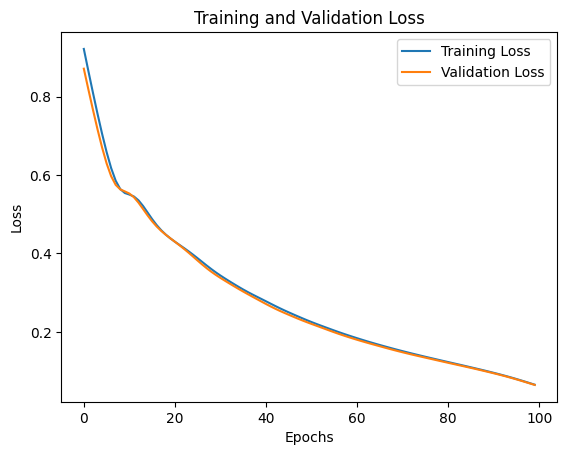

In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler

# Example function to prepare data for LSTM training
def prepare_data_for_lstm(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequence_length = 1440  # Number of minutes in a day
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Example usage
# Assuming 'minute_data' contains minute-wise data with columns like 'Value', 'Steps', etc.


# Fill NaN with column mean
merged_data[5553957443].fillna(merged_data[5553957443].mean(), inplace=True)

# Prepare data for LSTM training
X, scaler = prepare_data_for_lstm(merged_data[5553957443][['Value', 'Steps']])

# Verify shape of X (samples, time_steps, features)
print(f"Shape of X: {X.shape}")  # Should print (number_of_samples, 1440, number_of_features)

# Initialize LSTM model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(1440, X.shape[2])))
model.add(LSTM(units=50, return_sequences=True))  # Ensure this layer returns sequences
model.add(Dense(units=X.shape[2]))  # Adjust units based on number of features
model.compile(optimizer='adam', loss='mean_squared_error')

# Example of training the model
history = model.fit(X, X, epochs=100, batch_size=32, validation_split=0.2)

# Evaluate model performance or use for predictions
# Example: plot loss over epochs
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

In [ ]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Example function to prepare data for LSTM training
def prepare_data_for_lstm(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequence_length = 1440  # Number of minutes in a day
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Load your data into a DataFrame (assuming 'minute_data' is a DataFrame)
# For example: merged_data = pd.read_csv('your_data.csv')

# Fill NaN with column mean
merged_data[5553957443].fillna(merged_data[5553957443].mean(), inplace=True)

# Prepare data for LSTM training
data = merged_data[5553957443][['Value', 'Steps']]
X, scaler = prepare_data_for_lstm(data)

# Verify shape of X (samples, time_steps, features)
print(f"Shape of X: {X.shape}")  # Should print (number_of_samples, 1440, number_of_features)

# Split data into training, validation, and test sets
train_data, test_data = train_test_split(X, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(train_data, test_size=0.25, random_state=42)

# Initialize LSTM model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(1440, X.shape[2])))
model.add(LSTM(units=50, return_sequences=True))  # Ensure this layer returns sequences
model.add(Dense(units=X.shape[2]))  # Adjust units based on number of features
model.compile(optimizer='adam', loss='mean_squared_error')

# Example of training the model
history = model.fit(train_data, train_data, epochs=100, batch_size=32, validation_data=(val_data, val_data))

# Evaluate model performance or use for predictions
# Example: plot loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Evaluate the model on the test data
test_loss = model.evaluate(test_data, test_data)
print(f"Test Loss: {test_loss}")


NameError: name 'merged_data' is not defined

In [ ]:
import pandas as pd

# Sample merged_data dictionary with participant IDs as keys and their DataFrames as values
# Example:
# merged_data = {
#     'participant_1': pd.DataFrame(...),
#     'participant_2': pd.DataFrame(...),
#     ...
# }

def calculate_missing_data(merged_data):
    missing_data_info = {}

    for participant_id, data in merged_data.items():
        total_entries = data.shape[0] * data.shape[1]  # Total number of data points (rows * columns)
        missing_entries = data.isnull().sum().sum()    # Total number of missing data points
        missing_percentage = (missing_entries / total_entries) * 100

        missing_data_info[participant_id] = {
            'Total Entries': total_entries,
            'Missing Entries': missing_entries,
            'Missing Percentage': missing_percentage
        }

    return pd.DataFrame(missing_data_info).transpose()

# Example usage
missing_data_info = calculate_missing_data(merged_data)
print(missing_data_info)


In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler

# Example function to prepare data for LSTM training
def prepare_data_for_lstm(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequence_length = 1440  # Number of minutes in a day
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Example usage
# Assuming 'minute_data' contains minute-wise data with columns like 'Value', 'Steps', etc.


# Fill NaN with column mean
merged_data[5553957443].fillna(merged_data[5553957443].mean(), inplace=True)

# Prepare data for LSTM training
X, scaler = prepare_data_for_lstm(merged_data[5553957443][['Value', 'Steps']])

# Verify shape of X (samples, time_steps, features)
print(f"Shape of X: {X.shape}")  # Should print (number_of_samples, 1440, number_of_features)

# Initialize LSTM model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(1440, X.shape[2])))
model.add(LSTM(units=50, return_sequences=True))  # Ensure this layer returns sequences
model.add(Dense(units=X.shape[2]))  # Adjust units based on number of features
model.compile(optimizer='adam', loss='mean_squared_error')

# Example of training the model
history = model.fit(X, X, epochs=100, batch_size=32, validation_split=0.5)

# Evaluate model performance or use for predictions
# Example: plot loss over epochs
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

In [ ]:
merged_data

{2022484408:                             Id_hr       Value      Id_steps  Steps  \
 2016-04-12 07:21:00  2.022484e+09  101.600000  2.022484e+09   17.0   
 2016-04-12 07:22:00  2.022484e+09   87.888889  2.022484e+09    9.0   
 2016-04-12 07:23:00  2.022484e+09   58.000000  2.022484e+09    0.0   
 2016-04-12 07:24:00  2.022484e+09   58.000000  2.022484e+09    0.0   
 2016-04-12 07:25:00  2.022484e+09   56.777778  2.022484e+09    0.0   
 ...                           ...         ...           ...    ...   
 2016-05-12 15:44:00  2.022484e+09   76.714286  2.022484e+09   14.0   
 2016-05-12 15:45:00  2.022484e+09   71.833333  2.022484e+09   14.0   
 2016-05-12 15:46:00  2.022484e+09   71.000000  2.022484e+09   14.0   
 2016-05-12 15:47:00  2.022484e+09   70.571429  2.022484e+09   14.0   
 2016-05-12 15:48:00  2.022484e+09   71.000000  2.022484e+09   14.0   
 
                      day_of_week  
 2016-04-12 07:21:00            1  
 2016-04-12 07:22:00            1  
 2016-04-12 07:23:00      

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

def preprocess_data_for_clustering(merged_data):
    processed_data = {}
    for participant_id, df in merged_data.items():
        if not df.empty:
            df.fillna(df.mean(), inplace=True)  # Fill missing values with column means
            scaler = StandardScaler()
            scaled_data = scaler.fit_transform(df)
            processed_data[participant_id] = scaled_data
    return processed_data

def perform_clustering(processed_data, n_clusters):
    all_data = []
    participant_ids = []
    for participant_id, data in processed_data.items():
        all_data.append(data)
        participant_ids.extend([participant_id] * data.shape[0])
    all_data = np.vstack(all_data)
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(all_data)
    return labels, participant_ids, kmeans

In [ ]:
def fill_na_with_mean(df):
    return df.apply(lambda x: x.fillna(x.mean()), axis=0)

# Example merged_data dictionary
# Assuming merged_data is a dictionary where keys are participant IDs and values are DataFrames with 'Value' and 'Steps' columns


for participant_id, data in merged_data.items():
    merged_data[participant_id] = fill_na_with_mean(data)


In [ ]:
from sklearn.preprocessing import StandardScaler

def scale_data(df):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(df)
    return scaled_data, scaler

# Example usage
participant_id = 2347167796
participant_data = merged_data[participant_id]

# Scaling the data
scaled_data, scaler = scale_data(participant_data[['Value', 'Steps']])


In [ ]:
import numpy as np

def prepare_lstm_data(scaled_data, time_steps=3):
    X, y = [], []
    for i in range(len(scaled_data) - time_steps):
        X.append(scaled_data[i:i + time_steps])
        y.append(scaled_data[i + time_steps])
    return np.array(X), np.array(y)

time_steps = 3
X, y = prepare_lstm_data(scaled_data, time_steps)


In [ ]:
import scipy.stats as stats

# Split data into weekdays and weekends
weekdays_data, weekends_data = split_weekdays_weekends(merged_data)

# Calculate average patterns
avg_weekdays = weekdays_data[2347167796].groupby(weekdays_data[2347167796].index.time).mean()
avg_weekends = weekends_data[2347167796].groupby(weekends_data[2347167796].index.time).mean()

# Perform ANOVA test
anova_results_hr = stats.f_oneway(avg_weekdays['Value'], avg_weekends['Value'])
anova_results_steps = stats.f_oneway(avg_weekdays['Steps'], avg_weekends['Steps'])

print('ANOVA test results for Heart Rate:', anova_results_hr)
print('ANOVA test results for Steps:', anova_results_steps)


ANOVA test results for Heart Rate: F_onewayResult(statistic=211.63704891221767, pvalue=2.554424142367015e-46)
ANOVA test results for Steps: F_onewayResult(statistic=48.34576167616801, pvalue=4.403904717771404e-12)


In [ ]:
weekdays_data[8792009665]

,Id_hr,Value,Id_steps,Steps
2016-04-12 00:53:00,8.792010e+09,70.0,8.792010e+09,0.0
2016-04-12 00:54:00,8.792010e+09,70.0,8.792010e+09,0.0
2016-04-12 00:55:00,8.792010e+09,70.0,8.792010e+09,0.0
2016-04-12 00:56:00,8.792010e+09,70.0,8.792010e+09,0.0
2016-04-12 00:57:00,8.792010e+09,70.0,8.792010e+09,0.0
...,...,...,...,...
2016-05-09 23:55:00,8.792010e+09,74.0,8.792010e+09,0.0
2016-05-09 23:56:00,8.792010e+09,74.0,8.792010e+09,0.0
2016-05-09 23:57:00,8.792010e+09,74.0,8.792010e+09,0.0
2016-05-09 23:58:00,8.792010e+09,74.0,8.792010e+09,0.0


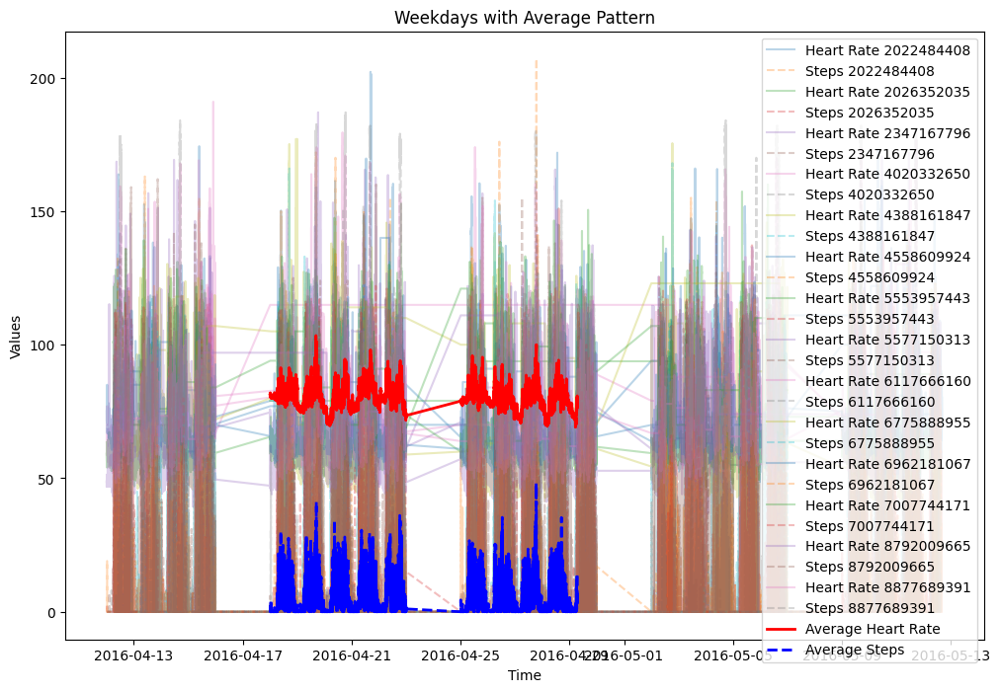

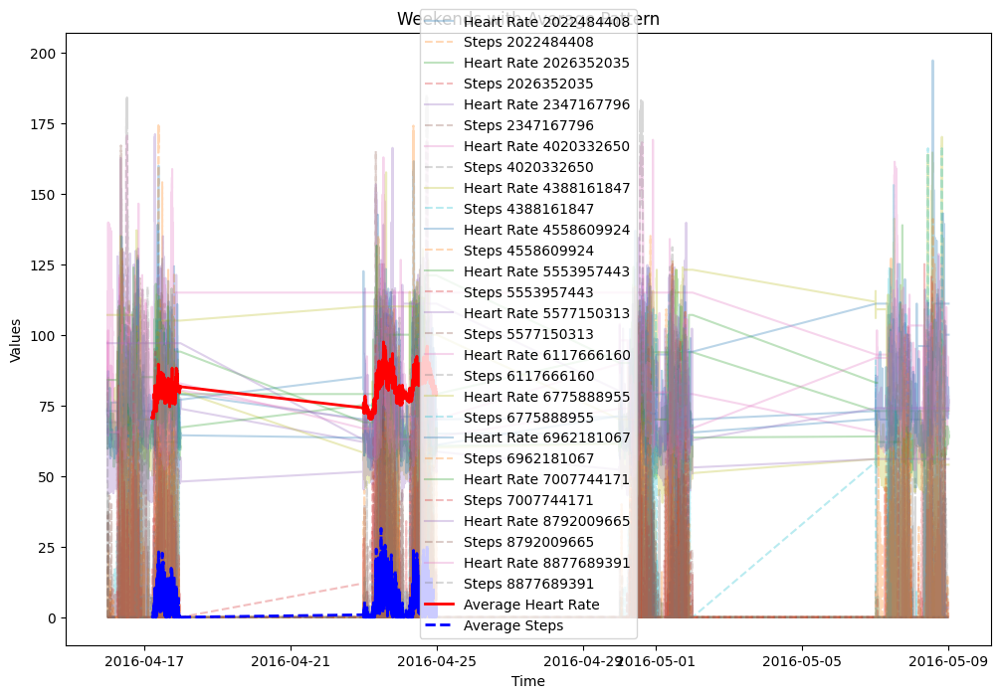

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Function to split data into weekdays and weekends
def split_weekdays_weekends(data):
    weekdays_data = {}
    weekends_data = {}
    for participant_id, df in data.items():
        df['DayOfWeek'] = df.index.dayofweek
        weekdays_data[participant_id] = df[df['DayOfWeek'] < 5].copy()
        weekends_data[participant_id] = df[df['DayOfWeek'] >= 5].copy()
        df.drop(columns=['DayOfWeek'], inplace=True)  # Clean up temporary column
    return weekdays_data, weekends_data

# Function to plot data with average pattern
def plot_data_with_avg_pattern(data, title):
    plt.figure(figsize=(12, 8))
    avg_pattern_hr = None
    avg_pattern_steps = None
    count = 0

    for participant_id, df in data.items():
        if 'Value' in df.columns and 'Steps' in df.columns:
            if avg_pattern_hr is None:
                avg_pattern_hr = df['Value'].copy()
                avg_pattern_steps = df['Steps'].copy()
            else:
                avg_pattern_hr += df['Value']
                avg_pattern_steps += df['Steps']
            count += 1
            plt.plot(df.index, df['Value'], alpha=0.3, label=f'Heart Rate {participant_id}')
            plt.plot(df.index, df['Steps'], alpha=0.3, label=f'Steps {participant_id}', linestyle='--')

    if count > 0:
        avg_pattern_hr /= count
        avg_pattern_steps /= count
        plt.plot(avg_pattern_hr.index, avg_pattern_hr, label='Average Heart Rate', color='red', linewidth=2)
        plt.plot(avg_pattern_steps.index, avg_pattern_steps, label='Average Steps', color='blue', linewidth=2, linestyle='--')

    plt.title(f'{title} with Average Pattern')
    plt.xlabel('Time')
    plt.ylabel('Values')
    plt.legend()
    plt.show()

# Example usage
# Assuming merged_data is already defined and contains the merged heart rate and steps data

# Split data into weekdays and weekends
weekdays_data, weekends_data = split_weekdays_weekends(merged_data)

# Plot weekdays data with average pattern
plot_data_with_avg_pattern(weekdays_data, 'Weekdays')

# Plot weekends data with average pattern
plot_data_with_avg_pattern(weekends_data, 'Weekends')


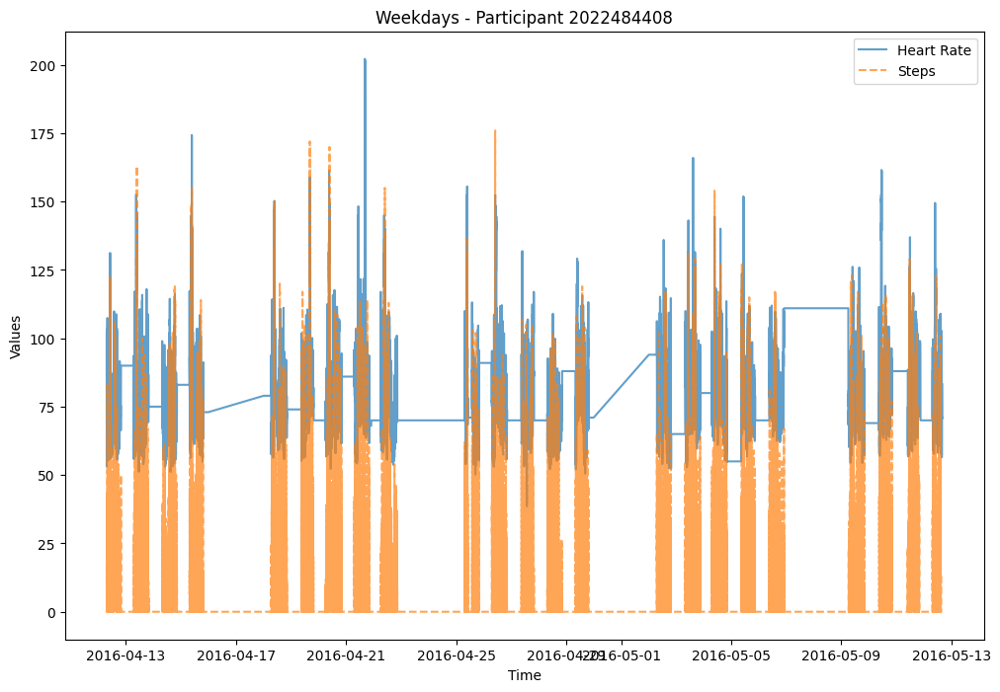

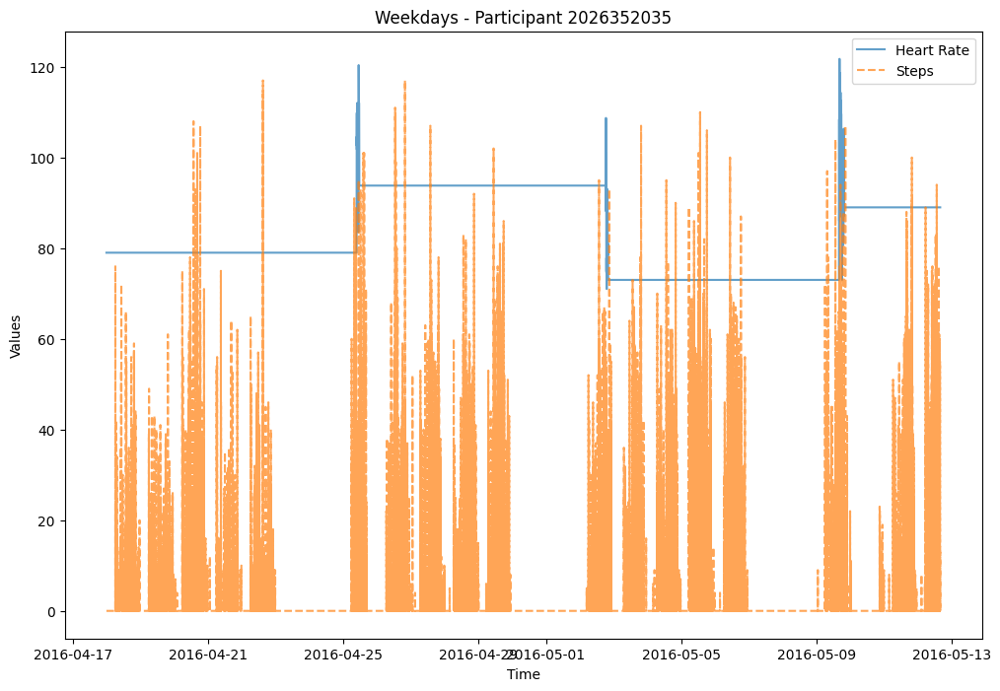

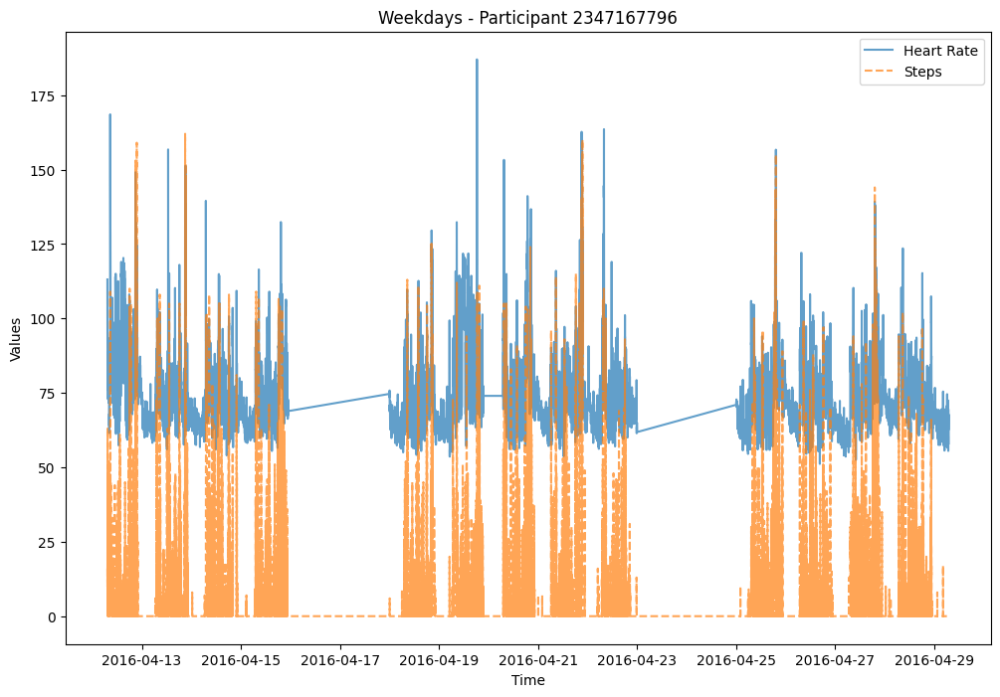

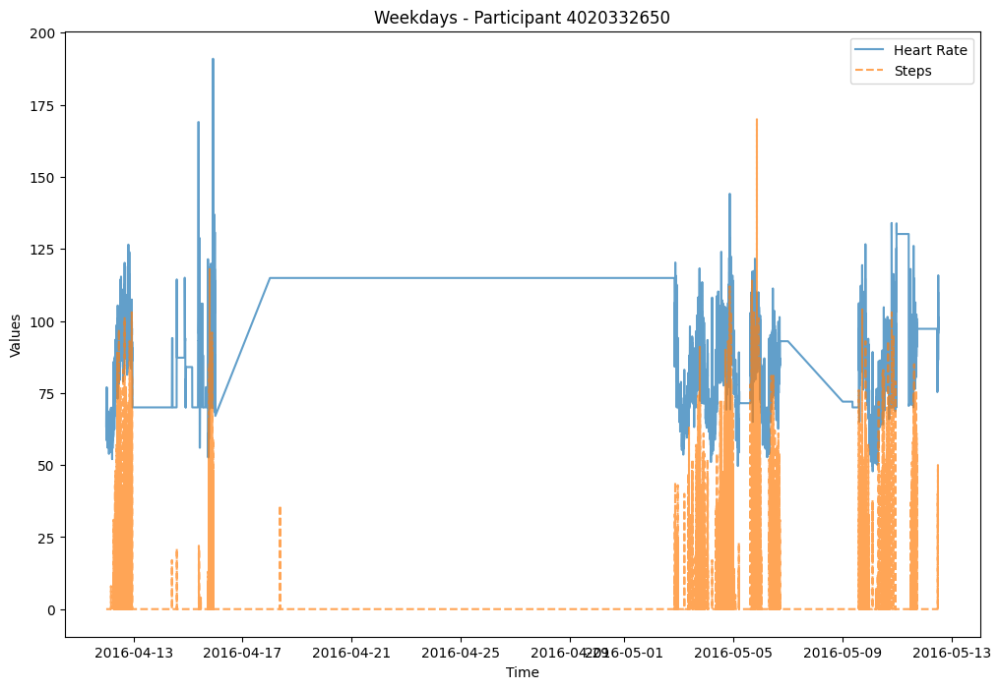

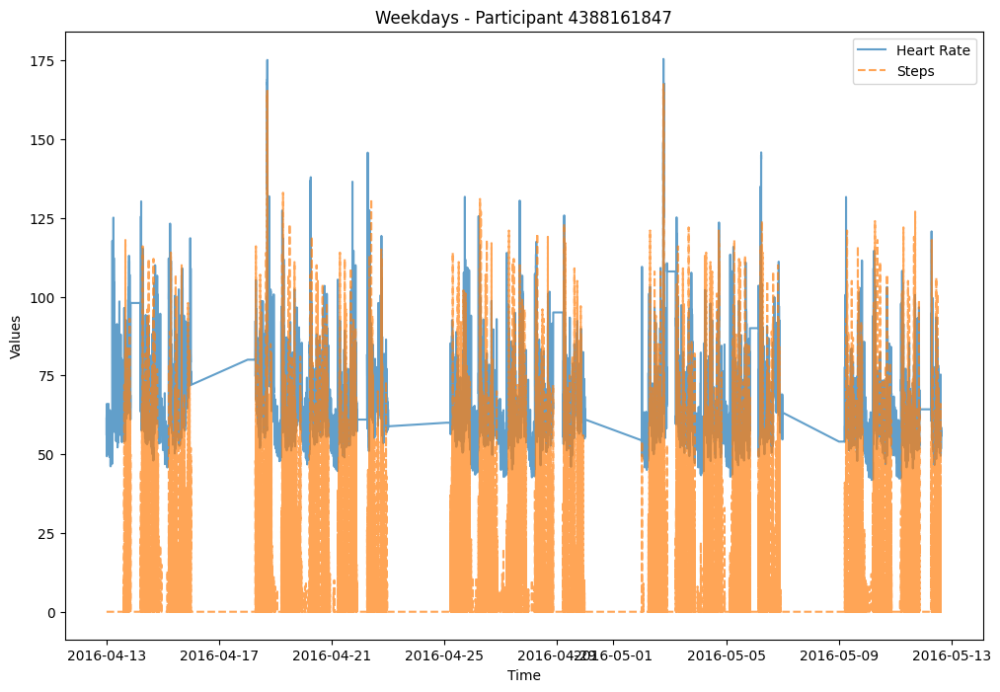

...

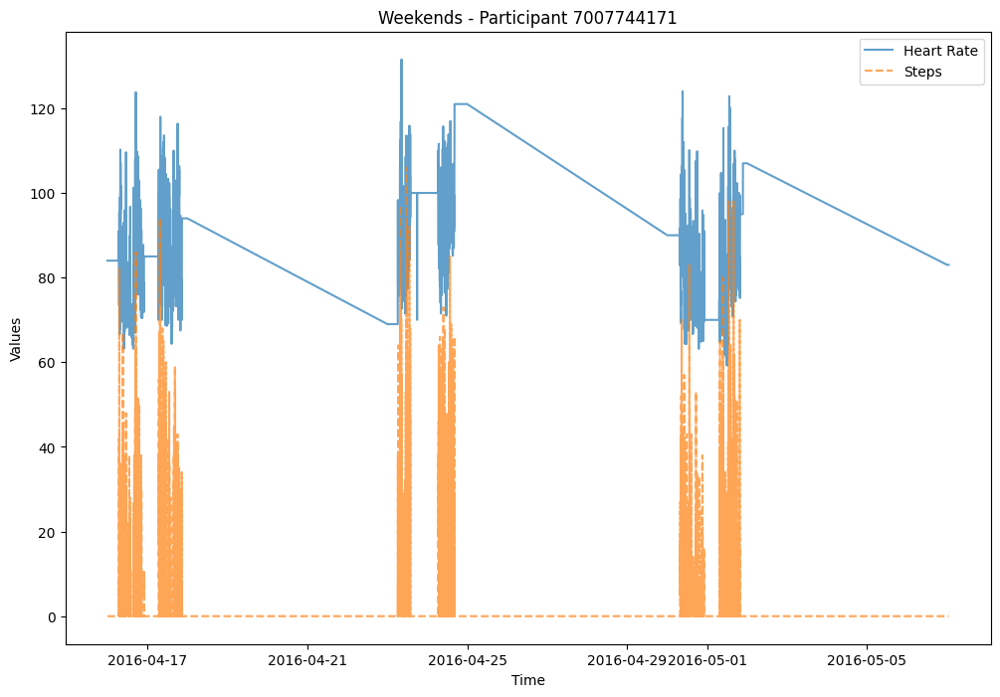

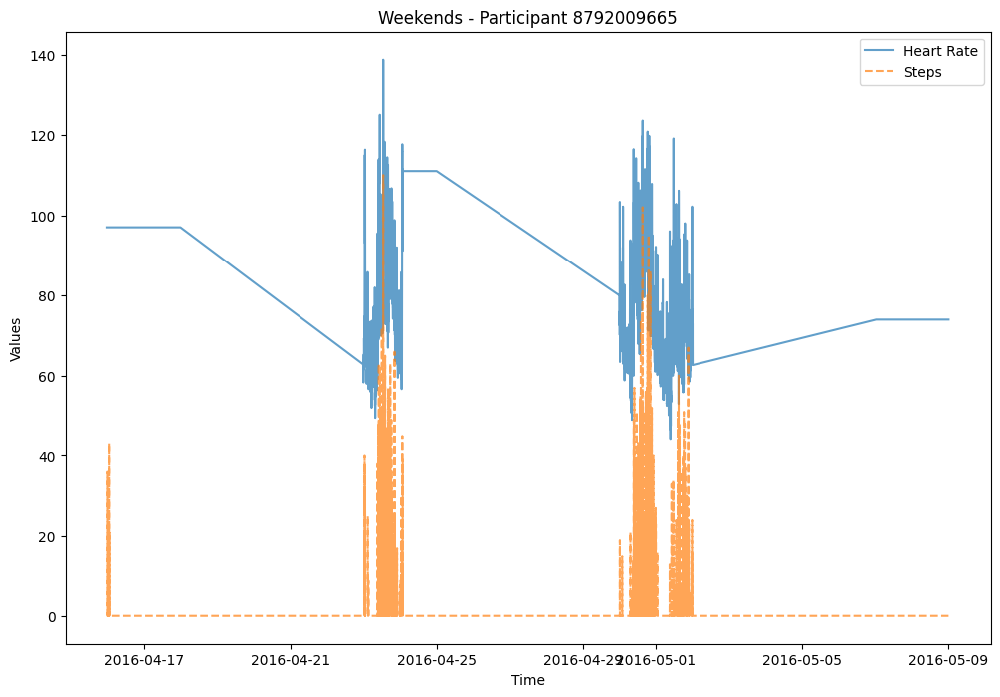

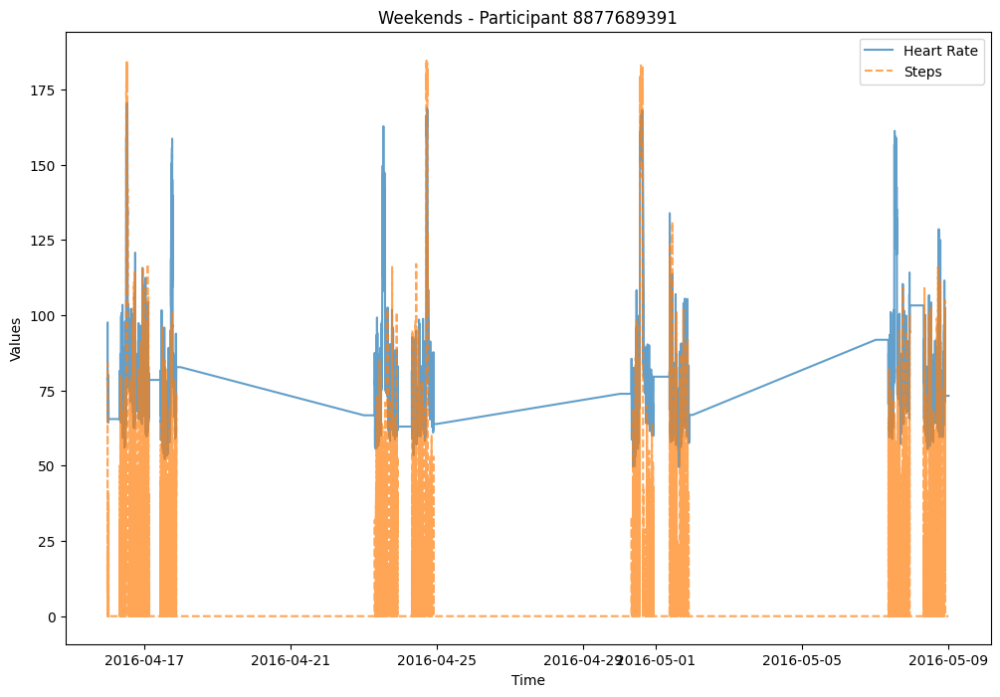

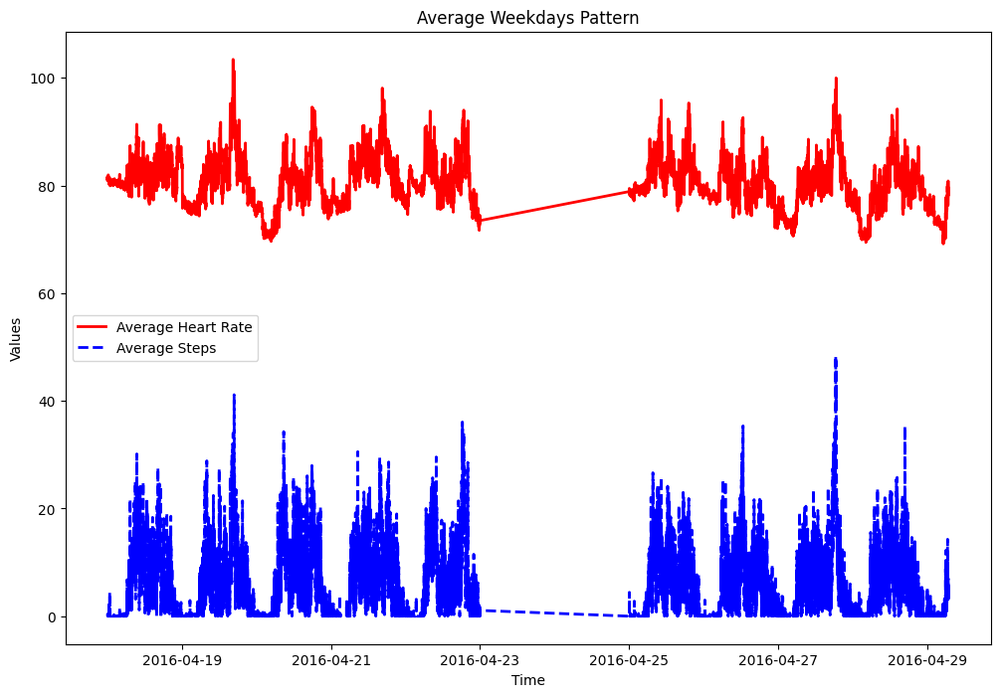

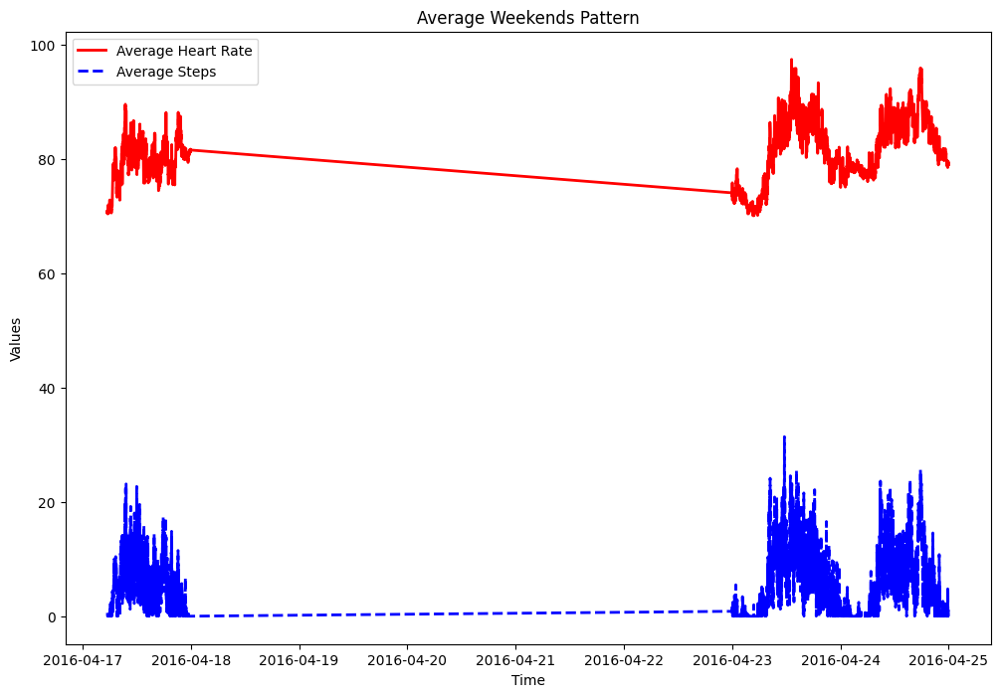

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Function to split data into weekdays and weekends
def split_weekdays_weekends(data):
    weekdays_data = {}
    weekends_data = {}
    for participant_id, df in data.items():
        df['DayOfWeek'] = df.index.dayofweek
        weekdays_data[participant_id] = df[df['DayOfWeek'] < 5].copy()
        weekends_data[participant_id] = df[df['DayOfWeek'] >= 5].copy()
        df.drop(columns=['DayOfWeek'], inplace=True)  # Clean up temporary column
    return weekdays_data, weekends_data

# Function to plot data for each participant
def plot_participant_data(data, title):
    for participant_id, df in data.items():
        if 'Value' in df.columns and 'Steps' in df.columns:
            plt.figure(figsize=(12, 8))
            plt.plot(df.index, df['Value'], label='Heart Rate', alpha=0.7)
            plt.plot(df.index, df['Steps'], label='Steps', alpha=0.7, linestyle='--')
            plt.title(f'{title} - Participant {participant_id}')
            plt.xlabel('Time')
            plt.ylabel('Values')
            plt.legend()
            plt.show()

# Function to plot average pattern for all participants
def plot_average_pattern(data, title):
    avg_pattern_hr = None
    avg_pattern_steps = None
    count = 0

    for df in data.values():
        if 'Value' in df.columns and 'Steps' in df.columns:
            if avg_pattern_hr is None:
                avg_pattern_hr = df['Value'].copy()
                avg_pattern_steps = df['Steps'].copy()
            else:
                avg_pattern_hr += df['Value']
                avg_pattern_steps += df['Steps']
            count += 1

    if count > 0:
        avg_pattern_hr /= count
        avg_pattern_steps /= count
        plt.figure(figsize=(12, 8))
        plt.plot(avg_pattern_hr.index, avg_pattern_hr, label='Average Heart Rate', color='red', linewidth=2)
        plt.plot(avg_pattern_steps.index, avg_pattern_steps, label='Average Steps', color='blue', linewidth=2, linestyle='--')
        plt.title(f'Average {title} Pattern')
        plt.xlabel('Time')
        plt.ylabel('Values')
        plt.legend()
        plt.show()

# Example usage
# Assuming merged_data is already defined and contains the merged heart rate and steps data

# Split data into weekdays and weekends
weekdays_data, weekends_data = split_weekdays_weekends(merged_data)

# Plot each participant's data for weekdays
plot_participant_data(weekdays_data, 'Weekdays')

# Plot each participant's data for weekends
plot_participant_data(weekends_data, 'Weekends')

# Plot average pattern for weekdays
plot_average_pattern(weekdays_data, 'Weekdays')

# Plot average pattern for weekends
plot_average_pattern(weekends_data, 'Weekends')


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

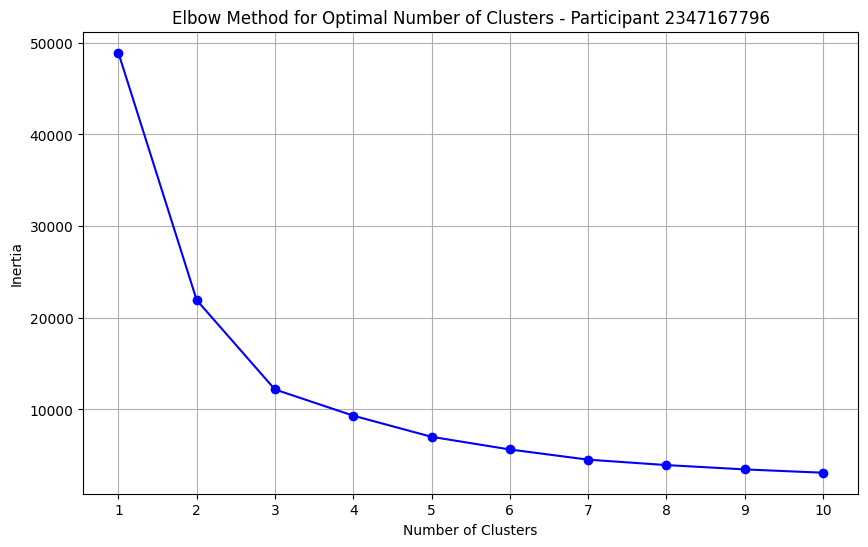

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Function to extract data for a specific participant
def extract_participant_data(participant_data, participant_id):
    return participant_data.get(participant_id, None)

# Example usage
# Assuming processed_data contains the preprocessed data for clustering

participant_id = 2347167796

# Extract data for the participant
participant_data = extract_participant_data(processed_data, participant_id)

if participant_data is None:
    print(f"Participant {participant_id} data not found.")
else:
    # Calculate inertia for different numbers of clusters
    inertias = []
    max_clusters = 10  # Adjust as needed
    for k in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(participant_data)
        inertias.append(kmeans.inertia_)

    # Plot the elbow curve
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, max_clusters + 1), inertias, marker='o', linestyle='-', color='b')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')
    plt.title(f'Elbow Method for Optimal Number of Clusters - Participant {participant_id}')
    plt.xticks(np.arange(1, max_clusters + 1))
    plt.grid(True)
    plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


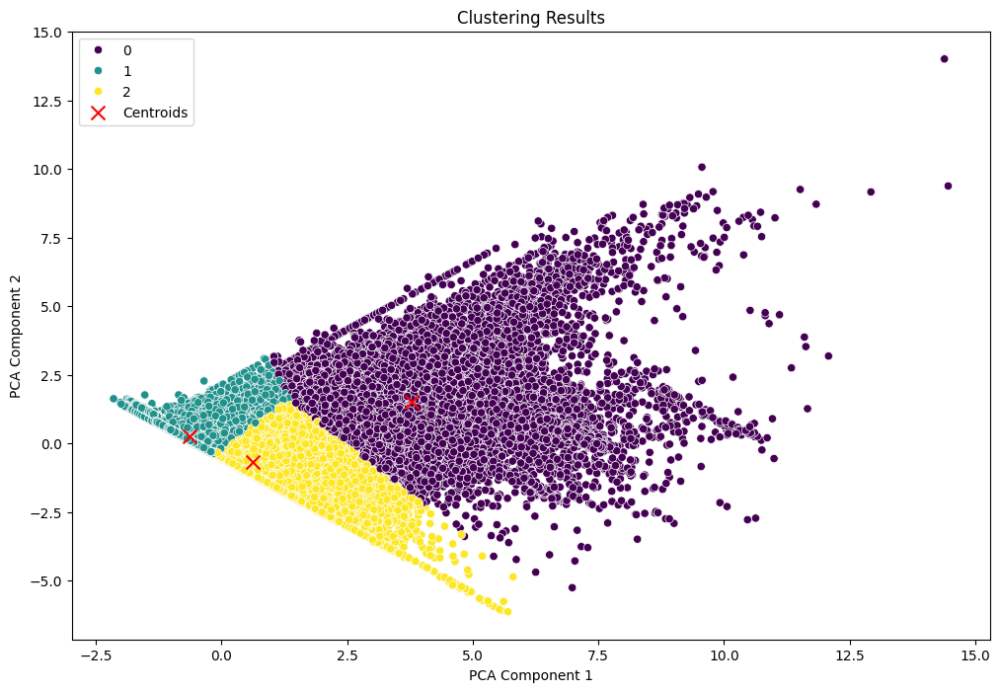

In [ ]:
# Function to plot clustering results
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
def plot_clustering_results(labels, participant_ids, data, kmeans):
    pca = PCA(n_components=2)
    reduced_data = pca.fit_transform(data)
    plt.figure(figsize=(12, 8))
    sns.scatterplot(x=reduced_data[:, 0], y=reduced_data[:, 1], hue=labels, palette='viridis')
    centroids = pca.transform(kmeans.cluster_centers_)
    plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='x', s=100, label='Centroids')
    plt.title('Clustering Results')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.legend()
    plt.show()

def perform_clustering(processed_data, n_clusters):
    all_data = []
    participant_ids = []
    for participant_id, data in processed_data.items():
        all_data.append(data)
        participant_ids.extend([participant_id] * data.shape[0])
    all_data = np.vstack(all_data)
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(all_data)
    return labels, participant_ids, kmeans

    cluster_members = {i: [] for i in range(kmeans.n_clusters)}
    for label, participant_id in zip(labels, participant_ids):
        cluster_members[label].append(participant_id)
    for cluster, members in cluster_members.items():
        print(f"Cluster {cluster}: {set(members)}")
# Plot clustering results
labels, participant_ids, kmeans = perform_clustering(processed_data, n_clusters=3)
all_data = np.vstack([data for data in processed_data.values()])
plot_clustering_results(labels, participant_ids, all_data, kmeans)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: {5553957443, 4558609924, 5577150313, 4020332650, 6117666160, 4388161847} (Count: 251325)
Cluster 1: {8792009665, 7007744171, 6962181067, 8877689391, 6775888955} (Count: 198592)
Cluster 2: {2022484408, 2026352035, 2347167796} (Count: 104796)


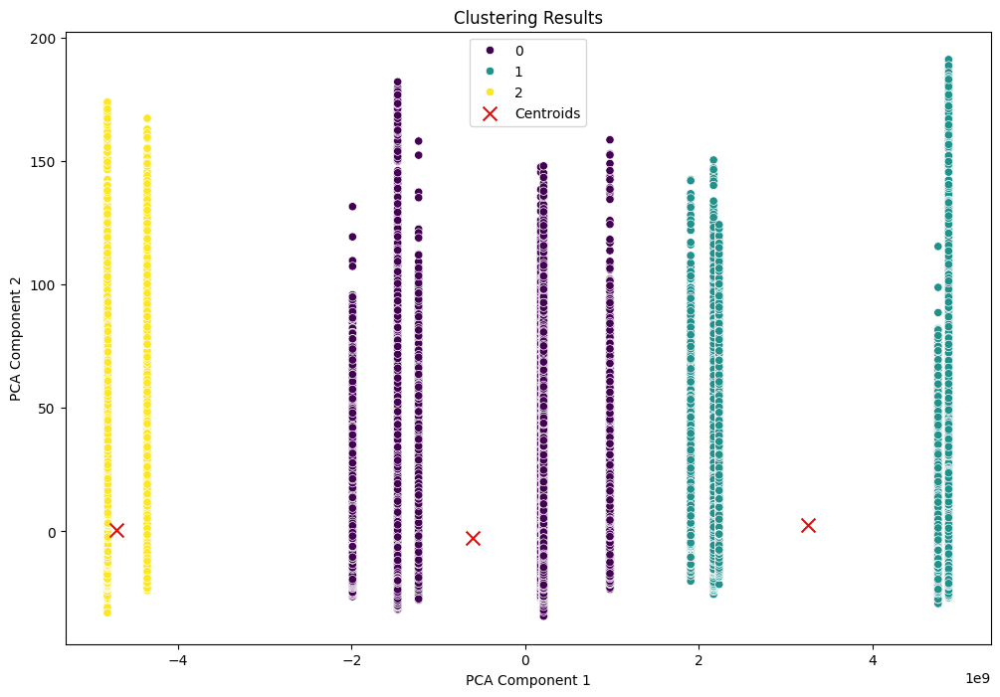

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Function to plot clustering results
def plot_clustering_results(labels, participant_ids, data, kmeans):
    pca = PCA(n_components=2)
    reduced_data = pca.fit_transform(data)
    plt.figure(figsize=(12, 8))
    sns.scatterplot(x=reduced_data[:, 0], y=reduced_data[:, 1], hue=labels, palette='viridis')
    centroids = pca.transform(kmeans.cluster_centers_)
    plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='x', s=100, label='Centroids')
    plt.title('Clustering Results')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.legend()
    plt.show()

# Function to perform clustering
def perform_clustering(processed_data, n_clusters):
    all_data = []
    participant_ids = []
    for participant_id, data in processed_data.items():
        all_data.append(data)
        participant_ids.extend([participant_id] * data.shape[0])
    all_data = np.vstack(all_data)
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(all_data)

    # Count the number of members in each cluster
    cluster_counts = np.bincount(labels)

    cluster_members = {i: [] for i in range(kmeans.n_clusters)}
    for label, participant_id in zip(labels, participant_ids):
        cluster_members[label].append(participant_id)

    for cluster, members in cluster_members.items():
        print(f"Cluster {cluster}: {set(members)} (Count: {cluster_counts[cluster]})")

    return labels, participant_ids, kmeans

# Example usage
# Assuming 'processed_data' is a dictionary with participant_id as keys and their respective data as values

# Plot clustering results
labels, participant_ids, kmeans = perform_clustering(merged_data, n_clusters=3)
all_data = np.vstack([data for data in merged_data.values()])
plot_clustering_results(labels, participant_ids, all_data, kmeans)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: Count = 10
Cluster 1: Count = 1
Cluster 2: Count = 5


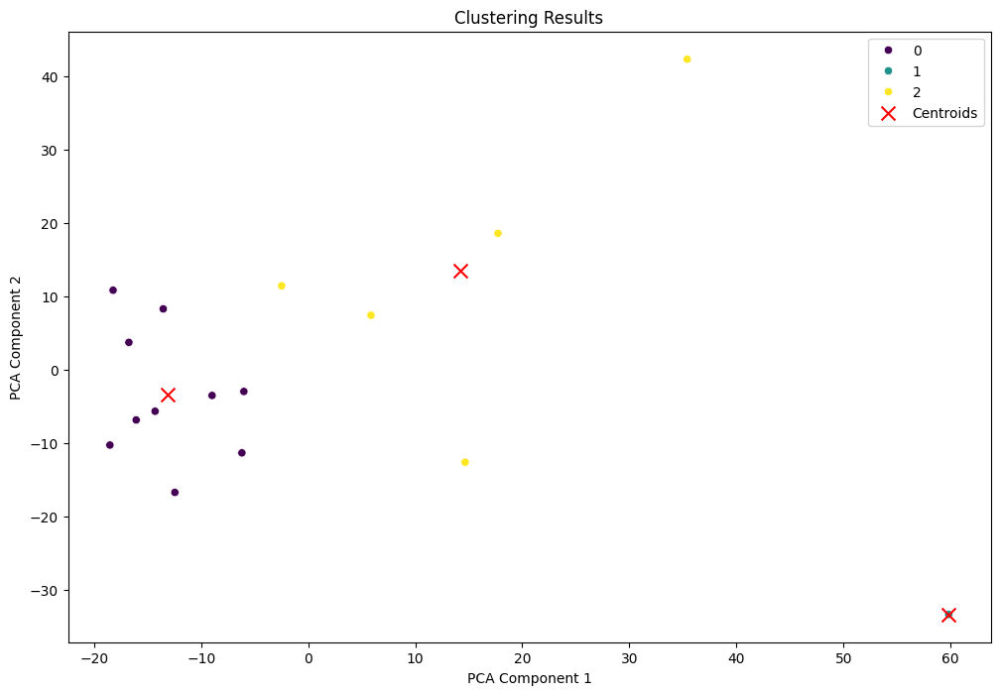

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# Function to prepare data for clustering
def prepare_data_for_clustering(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for clustering (daily data with 1440 time steps)
    sequence_length = 1440  # Number of minutes in a day
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)
    return sequences, scaler

# Function to perform clustering
def perform_clustering(data, n_clusters):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(data)
    return labels, kmeans

# Function to plot clustering results
def plot_clustering_results(labels, data, kmeans):
    pca = PCA(n_components=2)
    reduced_data = pca.fit_transform(data)
    plt.figure(figsize=(12, 8))
    sns.scatterplot(x=reduced_data[:, 0], y=reduced_data[:, 1], hue=labels, palette='viridis')
    centroids = pca.transform(kmeans.cluster_centers_)
    plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='x', s=100, label='Centroids')
    plt.title('Clustering Results')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.legend()
    plt.show()

# Example usage
# Assuming 'merged_data' contains minute-wise data with columns like 'Value', 'Steps', etc.

# Fill NaN with column mean for a specific participant
participant_id = 2347167796
participant_data = merged_data[participant_id].fillna(merged_data[participant_id].mean())

# Prepare data for clustering
daily_data, scaler = prepare_data_for_clustering(participant_data[['Value', 'Steps']])

# Flatten the data for clustering (days, time_steps * features)
flattened_data = daily_data.reshape(daily_data.shape[0], -1)

# Perform clustering
labels, kmeans = perform_clustering(flattened_data, n_clusters=3)

# Count the number of members in each cluster
cluster_counts = np.bincount(labels)
for cluster in range(len(cluster_counts)):
    print(f"Cluster {cluster}: Count = {cluster_counts[cluster]}")

# Plot clustering results
plot_clustering_results(labels, flattened_data, kmeans)


In [ ]:
from scipy.stats import f_oneway

# Function to perform ANOVA test between two clusters
def perform_anova_test(cluster_data_0, cluster_data_1):
    f_value, p_value = f_oneway(cluster_data_0, cluster_data_1)
    print(f"ANOVA Test Results: F-value = {f_value}, p-value = {p_value}")

# Extract data for clusters 0 and 1
cluster_0_data = flattened_data[labels == 0]
cluster_1_data = flattened_data[labels == 2]

# Perform ANOVA test between cluster 0 and cluster 1
perform_anova_test(cluster_0_data, cluster_2_data)


ANOVA Test Results: F-value = [0.43223363 1.1240187  0.58437536 ... 0.35266734 0.87088821 0.47185548], p-value = [0.52236576 0.30835583 0.45825446 ... 0.56279867 0.3677193  0.50420468]


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4167: ConstantInputWarning: Each of the input arrays is constant;the F statistic is not defined or infinite
  warnings.warn(stats.ConstantInputWarning(msg))


1/1 [==============================] - 1s 929ms/step


1/1 [==============================] - 1s 932ms/step


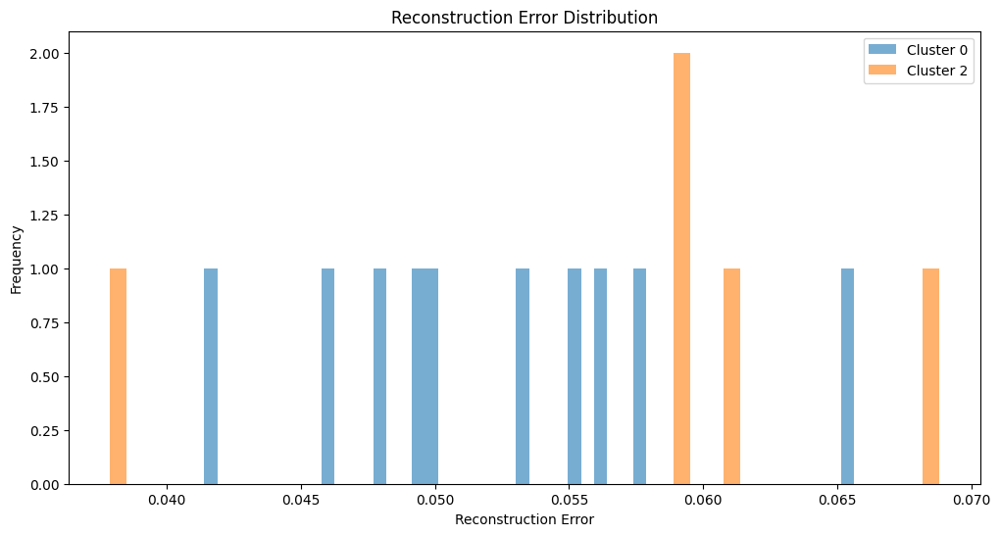

In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Function to prepare data for LSTM training
def prepare_data_for_lstm(data, sequence_length=1440):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Function to train LSTM autoencoder
def train_lstm_autoencoder(X):
    model = Sequential()
    model.add(LSTM(units=50, return_sequences=True, input_shape=(X.shape[1], X.shape[2])))
    model.add(LSTM(units=50, return_sequences=True))
    model.add(Dense(units=X.shape[2]))
    model.compile(optimizer='adam', loss='mean_squared_error')

    history = model.fit(X, X, epochs=100, batch_size=32, validation_split=0.2, verbose=0)

    return model, history

# Function to calculate reconstruction error
def calculate_reconstruction_error(model, X):
    X_pred = model.predict(X)
    reconstruction_error = np.mean(np.square(X - X_pred), axis=(1, 2))
    return reconstruction_error

# Example usage
# Assuming 'flattened_data' contains the flattened daily data and 'labels' contains the cluster labels

# Extract data for cluster 0 and cluster 2
cluster_0_data = flattened_data[labels == 0].reshape(-1, 1440, 2)
cluster_2_data = flattened_data[labels == 2].reshape(-1, 1440, 2)

# Train LSTM autoencoder for cluster 0
X_cluster_0, scaler_0 = prepare_data_for_lstm(cluster_0_data.reshape(-1, 2))
model_cluster_0, history_0 = train_lstm_autoencoder(X_cluster_0)

# Train LSTM autoencoder for cluster 2
X_cluster_2, scaler_2 = prepare_data_for_lstm(cluster_2_data.reshape(-1, 2))
model_cluster_2, history_2 = train_lstm_autoencoder(X_cluster_2)

# Calculate reconstruction error for cluster 0
reconstruction_error_cluster_0 = calculate_reconstruction_error(model_cluster_0, X_cluster_0)

# Calculate reconstruction error for cluster 2
reconstruction_error_cluster_2 = calculate_reconstruction_error(model_cluster_2, X_cluster_2)

# Plot reconstruction errors
plt.figure(figsize=(12, 6))
plt.hist(reconstruction_error_cluster_0, bins=50, alpha=0.6, label='Cluster 0')
plt.hist(reconstruction_error_cluster_2, bins=50, alpha=0.6, label='Cluster 2')
plt.xlabel('Reconstruction Error')
plt.ylabel('Frequency')
plt.title('Reconstruction Error Distribution')
plt.legend()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

# Assuming 'minute_data' is your DataFrame with minute-wise data for 15 days
# Ensure data has columns 'Value' and 'Steps'
minute_data = merged_data[2347167796][['Value', 'Steps']]

# Fill NaN values with column mean
minute_data.fillna(minute_data.mean(), inplace=True)

# Set the index to a datetime index if not already done
minute_data.index = pd.to_datetime(minute_data.index)

# Function to calculate additional features
def add_features(data):
    # Resample to 15-minute intervals and calculate mean and median
    data_15min = data.resample('15T').agg({'Value': ['mean', 'median'], 'Steps': ['mean', 'median']})
    data_15min.columns = ['Value_15min_mean', 'Value_15min_median', 'Steps_15min_mean', 'Steps_15min_median']

    # Resample to hourly intervals and calculate mean and median
    data_hourly = data.resample('H').agg({'Value': ['mean', 'median'], 'Steps': ['mean', 'median']})
    data_hourly.columns = ['Value_hourly_mean', 'Value_hourly_median', 'Steps_hourly_mean', 'Steps_hourly_median']

    # Merge the additional features back to the original data
    data = data.join(data_15min, how='outer').join(data_hourly, how='outer')

    # Forward fill the missing values generated by resampling
    data.fillna(method='ffill', inplace=True)

    return data

# Add the new features to the data
minute_data = add_features(minute_data)

# Verify the shape of the updated data
print(minute_data.head())

# Scale the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(minute_data)

# Reshape the data into sequences of 1440 time steps (1 day)
sequence_length = 1440
sequences = []

for i in range(len(scaled_data) // sequence_length):
    sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
    sequences.append(sequence)

sequences = np.array(sequences)
print(f"Shape of sequences: {sequences.shape}")  # Should print (number_of_days, 1440, number_of_features)


                          Value  Steps  Value_15min_mean  Value_15min_median  \
2016-04-12 07:00:00         NaN    NaN               NaN                 NaN   
2016-04-12 07:15:00         NaN    NaN         90.832602           88.142857   
2016-04-12 07:19:00  113.100000   16.0         90.832602           88.142857   
2016-04-12 07:20:00  110.000000   13.0         90.832602           88.142857   
2016-04-12 07:21:00   99.444444   10.0         90.832602           88.142857   

                     Steps_15min_mean  Steps_15min_median  Value_hourly_mean  \
2016-04-12 07:00:00               NaN                 NaN          81.251933   
2016-04-12 07:15:00         22.545455                15.0          81.251933   
2016-04-12 07:19:00         22.545455                15.0          81.251933   
2016-04-12 07:20:00         22.545455                15.0          81.251933   
2016-04-12 07:21:00         22.545455                15.0          81.251933   

                     Value_hourly_medi

<ipython-input-15-b1578f2e9263>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  minute_data.fillna(minute_data.mean(), inplace=True)


Epoch 1/120
1/1 [==============================] - 7s 7s/step - loss: 1.1195 - val_loss: 0.6881
Epoch 2/120
1/1 [==============================] - 1s 1s/step - loss: 1.0548 - val_loss: 0.6425
Epoch 3/120
1/1 [==============================] - 1s 1s/step - loss: 0.9964 - val_loss: 0.6017
Epoch 4/120
1/1 [==============================] - 1s 1s/step - loss: 0.9431 - val_loss: 0.5648
Epoch 5/120
1/1 [==============================] - 1s 1s/step - loss: 0.8939 - val_loss: 0.5312
Epoch 6/120
1/1 [==============================] - 1s 1s/step - loss: 0.8480 - val_loss: 0.5005
Epoch 7/120
1/1 [==============================] - 2s 2s/step - loss: 0.8052 - val_loss: 0.4724
Epoch 8/120
1/1 [==============================] - 2s 2s/step - loss: 0.7651 - val_loss: 0.4469
Epoch 9/120
1/1 [==============================] - 1s 1s/step - loss: 0.7280 - val_loss: 0.4239
Epoch 10/120
1/1 [==============================] - 1s 1s/step - loss: 0.6938 - val_loss: 0.4034
Epoch 11/120
1/1 [=====================

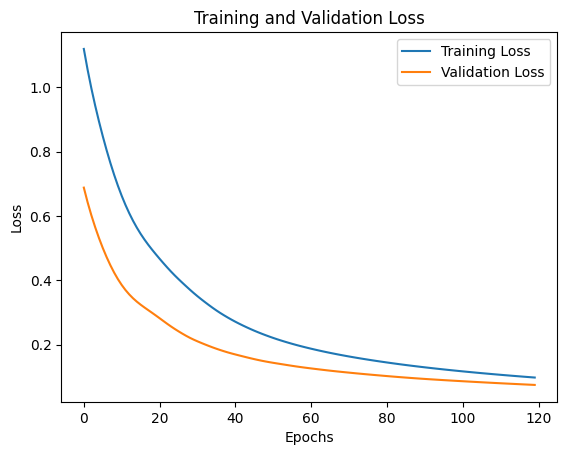

In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer  # Import SimpleImputer for imputing NaNs

# Assuming 'sequences' is your enriched and reshaped data
# sequences.shape should be (number_of_samples, 1440, number_of_features)

# Fill NaN values with mean of each column
imputer = SimpleImputer(strategy='mean')
sequences_no_nan = imputer.fit_transform(sequences.reshape(-1, sequences.shape[-1]))
sequences_filled = sequences_no_nan.reshape(sequences.shape)

# Initialize StandardScaler and scale the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(sequences_filled.reshape(-1, sequences.shape[-1])).reshape(sequences.shape)

# Initialize LSTM autoencoder model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(1440, sequences.shape[-1])))
model.add(LSTM(units=50, return_sequences=True))  # Ensure this layer returns sequences
model.add(Dense(units=sequences.shape[-1]))  # Output layer with same number of features as input
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
history = model.fit(scaled_data, scaled_data, epochs=120, batch_size=32, validation_split=0.2)

# Evaluate model performance or use for predictions
# Example: plot loss over epochs
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()


In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler

# Assuming 'sequences' is your enriched and reshaped data
# sequences.shape should be (number_of_samples, 1440, number_of_features)

# Flatten sequences to (number_of_samples * 1440, number_of_features)
flattened_sequences = sequences.reshape(-1, sequences.shape[-1])

# Initialize StandardScaler and scale the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(flattened_sequences)

# Reshape scaled_data back to original shape
scaled_data = scaled_data.reshape(sequences.shape)

# Initialize LSTM autoencoder model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(1440, scaled_data.shape[2])))
model.add(LSTM(units=50, return_sequences=True))  # Ensure this layer returns sequences
model.add(Dense(units=scaled_data.shape[2]))  # Output layer with same number of features as input
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
history = model.fit(scaled_data, scaled_data, epochs=100, batch_size=32, validation_split=0.2)

# Evaluate model performance or use for predictions
# Example: plot loss over epochs
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# Function to prepare data for clustering
def prepare_data_for_clustering(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for clustering (daily data with 1440 time steps)
    sequence_length = 1440  # Number of minutes in a day
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)
    return sequences, scaler

# Function to perform clustering
def perform_clustering(data, n_clusters):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(data)
    return labels, kmeans

# Function to plot clustering results
def plot_clustering_results(labels, data, kmeans):
    pca = PCA(n_components=2)
    reduced_data = pca.fit_transform(data)
    plt.figure(figsize=(12, 8))
    sns.scatterplot(x=reduced_data[:, 0], y=reduced_data[:, 1], hue=labels, palette='viridis')
    centroids = pca.transform(kmeans.cluster_centers_)
    plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='x', s=100, label='Centroids')
    plt.title('Clustering Results')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.legend()
    plt.show()

# Example usage
# Assuming 'merged_data' contains minute-wise data with columns like 'Value', 'Steps', etc.

# Fill NaN with column mean for a specific participant
participant_id = 2347167796
participant_data = merged_data[participant_id].fillna(merged_data[participant_id].mean())

# Prepare data for clustering
daily_data, scaler = prepare_data_for_clustering(participant_data[['Value', 'Steps']])

# Flatten the data for clustering (days, time_steps * features)
flattened_data = daily_data.reshape(daily_data.shape[0], -1)

# Perform clustering
labels, kmeans = perform_clustering(flattened_data, n_clusters=3)

# Count the number of members in each cluster
cluster_counts = np.bincount(labels)
for cluster in range(len(cluster_counts)):
    print(f"Cluster {cluster}: Count = {cluster_counts[cluster]}")

# Plot clustering results
plot_clustering_results(labels, flattened_data, kmeans)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

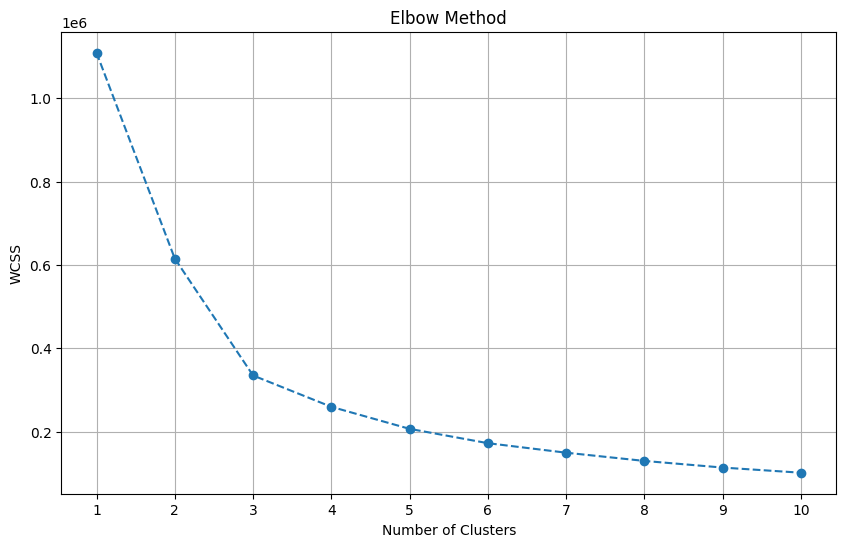

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Function to calculate WCSS
def calculate_wcss(data):
    wcss = []
    for n in range(1, 11):
        kmeans = KMeans(n_clusters=n, random_state=42)
        kmeans.fit(data)
        wcss.append(kmeans.inertia_)
    return wcss

# Function to plot Elbow method
def plot_elbow_method(data):
    wcss = calculate_wcss(data)
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
    plt.xlabel('Number of Clusters')
    plt.ylabel('WCSS')
    plt.title('Elbow Method')
    plt.xticks(np.arange(1, 11, 1))
    plt.grid(True)
    plt.show()

# Example usage
plot_elbow_method(all_data)  # Replace all_data with your processed data


In [ ]:
from sklearn.metrics import silhouette_score

# Function to calculate Silhouette score
def calculate_silhouette_score(data, labels):
    silhouette_avg = silhouette_score(data, labels)
    return silhouette_avg

# Example usage (after performing clustering)
silhouette_avg = calculate_silhouette_score(all_data, labels)
print(f"Silhouette Score: {silhouette_avg}")


Silhouette Score: 0.5522790483362258


In [ ]:
def plot_silhouette_scores(silhouette_scores, range_n_clusters):
    plt.figure(figsize=(10, 6))
    plt.plot(range_n_clusters, silhouette_scores, marker='o', linestyle='--')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Score for Different Numbers of Clusters')
    plt.xticks(range_n_clusters)
    plt.grid(True)
    plt.show()

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

range_n_clusters = range(2, 11)  # Range of clusters to try
silhouette_scores = []
for n_clusters in range_n_clusters:
    all_data = np.vstack([data for data in processed_data.values()])
    silhouette_avg, _, _ = perform_clustering(all_data, n_clusters)
    silhouette_scores.append(silhouette_avg)

# Plot Silhouette scores to find optimal number of clusters
plot_silhouette_scores(silhouette_scores, range_n_clusters)

AttributeError: 'numpy.ndarray' object has no attribute 'items'

In [ ]:
def plot_clustering_results(labels, participant_ids, data, kmeans):
    pca = PCA(n_components=2)
    reduced_data = pca.fit_transform(data)
    plt.figure(figsize=(12, 8))
    sns.scatterplot(x=reduced_data[:, 0], y=reduced_data[:, 1], hue=labels, palette='viridis')
    centroids = pca.transform(kmeans.cluster_centers_)
    plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='x', s=100, label='Centroids')
    plt.title('Clustering Results')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.legend()
    plt.show()

    cluster_members = {i: [] for i in range(kmeans.n_clusters)}
    for label, participant_id in zip(labels, participant_ids):
        cluster_members[label].append(participant_id)
    for cluster, members in cluster_members.items():
        print(f"Cluster {cluster}: {set(members)}")

# Function to plot Silhouette plot for range of clusters
def plot_silhouette_analysis(data, range_n_clusters):
    for n_clusters in range_n_clusters:
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        labels = kmeans.fit_predict(data)
        silhouette_avg = silhouette_score(data, labels)
        sample_silhouette_values = silhouette_samples(data, labels)

        plt.figure(figsize=(8, 6))
        plt.title(f"Silhouette Analysis for KMeans Clustering with {n_clusters} clusters")
        plt.xlabel("Silhouette Coefficient Values")
        plt.ylabel("Cluster Label")

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[labels == i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = plt.cm.viridis(float(i) / n_clusters)
            plt.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        plt.axvline(x=silhouette_avg, color="red", linestyle="--")
        plt.yticks([])  # Clear the yaxis labels / ticks
        plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
        plt.xlim([-0.1, 1])
        plt.ylim([0, len(data) + (n_clusters + 1) * 10])
        plt.show()

# Example usage
heart_rate_file_path = '/content/drive/MyDrive/mturkfitbit_export_4.12.16-5.12.16/Fitabase Data 4.12.16-5.12.16/heartrate_seconds_merged.csv'  # Replace with your file path
steps_file_path = '/content/drive/MyDrive/mturkfitbit_export_4.12.16-5.12.16/Fitabase Data 4.12.16-5.12.16/minuteStepsNarrow_merged.csv'  # Replace with your file path

# Prepare heart rate and steps data
heart_rate_data = prepare_heart_rate_data(heart_rate_file_path)
steps_data = prepare_steps_data(steps_file_path)

# Aggregate data to minute-wise interval
aggregated_heart_rate_data = aggregate_data(heart_rate_data, 'minute')
aggregated_steps_data = aggregate_data(steps_data, 'minute')

# Align and merge data for each participant
merged_data = align_and_merge_data(aggregated_heart_rate_data, aggregated_steps_data)
import pandas as pd

# Assuming merged_data is the DataFrame containing the data
# Fill NaNs with the mean of the respective columns
merged_data.fillna(merged_data.mean(), inplace=True)

# Verify if the NaNs are filled
print(merged_data.isna().sum())

# Preprocess data for clustering
#processed_data = preprocess_data_for_clustering(merged_data)

# Perform clustering
#range_n_clusters = [2, 3, 4, 5, 6]  # Range of clusters to try
#all_data = np.vstack([data for data in processed_data.values()])
#plot_silhouette_analysis(all_data, range_n_clusters)

<ipython-input-17-d19697930b15>:18: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['ActivityMinute'] = pd.to_datetime(df['ActivityMinute'])


KeyboardInterrupt: 

In [ ]:
# Function to perform clustering and calculate Silhouette score
def perform_clustering(processed_data, n_clusters):
    all_data = []
    participant_ids = []

    # Collect all scaled data and corresponding participant IDs
    for participant_id, data in processed_data.items():
        all_data.append(data)
        participant_ids.extend([participant_id] * data.shape[0])

    # Stack all data into a single array
    all_data = np.vstack(all_data)

    # Perform K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(all_data)

    # Calculate Silhouette score
    silhouette_avg = silhouette_score(all_data, labels)

    return silhouette_avg, labels, kmeans, participant_ids


In [ ]:
from sklearn.metrics import silhouette_score

# Function to calculate Silhouette score
def calculate_silhouette_score(data, labels):
    silhouette_avg = silhouette_score(data, labels)
    return silhouette_avg

# Example usage (after performing clustering)
silhouette_avg = calculate_silhouette_score(all_data, labels)
print(f"Silhouette Score: {silhouette_avg}")


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Function to prepare heart rate data
def prepare_heart_rate_data(file_path):
    df = pd.read_csv(file_path)
    df['Time'] = pd.to_datetime(df['Time'])
    participant_data = {}
    for participant_id in df['Id'].unique():
        participant_df = df[df['Id'] == participant_id].copy()
        participant_df.set_index('Time', inplace=True)
        participant_data[participant_id] = participant_df
    return participant_data

# Function to prepare steps data
def prepare_steps_data(file_path):
    df = pd.read_csv(file_path)
    df['ActivityMinute'] = pd.to_datetime(df['ActivityMinute'])
    participant_data = {}
    for participant_id in df['Id'].unique():
        participant_df = df[df['Id'] == participant_id].copy()
        participant_df.set_index('ActivityMinute', inplace=True)
        participant_data[participant_id] = participant_df
    return participant_data

# Function to aggregate data to a specified interval
def aggregate_data(participant_data, interval):
    aggregated_data = {}
    resample_rules = {
        'minute': 'T',
        '5_minutes': '5T',
        '15_minutes': '15T',
        '30_minutes': '30T',
        'hourly': 'H',
        'daily': 'D',
        'weekly': 'W'
    }
    if interval not in resample_rules:
        print("Invalid interval. Please specify 'minute', '5_minutes', '15_minutes', '30_minutes', 'hourly', 'daily', or 'weekly'.")
        return None
    for pid, pdf in participant_data.items():
        aggregated_data[pid] = pdf.resample(resample_rules[interval]).mean()
    return aggregated_data
heart_rate_file_path = '/content/drive/MyDrive/mturkfitbit_export_4.12.16-5.12.16/Fitabase Data 4.12.16-5.12.16/heartrate_seconds_merged.csv'  # Replace with your file path
steps_file_path = '/content/drive/MyDrive/mturkfitbit_export_4.12.16-5.12.16/Fitabase Data 4.12.16-5.12.16/minuteStepsNarrow_merged.csv'  # Replace with your file path
heart_rate_data = prepare_heart_rate_data(heart_rate_file_path)
steps_data = prepare_steps_data(steps_file_path)

<ipython-input-17-d19697930b15>:18: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['ActivityMinute'] = pd.to_datetime(df['ActivityMinute'])


In [ ]:
minute_data= aggregate_data(participant_data, interval='minute')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


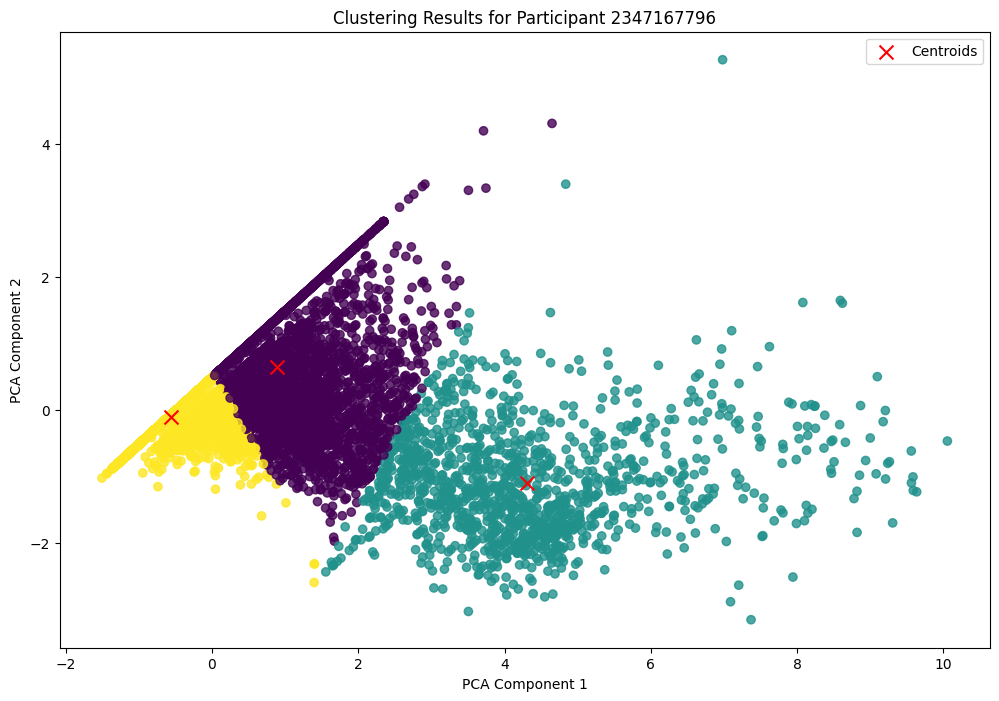

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Function to extract data for a specific participant
def extract_participant_data(participant_data, participant_id):
    return participant_data.get(participant_id, None)

# Function to perform clustering
def perform_clustering(participant_data, n_clusters):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(participant_data)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(scaled_data)

    return labels, kmeans

# Example usage
# Assuming processed_data contains the preprocessed data for clustering

participant_id = 2347167796
optimal_n_clusters = 3  # Replace with the optimal number of clusters you found

# Extract data for the participant
participant_data = extract_participant_data(processed_data, participant_id)

if participant_data is None:
    print(f"Participant {participant_id} data not found.")
else:
    # Perform clustering
    labels, kmeans = perform_clustering(participant_data, optimal_n_clusters)

    # Visualize clustering results (example with PCA)
    pca = PCA(n_components=2)
    reduced_data = pca.fit_transform(participant_data)

    plt.figure(figsize=(12, 8))
    plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=labels, cmap='viridis', alpha=0.8)
    centroids = pca.transform(kmeans.cluster_centers_)
    plt.scatter(centroids[:, 0], centroids[:, 1], marker='x', s=100, c='red', label='Centroids')
    plt.title(f'Clustering Results for Participant {participant_id}')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.legend()
    plt.show()


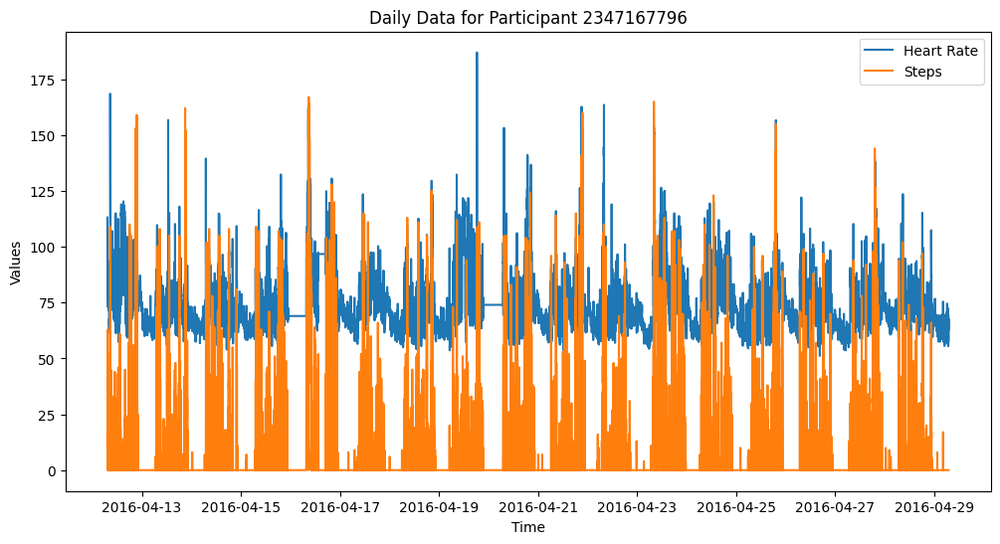

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


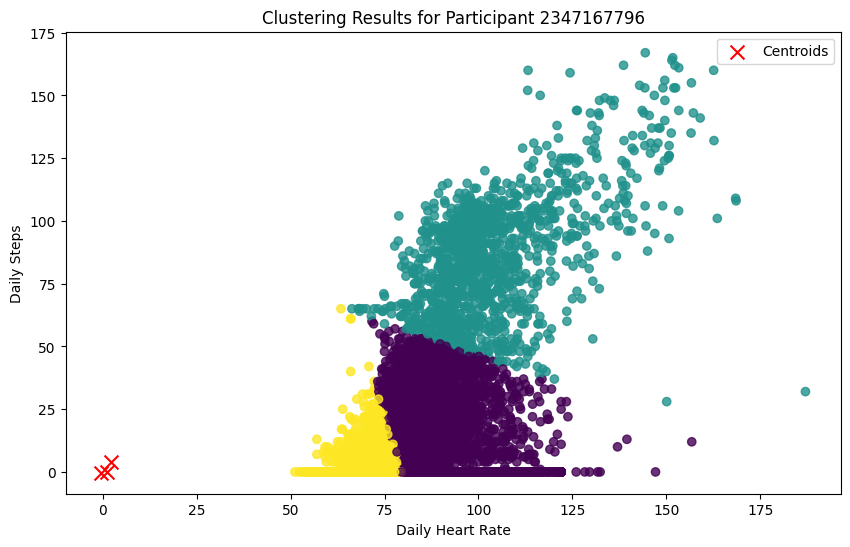

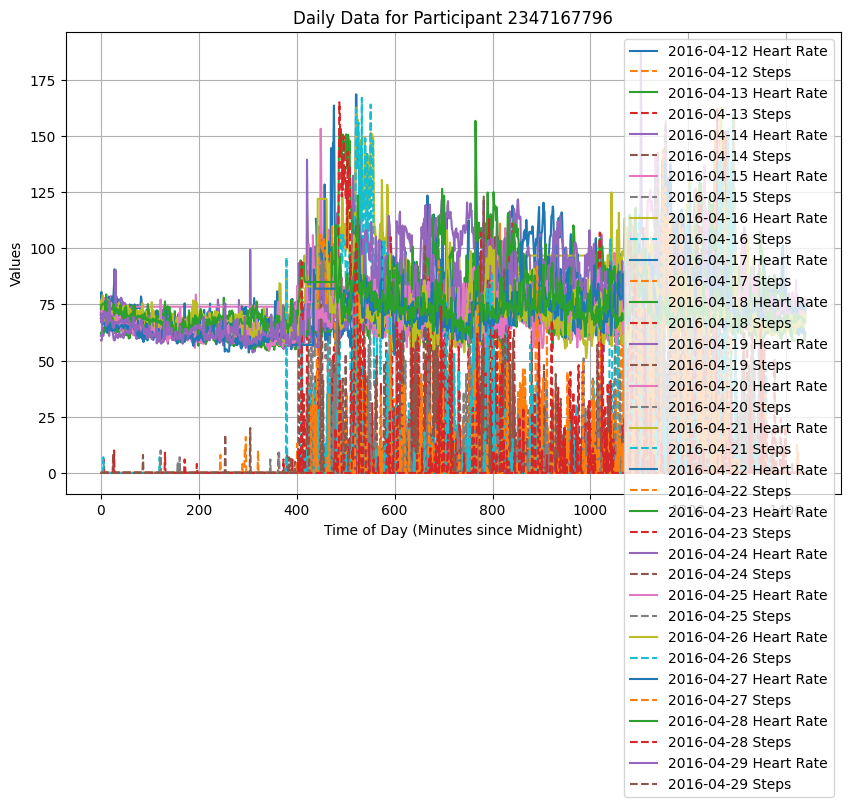

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Function to extract data for a specific participant
def extract_participant_data(merged_data, participant_id):
    return merged_data.get(participant_id, None)

# Function to plot daily data for a participant
def plot_daily_data(data, participant_id):
    plt.figure(figsize=(12, 6))
    plt.plot(data.index, data['Value'], label='Heart Rate')
    plt.plot(data.index, data['Steps'], label='Steps')
    plt.title(f'Daily Data for Participant {participant_id}')
    plt.xlabel('Time')
    plt.ylabel('Values')
    plt.legend()
    plt.show()

# Function to perform clustering
def perform_clustering(data, n_clusters):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(scaled_data)

    return labels, kmeans

# Function to plot minute-level data for each day over each other
def plot_minute_per_day(participant_data):
    for pid, data in participant_data.items():
        plt.figure(figsize=(10, 6))
        for date, day_data in data.groupby(data.index.date):
            time_values = [(t.hour * 60 + t.minute) for t in day_data.index.time]
            plt.plot(time_values, day_data['Value'], label=str(date) + ' Heart Rate')
            plt.plot(time_values, day_data['Steps'], label=str(date) + ' Steps', linestyle='--')
        plt.xlabel('Time of Day (Minutes since Midnight)')
        plt.ylabel('Values')
        plt.title(f'Daily Data for Participant {pid}')
        plt.legend()
        plt.grid(True)
        plt.show()

# Example usage
# Assuming merged_data contains the merged heart rate and steps data

# Extract data for a specific participant (e.g., participant_id = 2347167796)
participant_id = 2347167796
participant_data = extract_participant_data(merged_data, participant_id)

if participant_data is not None:
    # Plot daily data for the participant
    plot_daily_data(participant_data, participant_id)

    # Perform clustering (example: assuming n_clusters = 3)
    n_clusters = 3
    data_for_clustering = participant_data[['Value', 'Steps']].dropna()  # Adjust columns as per your data structure
    labels, kmeans = perform_clustering(data_for_clustering, n_clusters)

    # Visualize clustering results (example)
    plt.figure(figsize=(10, 6))
    plt.scatter(data_for_clustering['Value'], data_for_clustering['Steps'], c=labels, cmap='viridis', alpha=0.8)
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='x', s=100, c='red', label='Centroids')
    plt.title(f'Clustering Results for Participant {participant_id}')
    plt.xlabel('Daily Heart Rate')
    plt.ylabel('Daily Steps')
    plt.legend()
    plt.show()

    # Plot minute-level data for each day over each other
    plot_minute_per_day({participant_id: participant_data})

else:
    print(f"Participant {participant_id} data not found.")


In [ ]:
participant_data

,Id_hr,Value,Id_steps,Steps
2016-04-12 07:19:00,2.347168e+09,113.100000,2.347168e+09,16.00000
2016-04-12 07:20:00,2.347168e+09,110.000000,2.347168e+09,13.00000
2016-04-12 07:21:00,2.347168e+09,99.444444,2.347168e+09,10.00000
2016-04-12 07:22:00,2.347168e+09,92.375000,2.347168e+09,15.00000
2016-04-12 07:23:00,2.347168e+09,88.142857,2.347168e+09,49.00000
...,...,...,...,...
2016-04-29 06:52:00,2.347168e+09,64.333333,2.347168e+09,7.02172
2016-04-29 06:53:00,2.347168e+09,65.000000,2.347168e+09,7.02172
2016-04-29 06:54:00,2.347168e+09,67.800000,2.347168e+09,7.02172
2016-04-29 06:55:00,2.347168e+09,61.833333,2.347168e+09,7.02172


In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, RepeatVector, TimeDistributed, Dense

# Function to extract data for a specific participant
def extract_participant_data(merged_data, participant_id):
    return merged_data.get(participant_id, None)

# Function to plot minute-level data for each day over each other
def plot_minute_per_day(data, title_suffix):
    plt.figure(figsize=(10, 6))
    for date, day_data in data.groupby(data.index.date):
        time_values = [(t.hour * 60 + t.minute) for t in day_data.index.time]
        plt.plot(time_values, day_data['Value'], label=f'{date} - Heart Rate')
        plt.plot(time_values, day_data['Steps'], label=f'{date} - Steps', linestyle='--')
    plt.xlabel('Time of Day (Minutes since Midnight)')
    plt.ylabel('Values')
    plt.title(f'Daily Data Overlaid {title_suffix}')
    plt.legend()
    plt.grid(True)
    plt.show()

# Function to find the optimal number of clusters using the elbow method
def find_optimal_clusters(data, max_clusters):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    inertias = []
    for n_clusters in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        kmeans.fit(scaled_data)
        inertias.append(kmeans.inertia_)

    plt.figure(figsize=(10, 6))
    plt.plot(range(1, max_clusters + 1), inertias, marker='o')
    plt.xlabel('Number of clusters')
    plt.ylabel('Inertia')
    plt.title('Elbow Method for Optimal Number of Clusters')
    plt.grid(True)
    plt.show()

    elbow_point = inertias.index(min(inertias, key=lambda x: abs(x - (sum(inertias) / len(inertias)))))
    return elbow_point + 1

# Function to perform clustering
def perform_clustering(data, n_clusters):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(scaled_data)

    return labels, kmeans, scaled_data

# Function to reshape the data for LSTM input
def reshape_for_lstm(data, n_timesteps):
    n_features = data.shape[1]
    n_samples = len(data) // n_timesteps
    return data[:n_samples * n_timesteps].reshape((n_samples, n_timesteps, n_features))

# Function to build and train the LSTM autoencoder
def build_and_train_lstm_autoencoder(data, n_timesteps):
    n_features = data.shape[2]

    # Define model architecture
    input_layer = Input(shape=(n_timesteps, n_features))
    encoder = LSTM(64, activation='relu', return_sequences=False)(input_layer)
    repeat = RepeatVector(n_timesteps)(encoder)
    decoder = LSTM(64, activation='relu', return_sequences=True)(repeat)
    output_layer = TimeDistributed(Dense(n_features))(decoder)

    autoencoder = Model(input_layer, output_layer)
    autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='mse')

    X_train, X_test = train_test_split(data, test_size=0.2, random_state=42)

    # Train the model
    history = autoencoder.fit(X_train, X_train, epochs=50, batch_size=32, validation_data=(X_test, X_test))

    return autoencoder, history

# Function to fill NaNs with the mean of the column
def fillna_with_mean(data):
    for column in data.columns:
        if data[column].isnull().any():
            mean_value = data[column].mean()
            data[column].fillna(mean_value, inplace=True)
    return data

# Example usage
# Assuming merged_data contains the merged heart rate and steps data

# Extract data for a specific participant (e.g., participant_id = 2347167796)
participant_id = 2347167796
participant_data = extract_participant_data(merged_data, participant_id)

if participant_data is not None:
    # Fill NaNs with column mean
    participant_data = fillna_with_mean(participant_data)

    # Plot days overlaid for visualization
    plot_minute_per_day(participant_data, f'for Participant {participant_id}')

    # Prepare data for clustering
    data_for_clustering = participant_data[['Value_hr', 'Value_steps']]  # Adjust columns as per your data structure

    # Find the optimal number of clusters using the elbow method
    optimal_clusters = find_optimal_clusters(data_for_clustering, max_clusters=10)
    print(f'Optimal number of clusters: {optimal_clusters}')

    # Perform clustering with the optimal number of clusters
    labels, kmeans, scaled_data = perform_clustering(data_for_clustering, optimal_clusters)

    # Visualize clustering results
    plt.figure(figsize=(10, 6))
    plt.scatter(data_for_clustering['Value_hr'], data_for_clustering['Value_steps'], c=labels, cmap='viridis', alpha=0.8)
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='x', s=100, c='red', label='Centroids')
    plt.title(f'Clustering Results for Participant {participant_id}')
    plt.xlabel('Daily Heart Rate')
    plt.ylabel('Daily Steps')
    plt.legend()
    plt.show()

    # Reshape the data for LSTM autoencoder
    n_timesteps = 1440  # Assuming minute-level data for a day (24 * 60)
    lstm_ready_data = reshape_for_lstm(scaled_data, n_timesteps)

    # Build and train the LSTM autoencoder
    lstm_autoencoder, history = build_and_train_lstm_autoencoder(lstm_ready_data, n_timesteps)

    # Plot training history
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training and Validation Loss Over Epochs')
    plt.grid(True)
    plt.show()
else:
    print(f"Participant {participant_id} data not found.")


KeyError: 'Value_hr'

<Figure size 1000x600 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt

def plot_minute_per_day(participant_data):
    # Plot minute-level data for each day over each other for all participants
    for pid, data in participant_data.items():
        plt.figure(figsize=(10, 6))

        # Group data by date and plot each day's data
        for date, day_data in data.groupby(data.index.date):
            # Convert time to numerical values (minutes since midnight)
            time_values = [(t.hour * 60 + t.minute) for t in day_data.index.time]
            plt.plot(time_values, day_data['Value'], label=str(date))  # Adjust 'Value_hr' to your heart rate column

        plt.xlabel('Time of Day (Minutes since Midnight)')
        plt.ylabel('Heart Rate')  # Adjust ylabel as needed
        plt.title(f'Heart Rate Data for Each Day for Participant {pid}')
        plt.legend(title='Date')
        plt.grid(True)
        plt.show()

# Example usage
# Assuming you have already loaded and prepared your participant data

plot_minute_per_day(participant_data)


In [ ]:
import matplotlib.pyplot as plt

def plot_minute_per_day(participant_data):
    # Plot minute-level data for each day over each other for all participants
    for pid, data in participant_data.items():
        plt.figure(figsize=(10, 6))

        # Group data by date and plot each day's data for heart rate
        for date, day_data in data.groupby(data.index.date):
            # Convert time to numerical values (minutes since midnight)
            time_values = [(t.hour * 60 + t.minute) for t in day_data.index.time]
            plt.plot(time_values, day_data['Value'], label=f'Heart Rate {str(date)}')

        # Plot each day's data for steps
        for date, day_data in data.groupby(data.index.date):
            # Convert time to numerical values (minutes since midnight)
            time_values = [(t.hour * 60 + t.minute) for t in day_data.index.time]
            plt.plot(time_values, day_data['Steps'], label=f'Steps {str(date)}', linestyle='--')

        plt.xlabel('Time of Day (Minutes since Midnight)')
        plt.ylabel('Values')
        plt.title(f'Heart Rate and Steps Data for Each Day for Participant {pid}')
        plt.legend(title='Data Type')
        plt.grid(True)
        plt.show()

# Example usage
# Assuming you have already loaded and prepared your participant data

plot_minute_per_day(participant_data)


KeyError: 'Value'

<Figure size 1000x600 with 0 Axes>

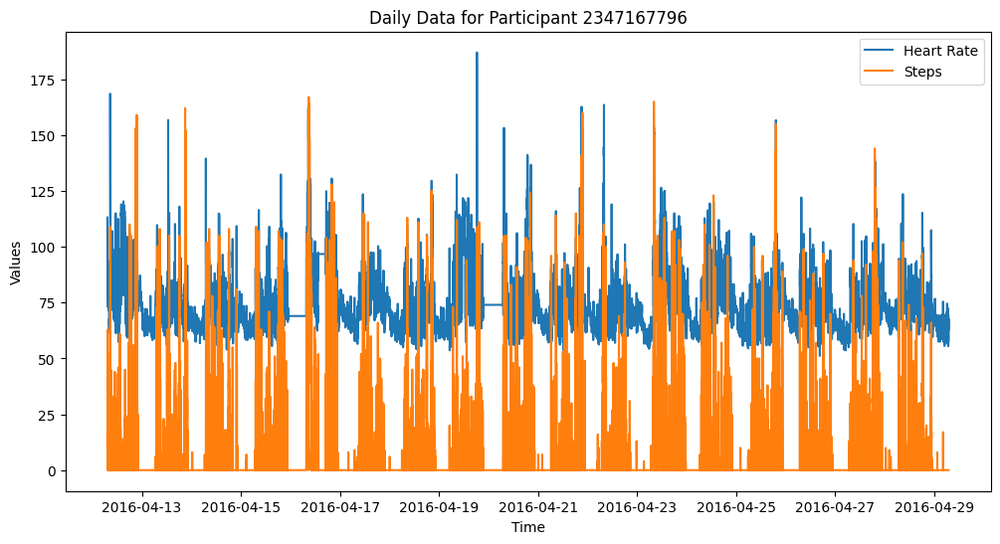

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


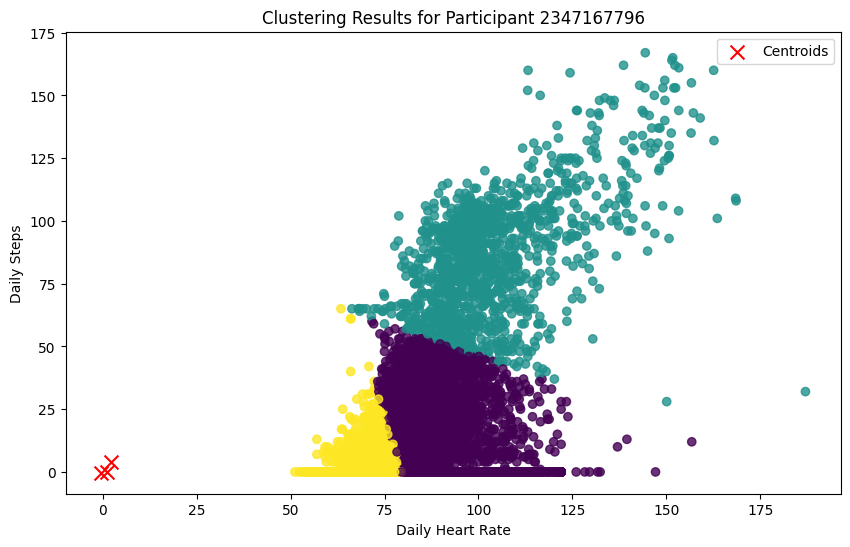

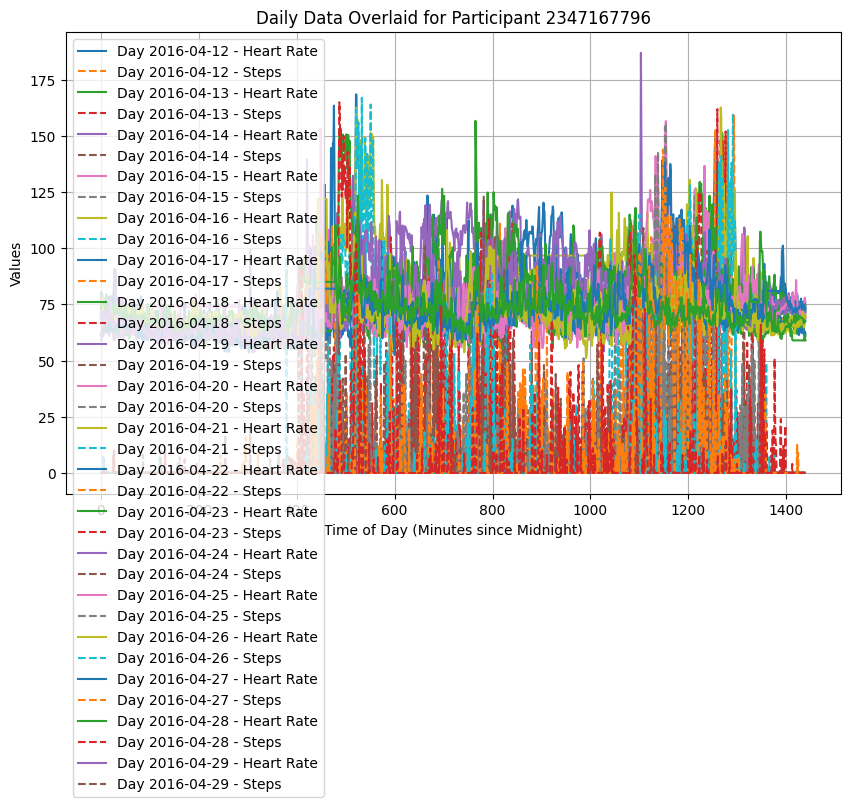

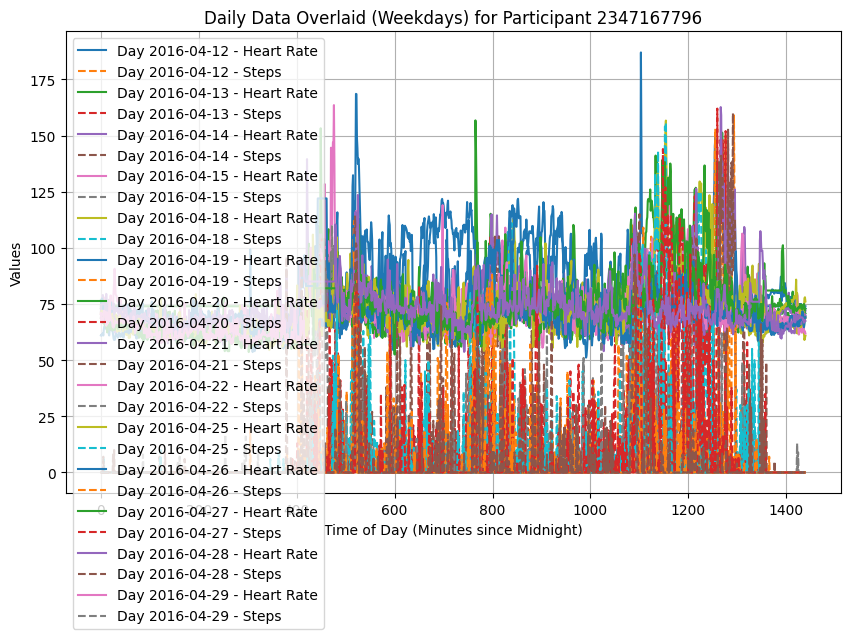

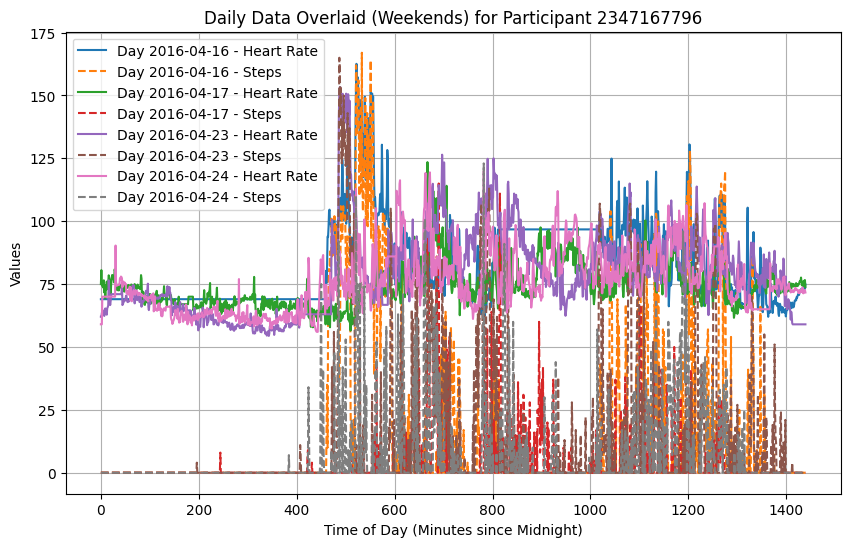

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Function to extract data for a specific participant
def extract_participant_data(merged_data, participant_id):
    return merged_data.get(participant_id, None)

# Function to plot daily data for a participant
def plot_daily_data(data, participant_id):
    plt.figure(figsize=(12, 6))
    plt.plot(data.index, data['Value'], label='Heart Rate')
    plt.plot(data.index, data['Steps'], label='Steps')
    plt.title(f'Daily Data for Participant {participant_id}')
    plt.xlabel('Time')
    plt.ylabel('Values')
    plt.legend()
    plt.show()

# Function to perform clustering
def perform_clustering(data, n_clusters):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(scaled_data)

    return labels, kmeans

# Function to plot minute-level data for each day over each other
def plot_minute_per_day(data, title_suffix):
    plt.figure(figsize=(10, 6))
    for date, day_data in data.groupby(data.index.date):
        time_values = [(t.hour * 60 + t.minute) for t in day_data.index.time]
        plt.plot(time_values, day_data['Value'], label=f'Day {date} - Heart Rate')
        plt.plot(time_values, day_data['Steps'], label=f'Day {date} - Steps', linestyle='--')
    plt.xlabel('Time of Day (Minutes since Midnight)')
    plt.ylabel('Values')
    plt.title(f'Daily Data Overlaid {title_suffix}')
    plt.legend()
    plt.grid(True)
    plt.show()

# Function to split data into weekdays and weekends
def split_weekdays_weekends(data):
    data['DayOfWeek'] = data.index.dayofweek
    weekdays_data = data[data['DayOfWeek'] < 5].copy()
    weekends_data = data[data['DayOfWeek'] >= 5].copy()
    data.drop(columns=['DayOfWeek'], inplace=True)  # Clean up temporary column
    return weekdays_data, weekends_data

# Example usage
# Assuming merged_data contains the merged heart rate and steps data

# Extract data for a specific participant (e.g., participant_id = 2347167796)
participant_id = 2347167796
participant_data = extract_participant_data(merged_data, participant_id)

if participant_data is not None:
    # Plot daily data for the participant
    plot_daily_data(participant_data, participant_id)

    # Perform clustering (example: assuming n_clusters = 3)
    n_clusters = 3
    data_for_clustering = participant_data[['Value', 'Steps']]  # Adjust columns as per your data structure
    labels, kmeans = perform_clustering(data_for_clustering, n_clusters)

    # Visualize clustering results (example)
    plt.figure(figsize=(10, 6))
    plt.scatter(data_for_clustering['Value'], data_for_clustering['Steps'], c=labels, cmap='viridis', alpha=0.8)
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='x', s=100, c='red', label='Centroids')
    plt.title(f'Clustering Results for Participant {participant_id}')
    plt.xlabel('Daily Heart Rate')
    plt.ylabel('Daily Steps')
    plt.legend()
    plt.show()

    # Split data into weekdays and weekends
    weekdays_data, weekends_data = split_weekdays_weekends(participant_data)

    # Plot days overlaid for visualization
    plot_minute_per_day(participant_data, f'for Participant {participant_id}')

    # Plot weekdays data overlaid for visualization
    plot_minute_per_day(weekdays_data, f'(Weekdays) for Participant {participant_id}')

    # Plot weekends data overlaid for visualization
    plot_minute_per_day(weekends_data, f'(Weekends) for Participant {participant_id}')

else:
    print(f"Participant {participant_id} data not found.")


<ipython-input-38-23560ecfc136>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DayOfWeek'] = data.index.dayofweek  # Monday=0, Sunday=6


Epoch 1/100
1/1 [==============================] - 15s 15s/step - loss: 1.2020 - val_loss: 0.8908
Epoch 2/100
1/1 [==============================] - 1s 1s/step - loss: 1.1155 - val_loss: 0.8316
Epoch 3/100
1/1 [==============================] - 1s 1s/step - loss: 1.0361 - val_loss: 0.7759
Epoch 4/100
1/1 [==============================] - 1s 1s/step - loss: 0.9627 - val_loss: 0.7232
Epoch 5/100
1/1 [==============================] - 1s 1s/step - loss: 0.8943 - val_loss: 0.6733
Epoch 6/100
1/1 [==============================] - 1s 1s/step - loss: 0.8303 - val_loss: 0.6259
Epoch 7/100
1/1 [==============================] - 1s 1s/step - loss: 0.7701 - val_loss: 0.5809
Epoch 8/100
1/1 [==============================] - 1s 1s/step - loss: 0.7135 - val_loss: 0.5386
Epoch 9/100
1/1 [==============================] - 2s 2s/step - loss: 0.6607 - val_loss: 0.4993
Epoch 10/100
1/1 [==============================] - 3s 3s/step - loss: 0.6120 - val_loss: 0.4637
Epoch 11/100
1/1 [===================

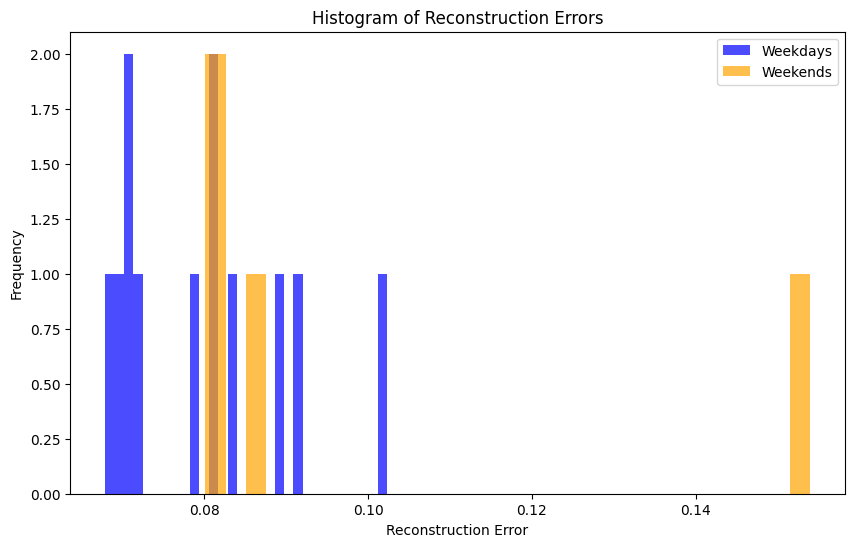

In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Function to prepare data for LSTM training
def prepare_data_for_lstm(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequence_length = 1440  # Number of minutes in a day
    sequences = []

    for i in range(len(data) // sequence_length):
        sequence = scaled_data[i*sequence_length:(i+1)*sequence_length]
        sequences.append(sequence)

    sequences = np.array(sequences)

    return sequences, scaler

# Function to build and train LSTM autoencoder
def build_and_train_lstm_autoencoder(X):
    # Initialize LSTM model
    model = Sequential()
    model.add(LSTM(units=50, return_sequences=True, input_shape=(1440, X.shape[2])))
    model.add(LSTM(units=50, return_sequences=True))  # Ensure this layer returns sequences
    model.add(Dense(units=X.shape[2]))  # Adjust units based on number of features
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train the model
    history = model.fit(X, X, epochs=100, batch_size=32, validation_split=0.2)

    return model, history

# Example usage
# Assuming 'minute_data' contains minute-wise data with columns like 'Value', 'Steps', etc.

# Fill NaN with column mean
merged_data[2347167796].fillna(merged_data[2347167796].mean(), inplace=True)

# Extract participant data
participant_data = merged_data[2347167796][['Value', 'Steps']]

# Split data into weekdays and weekends
weekdays_data, weekends_data = split_weekdays_weekends(participant_data)

# Prepare data for LSTM training
weekdays_X, weekdays_scaler = prepare_data_for_lstm(weekdays_data)
weekends_X, weekends_scaler = prepare_data_for_lstm(weekends_data)

# Train separate models
weekdays_model, weekdays_history = build_and_train_lstm_autoencoder(weekdays_X)
weekends_model, weekends_history = build_and_train_lstm_autoencoder(weekends_X)

# Calculate reconstruction error for each sample
weekdays_reconstructed_X = weekdays_model.predict(weekdays_X)
weekends_reconstructed_X = weekends_model.predict(weekends_X)

weekdays_reconstruction_errors = np.mean((weekdays_X - weekdays_reconstructed_X) ** 2, axis=(1, 2))
weekends_reconstruction_errors = np.mean((weekends_X - weekends_reconstructed_X) ** 2, axis=(1, 2))

# Print reconstruction errors
print("Weekdays reconstruction errors for each sample:")
print(weekdays_reconstruction_errors)

print("Weekends reconstruction errors for each sample:")
print(weekends_reconstruction_errors)

# Plot histogram of reconstruction errors
plt.figure(figsize=(10, 6))
plt.hist(weekdays_reconstruction_errors, bins=30, alpha=0.7, color='blue', label='Weekdays')
plt.hist(weekends_reconstruction_errors, bins=30, alpha=0.7, color='orange', label='Weekends')
plt.xlabel('Reconstruction Error')
plt.ylabel('Frequency')
plt.title('Histogram of Reconstruction Errors')
plt.legend()
plt.show()


In [ ]:
# Split data into weekdays and weekends
weekdays_data, weekends_data = split_weekdays_weekends(participant_data)

In [ ]:
weekdays_data

,Id_hr,Value,Id_steps,Steps,day_of_week,DayOfWeek
2016-04-12 07:19:00,2.347168e+09,113.100000,2.347168e+09,16.0,1,1
2016-04-12 07:20:00,2.347168e+09,110.000000,2.347168e+09,13.0,1,1
2016-04-12 07:21:00,2.347168e+09,99.444444,2.347168e+09,10.0,1,1
2016-04-12 07:22:00,2.347168e+09,92.375000,2.347168e+09,15.0,1,1
2016-04-12 07:23:00,2.347168e+09,88.142857,2.347168e+09,49.0,1,1
...,...,...,...,...,...,...
2016-04-29 06:52:00,2.347168e+09,64.333333,2.347168e+09,0.0,4,4
2016-04-29 06:53:00,2.347168e+09,65.000000,2.347168e+09,0.0,4,4
2016-04-29 06:54:00,2.347168e+09,67.800000,2.347168e+09,0.0,4,4
2016-04-29 06:55:00,2.347168e+09,61.833333,2.347168e+09,0.0,4,4


In [ ]:
import pandas as pd
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Function to extract data for a specific participant
def extract_participant_data(merged_data, participant_id):
    return merged_data.get(participant_id, None)

# Function to plot minute-wise daily data overlaid
def plot_minute_per_day(data, title_suffix):
    plt.figure(figsize=(10, 6))
    for date, day_data in data.groupby(data.index.date):
        time_values = [(t.hour * 60 + t.minute) for t in day_data.index.time]
        plt.plot(time_values, day_data['Value'], label=f'Day {date} - Heart Rate')
        plt.plot(time_values, day_data['Steps'], label=f'Day {date} - Steps', linestyle='--')
    plt.xlabel('Time of Day (Minutes since Midnight)')
    plt.ylabel('Values')
    plt.title(f'Daily Data Overlaid {title_suffix}')
    plt.legend()
    plt.grid(True)
    plt.show()

# Function to preprocess and prepare data for training
def prepare_data_for_training(data):
    # Resample minute-wise data to hourly or other relevant time interval
    #hourly_data = data.resample('H').mean()  # Example: resample to hourly mean

    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    return scaled_data, scaler

# Function to train LSTM autoencoder
def train_lstm_autoencoder(data):
    # Assuming data has shape (samples, time_steps, features)
    model = Sequential()
    model.add(LSTM(units=50, return_sequences=True, input_shape=(data.shape[1], data.shape[2])))
    model.add(LSTM(units=50, return_sequences=False))
    model.add(Dense(units=data.shape[2]))
    model.compile(optimizer='adam', loss='mean_squared_error')
    history = model.fit(data, data, epochs=100, batch_size=32, validation_split=0.2)
    return model, history

# Example usage
# Assuming merged_data contains the merged heart rate and steps data

# Extract data for a specific participant (e.g., participant_id = 2347167796)
participant_id = 2347167796
participant_data = extract_participant_data(merged_data, participant_id)

if participant_data is not None:
    # Plot minute-wise daily data overlaid
    plot_minute_per_day(participant_data[['Value', 'Steps']], f'for Participant {participant_id}')

    # Prepare data for training (example: resample to hourly and scale)
    scaled_data, scaler = prepare_data_for_training(participant_data[['Value', 'Steps']])

    # Train LSTM autoencoder
    model, history = train_lstm_autoencoder(scaled_data)

    # Evaluate model performance (optional)
    # Example: plot loss over epochs
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.show()

else:
    print(f"Participant {participant_id} data not found.")


In [ ]:
from scipy import stats

# Example data
weekdays_avg_pattern = [1, 2, 3, 4, 5]  # Replace with your actual data
weekends_avg_pattern = [2, 3, 4, 5, 6]  # Replace with your actual data

# Perform ANOVA test
f_value, p_value = stats.f_oneway(weekdays_avg_pattern, weekends_avg_pattern)

print(f"F-value: {f_value}")
print(f"P-value: {p_value}")

# Interpretation
if p_value < 0.05:
    print("There is a significant difference between the weekday and weekend patterns.")
else:
    print("There is no significant difference between the weekday and weekend patterns.")


F-value: 1.0
P-value: 0.3465935070873342
There is no significant difference between the weekday and weekend patterns.


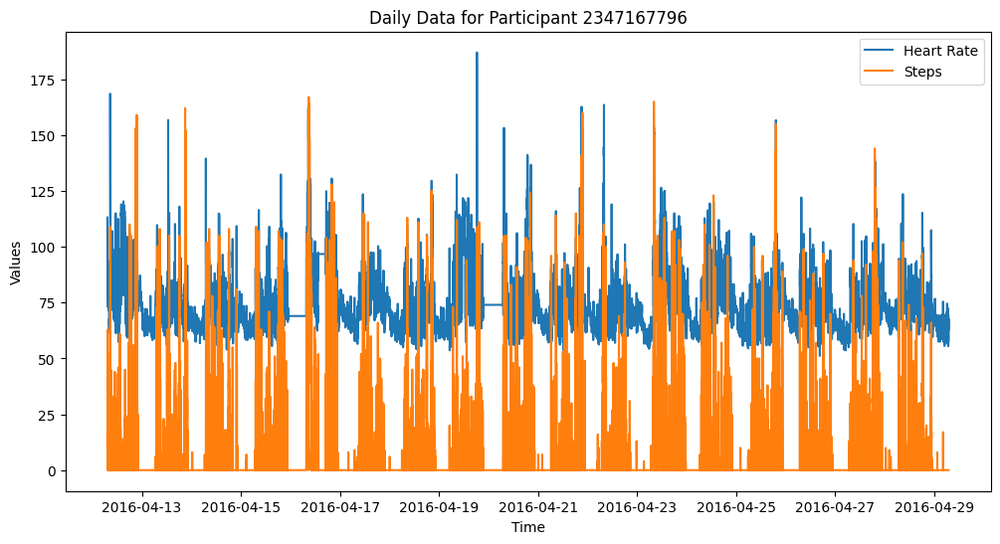

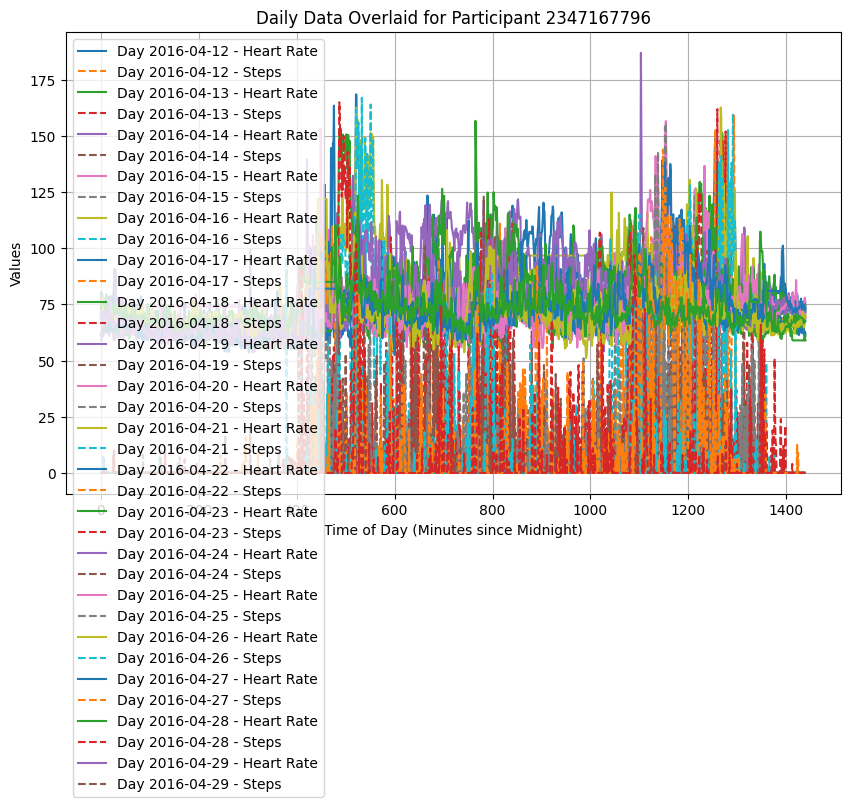

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

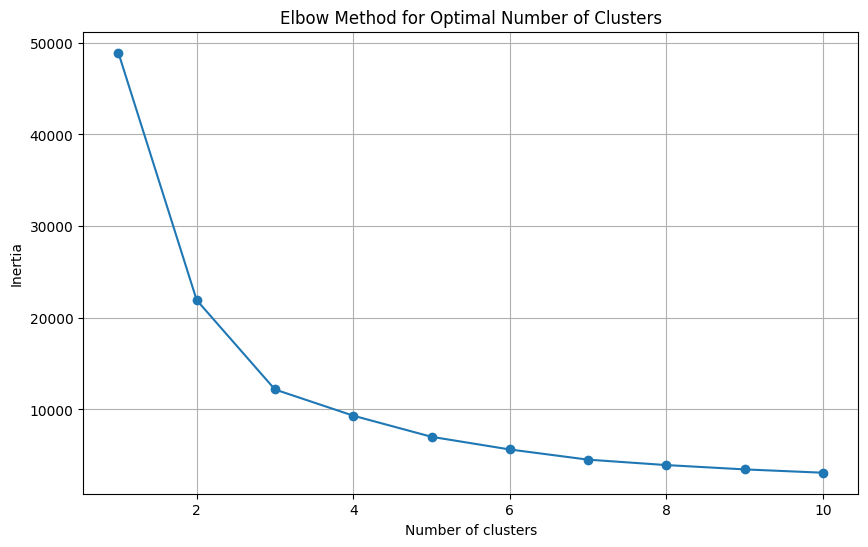

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Function to extract data for a specific participant
def extract_participant_data(merged_data, participant_id):
    return merged_data.get(participant_id, None)

# Function to plot daily data for a participant
def plot_daily_data(data, participant_id):
    plt.figure(figsize=(12, 6))
    plt.plot(data.index, data['Value'], label='Heart Rate')
    plt.plot(data.index, data['Steps'], label='Steps')
    plt.title(f'Daily Data for Participant {participant_id}')
    plt.xlabel('Time')
    plt.ylabel('Values')
    plt.legend()
    plt.show()

# Function to plot minute-level data for each day over each other
def plot_minute_per_day(data, title_suffix):
    plt.figure(figsize=(10, 6))
    for date, day_data in data.groupby(data.index.date):
        time_values = [(t.hour * 60 + t.minute) for t in day_data.index.time]
        plt.plot(time_values, day_data['Value'], label=f'Day {date} - Heart Rate')
        plt.plot(time_values, day_data['Steps'], label=f'Day {date} - Steps', linestyle='--')
    plt.xlabel('Time of Day (Minutes since Midnight)')
    plt.ylabel('Values')
    plt.title(f'Daily Data Overlaid {title_suffix}')
    plt.legend()
    plt.grid(True)
    plt.show()

# Function to perform clustering and plot the elbow method
def find_optimal_clusters(data, max_clusters):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    inertias = []
    for n_clusters in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        kmeans.fit(scaled_data)
        inertias.append(kmeans.inertia_)

    plt.figure(figsize=(10, 6))
    plt.plot(range(1, max_clusters + 1), inertias, marker='o')
    plt.xlabel('Number of clusters')
    plt.ylabel('Inertia')
    plt.title('Elbow Method for Optimal Number of Clusters')
    plt.grid(True)
    plt.show()

# Example usage
# Assuming merged_data contains the merged heart rate and steps data

# Extract data for a specific participant (e.g., participant_id = 2347167796)
participant_id = 2347167796
participant_data = extract_participant_data(merged_data, participant_id)

if participant_data is not None:
    # Plot daily data for the participant
    plot_daily_data(participant_data, participant_id)

    # Plot days overlaid for visualization
    plot_minute_per_day(participant_data, f'for Participant {participant_id}')

    # Prepare data for clustering
    data_for_clustering = participant_data[['Value', 'Steps']].dropna()  # Adjust columns as per your data structure

    # Find the optimal number of clusters using the elbow method
    find_optimal_clusters(data_for_clustering, max_clusters=10)

else:
    print(f"Participant {participant_id} data not found.")


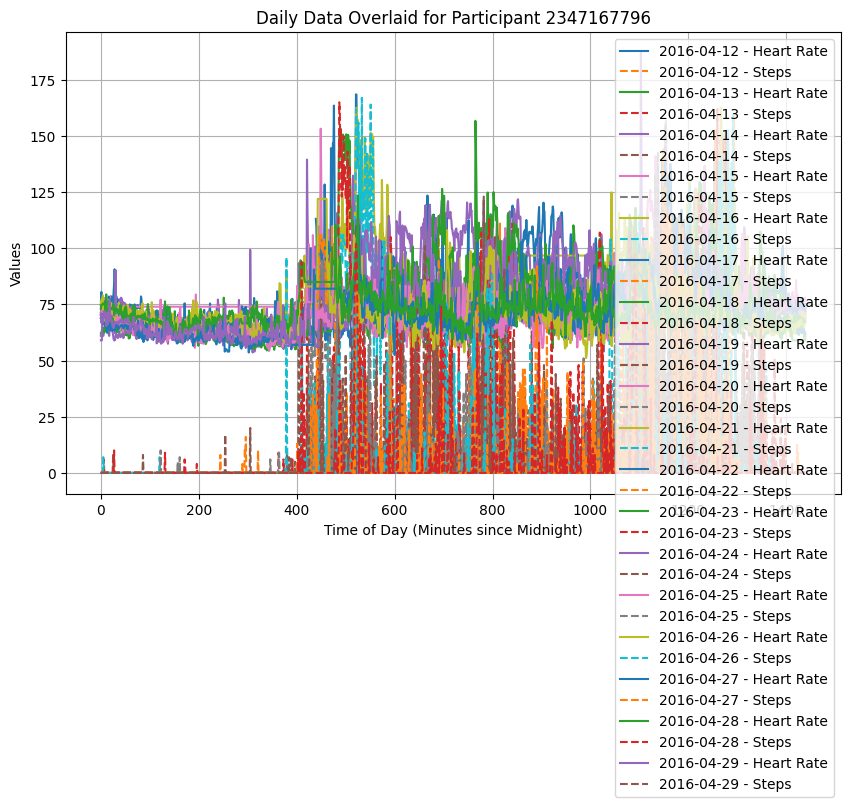

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

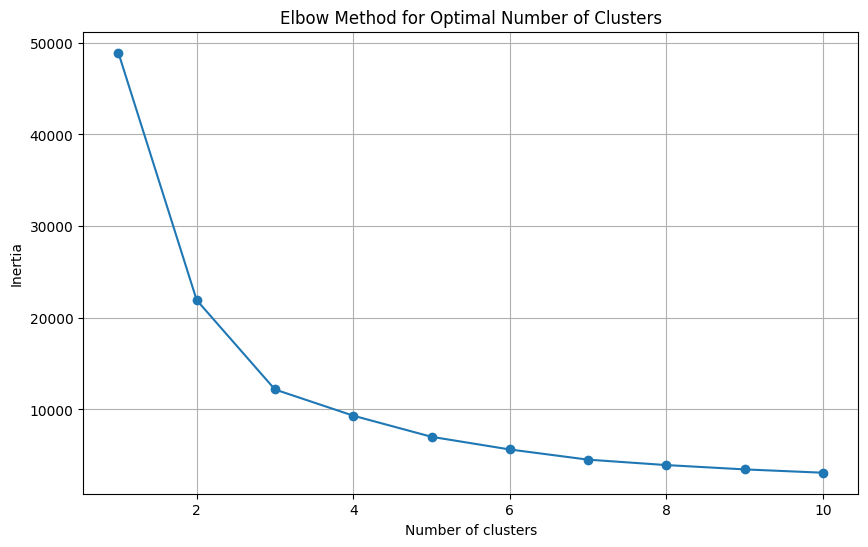

Optimal number of clusters: 3


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


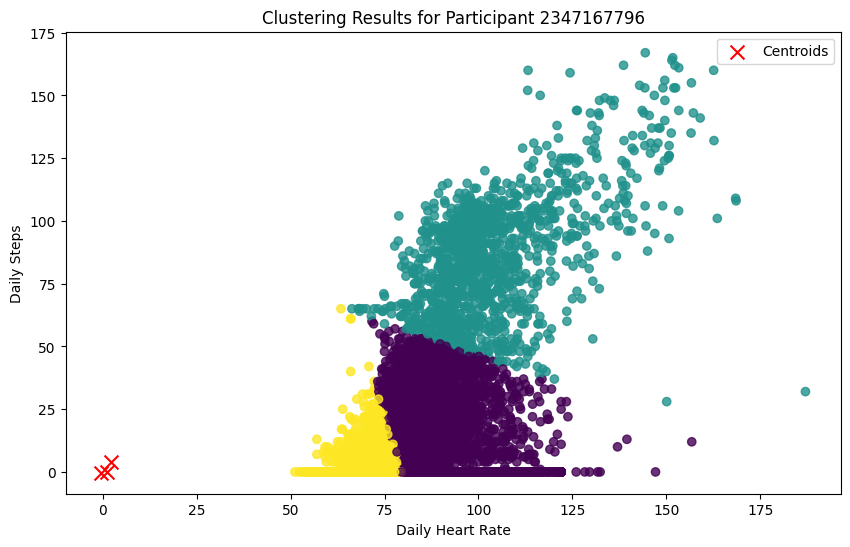

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Function to extract data for a specific participant
def extract_participant_data(merged_data, participant_id):
    return merged_data.get(participant_id, None)

# Function to plot minute-level data for each day over each other
def plot_minute_per_day(data, title_suffix):
    plt.figure(figsize=(10, 6))
    for date, day_data in data.groupby(data.index.date):
        time_values = [(t.hour * 60 + t.minute) for t in day_data.index.time]
        plt.plot(time_values, day_data['Value'], label=f'{date} - Heart Rate')
        plt.plot(time_values, day_data['Steps'], label=f'{date} - Steps', linestyle='--')
    plt.xlabel('Time of Day (Minutes since Midnight)')
    plt.ylabel('Values')
    plt.title(f'Daily Data Overlaid {title_suffix}')
    plt.legend()
    plt.grid(True)
    plt.show()

# Function to find the optimal number of clusters using the elbow method
def find_optimal_clusters(data, max_clusters):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    inertias = []
    for n_clusters in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        kmeans.fit(scaled_data)
        inertias.append(kmeans.inertia_)

    plt.figure(figsize=(10, 6))
    plt.plot(range(1, max_clusters + 1), inertias, marker='o')
    plt.xlabel('Number of clusters')
    plt.ylabel('Inertia')
    plt.title('Elbow Method for Optimal Number of Clusters')
    plt.grid(True)
    plt.show()

    # Determine the elbow point (heuristically or by inspection)
    # Here we return the index of the minimum inertia change as an example
    # Adjust this to your method of identifying the elbow point
    elbow_point = inertias.index(min(inertias, key=lambda x: abs(x - (sum(inertias) / len(inertias)))))
    return elbow_point + 1

# Function to perform clustering
def perform_clustering(data, n_clusters):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(scaled_data)

    return labels, kmeans

# Example usage
# Assuming merged_data contains the merged heart rate and steps data

# Extract data for a specific participant (e.g., participant_id = 2347167796)
participant_id = 2347167796
participant_data = extract_participant_data(merged_data, participant_id)

if participant_data is not None:
    # Plot days overlaid for visualization
    plot_minute_per_day(participant_data, f'for Participant {participant_id}')

    # Prepare data for clustering
    data_for_clustering = participant_data[['Value', 'Steps']].dropna()  # Adjust columns as per your data structure

    # Find the optimal number of clusters using the elbow method
    optimal_clusters = find_optimal_clusters(data_for_clustering, max_clusters=10)
    print(f'Optimal number of clusters: {optimal_clusters}')

    # Perform clustering with the optimal number of clusters
    labels, kmeans = perform_clustering(data_for_clustering, optimal_clusters)

    # Visualize clustering results
    plt.figure(figsize=(10, 6))
    plt.scatter(data_for_clustering['Value'], data_for_clustering['Steps'], c=labels, cmap='viridis', alpha=0.8)
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='x', s=100, c='red', label='Centroids')
    plt.title(f'Clustering Results for Participant {participant_id}')
    plt.xlabel('Daily Heart Rate')
    plt.ylabel('Daily Steps')
    plt.legend()
    plt.show()
else:
    print(f"Participant {participant_id} data not found.")


In [ ]:
import pandas as pd
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler

# Function to extract data for a specific participant
def extract_participant_data(merged_data, participant_id):
    return merged_data.get(participant_id, None)

# Function to fill NaN values with mean of each column
def fill_nan_with_mean(data):
    # Calculate mean of each column
    column_means = data.mean()
    # Fill NaN values with mean of respective column
    data_filled = data.fillna(column_means)
    return data_filled

# Function to split data into weekdays and weekends
def split_weekdays_weekends(data):
    data['DayOfWeek'] = data.index.dayofweek  # Monday=0, Sunday=6
    weekdays = data[data['DayOfWeek'] < 5]  # Weekdays (Monday=0 to Friday=4)
    weekends = data[data['DayOfWeek'] >= 5]  # Weekends (Saturday=5, Sunday=6)
    return weekdays, weekends

# Function to train LSTM autoencoder
def train_lstm_autoencoder(data):
    # Assuming data has shape (samples, time_steps, features)
    model = Sequential()
    model.add(LSTM(units=50, return_sequences=True, input_shape=(data.shape[1], data.shape[2])))
    model.add(LSTM(units=50, return_sequences=False))
    model.add(Dense(units=data.shape[2]))
    model.compile(optimizer='adam', loss='mean_squared_error')
    history = model.fit(data, data, epochs=100, batch_size=32, validation_split=0.2)
    return model

# Example usage
# Assuming merged_data contains the merged heart rate and steps data

# Extract data for a specific participant (e.g., participant_id = 2347167796)
participant_id = 2347167796
participant_data = extract_participant_data(merged_data, participant_id)

In [ ]:
participant_data

,Id_hr,Value,Id_steps,Steps,day_of_week
2016-04-12 07:19:00,2.347168e+09,113.100000,2.347168e+09,16.0,1
2016-04-12 07:20:00,2.347168e+09,110.000000,2.347168e+09,13.0,1
2016-04-12 07:21:00,2.347168e+09,99.444444,2.347168e+09,10.0,1
2016-04-12 07:22:00,2.347168e+09,92.375000,2.347168e+09,15.0,1
2016-04-12 07:23:00,2.347168e+09,88.142857,2.347168e+09,49.0,1
...,...,...,...,...,...
2016-04-29 06:52:00,2.347168e+09,64.333333,2.347168e+09,0.0,4
2016-04-29 06:53:00,2.347168e+09,65.000000,2.347168e+09,0.0,4
2016-04-29 06:54:00,2.347168e+09,67.800000,2.347168e+09,0.0,4
2016-04-29 06:55:00,2.347168e+09,61.833333,2.347168e+09,0.0,4


Epoch 1/100
1/1 [==============================] - 12s 12s/step - loss: 1.1762 - val_loss: 0.9019
Epoch 2/100
1/1 [==============================] - 3s 3s/step - loss: 1.0985 - val_loss: 0.8444
Epoch 3/100
1/1 [==============================] - 1s 1s/step - loss: 1.0288 - val_loss: 0.7930
Epoch 4/100
1/1 [==============================] - 1s 1s/step - loss: 0.9657 - val_loss: 0.7466
Epoch 5/100
1/1 [==============================] - 1s 1s/step - loss: 0.9084 - val_loss: 0.7048
Epoch 6/100
1/1 [==============================] - 1s 1s/step - loss: 0.8562 - val_loss: 0.6670
Epoch 7/100
1/1 [==============================] - 1s 1s/step - loss: 0.8087 - val_loss: 0.6331
Epoch 8/100
1/1 [==============================] - 1s 1s/step - loss: 0.7657 - val_loss: 0.6033
Epoch 9/100
1/1 [==============================] - 1s 1s/step - loss: 0.7277 - val_loss: 0.5780
Epoch 10/100
1/1 [==============================] - 2s 2s/step - loss: 0.6950 - val_loss: 0.5576
Epoch 11/100
1/1 [===================

1/1 [==============================] - 1s 1s/step


1/1 [==============================] - 1s 1s/step
Weekdays reconstruction errors for each sample:
[0.08836948 0.07617703 0.06922762 0.06888732 0.06737977 0.07464862
 0.07643345 0.07178933 0.05812683 0.07683294 0.06149648 0.06829855]
Weekends reconstruction errors for each sample:
[0.10306743 0.06656697 0.09893857 0.11765305]


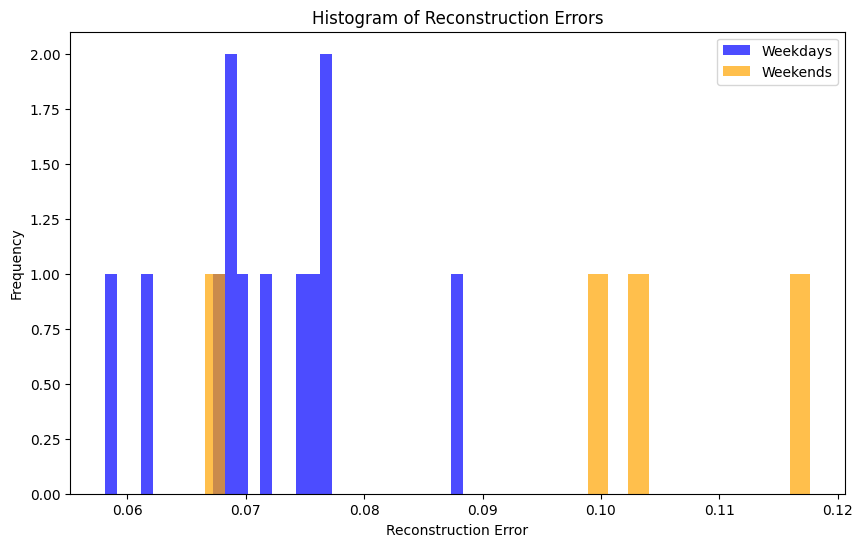

In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Example function to prepare data for LSTM training
def prepare_data_for_lstm(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequence_length = 1440  # Number of minutes in a day
    num_days = len(data) // sequence_length

    # Truncate data to fit into full days
    truncated_data = scaled_data[:num_days * sequence_length]
    sequences = truncated_data.reshape(num_days, sequence_length, -1)

    return sequences, scaler

# Function to build and train LSTM autoencoder
def build_and_train_lstm_autoencoder(X):
    # Initialize LSTM model
    model = Sequential()
    model.add(LSTM(units=50, return_sequences=True, input_shape=(1440, X.shape[2])))
    model.add(LSTM(units=50, return_sequences=True))  # Ensure this layer returns sequences
    model.add(Dense(units=X.shape[2]))  # Adjust units based on number of features
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train the model
    history = model.fit(X, X, epochs=100, batch_size=32, validation_split=0.2)

    return model, history

# Function to split data into weekdays and weekends
def split_weekdays_weekends(data):
    weekdays_data = data[data.index.weekday < 5]
    weekends_data = data[data.index.weekday >= 5]
    return weekdays_data, weekends_data

# Example usage
# Assuming 'minute_data' contains minute-wise data with columns like 'Value', 'Steps', etc.

# Fill NaN with column mean
merged_data[2347167796].fillna(merged_data[2347167796].mean(), inplace=True)

# Extract participant data
participant_data = merged_data[2347167796][['Value', 'Steps']]

# Split data into weekdays and weekends
weekdays_data, weekends_data = split_weekdays_weekends(participant_data)

# Prepare data for LSTM training
weekdays_X, weekdays_scaler = prepare_data_for_lstm(weekdays_data)
weekends_X, weekends_scaler = prepare_data_for_lstm(weekends_data)

# Train separate models
weekdays_model, weekdays_history = build_and_train_lstm_autoencoder(weekdays_X)
weekends_model, weekends_history = build_and_train_lstm_autoencoder(weekends_X)

# Calculate reconstruction error for each sample
weekdays_reconstructed_X = weekdays_model.predict(weekdays_X)
weekends_reconstructed_X = weekends_model.predict(weekends_X)

weekdays_reconstruction_errors = np.mean((weekdays_X - weekdays_reconstructed_X) ** 2, axis=(1, 2))
weekends_reconstruction_errors = np.mean((weekends_X - weekends_reconstructed_X) ** 2, axis=(1, 2))

# Print reconstruction errors
print("Weekdays reconstruction errors for each sample:")
print(weekdays_reconstruction_errors)

print("Weekends reconstruction errors for each sample:")
print(weekends_reconstruction_errors)

# Plot histogram of reconstruction errors
plt.figure(figsize=(10, 6))
plt.hist(weekdays_reconstruction_errors, bins=30, alpha=0.7, color='blue', label='Weekdays')
plt.hist(weekends_reconstruction_errors, bins=30, alpha=0.7, color='orange', label='Weekends')
plt.xlabel('Reconstruction Error')
plt.ylabel('Frequency')
plt.title('Histogram of Reconstruction Errors')
plt.legend()
plt.show()


Epoch 1/50
1/1 [==============================] - 6s 6s/step - loss: 1.1277 - val_loss: 0.8525
Epoch 2/50
1/1 [==============================] - 1s 1s/step - loss: 1.0539 - val_loss: 0.7967
Epoch 3/50
1/1 [==============================] - 1s 1s/step - loss: 0.9867 - val_loss: 0.7457
Epoch 4/50
1/1 [==============================] - 1s 1s/step - loss: 0.9249 - val_loss: 0.6988
Epoch 5/50
1/1 [==============================] - 1s 1s/step - loss: 0.8678 - val_loss: 0.6557
Epoch 6/50
1/1 [==============================] - 1s 1s/step - loss: 0.8149 - val_loss: 0.6164
Epoch 7/50
1/1 [==============================] - 2s 2s/step - loss: 0.7663 - val_loss: 0.5816
Epoch 8/50
1/1 [==============================] - 2s 2s/step - loss: 0.7227 - val_loss: 0.5521
Epoch 9/50
1/1 [==============================] - 1s 1s/step - loss: 0.6850 - val_loss: 0.5290
Epoch 10/50
1/1 [==============================] - 1s 1s/step - loss: 0.6543 - val_loss: 0.5131
Epoch 11/50
1/1 [==============================] 

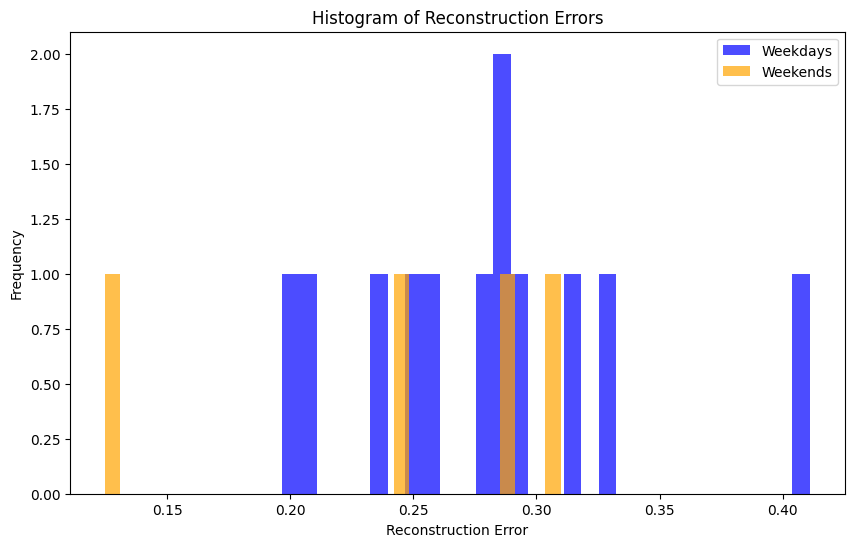

In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Example function to prepare data for LSTM training
def prepare_data_for_lstm(data):
    # Scale data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data)

    # Prepare sequences for LSTM input
    sequence_length = 1440  # Number of minutes in a day
    num_days = len(data) // sequence_length

    # Truncate data to fit into full days
    truncated_data = scaled_data[:num_days * sequence_length]
    sequences = truncated_data.reshape(num_days, sequence_length, -1)

    return sequences, scaler

# Function to build and train LSTM autoencoder
def build_and_train_lstm_autoencoder(X):
    # Initialize LSTM model
    model = Sequential()
    model.add(LSTM(units=50, return_sequences=True, input_shape=(1440, X.shape[2])))
    model.add(LSTM(units=50, return_sequences=True))  # Ensure this layer returns sequences
    model.add(Dense(units=X.shape[2]))  # Adjust units based on number of features
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train the model
    history = model.fit(X, X, epochs=50, batch_size=32, validation_split=0.2)

    return model, history

# Function to split data into weekdays and weekends
def split_weekdays_weekends(data):
    weekdays_data = data[data.index.weekday < 5]
    weekends_data = data[data.index.weekday >= 5]
    return weekdays_data, weekends_data

# Example usage
# Assuming 'minute_data' contains minute-wise data with columns like 'Value', 'Steps', etc.

# Fill NaN with column mean
merged_data[2347167796].fillna(merged_data[2347167796].mean(), inplace=True)

# Extract participant data
participant_data = merged_data[2347167796][['Value', 'Steps']]

# Split data into weekdays and weekends
weekdays_data, weekends_data = split_weekdays_weekends(participant_data)

# Prepare data for LSTM training
weekdays_X, weekdays_scaler = prepare_data_for_lstm(weekdays_data)
weekends_X, weekends_scaler = prepare_data_for_lstm(weekends_data)

# Train separate models
weekdays_model, weekdays_history = build_and_train_lstm_autoencoder(weekdays_X)
weekends_model, weekends_history = build_and_train_lstm_autoencoder(weekends_X)

# Calculate reconstruction error for each sample
weekdays_reconstructed_X = weekdays_model.predict(weekdays_X)
weekends_reconstructed_X = weekends_model.predict(weekends_X)

weekdays_reconstruction_errors = np.mean((weekdays_X - weekdays_reconstructed_X) ** 2, axis=(1, 2))
weekends_reconstruction_errors = np.mean((weekends_X - weekends_reconstructed_X) ** 2, axis=(1, 2))

# Print reconstruction errors
print("Weekdays reconstruction errors for each sample:")
print(weekdays_reconstruction_errors)

print("Weekends reconstruction errors for each sample:")
print(weekends_reconstruction_errors)

# Plot histogram of reconstruction errors
plt.figure(figsize=(10, 6))
plt.hist(weekdays_reconstruction_errors, bins=30, alpha=0.7, color='blue', label='Weekdays')
plt.hist(weekends_reconstruction_errors, bins=30, alpha=0.7, color='orange', label='Weekends')
plt.xlabel('Reconstruction Error')
plt.ylabel('Frequency')
plt.title('Histogram of Reconstruction Errors')
plt.legend()
plt.show()

In [ ]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(weekdays[['Value', 'Steps']])

daily_data = np.expand_dims(scaled_data, axis=0)  # Shape: (1, samples, features)
#model = train_lstm_autoencoder(daily_data)
#reconstruction_error = model.evaluate(daily_data, daily_data, verbose=0)
daily_data.shape


(1, 18698, 2)

<ipython-input-59-0435490add41>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DayOfWeek'] = data.index.dayofweek  # Monday=0, Sunday=6


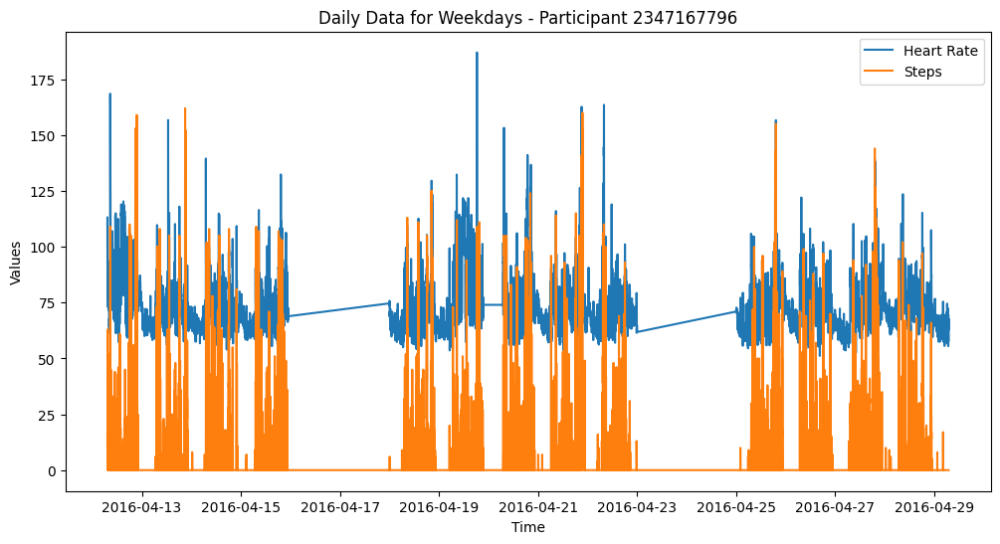

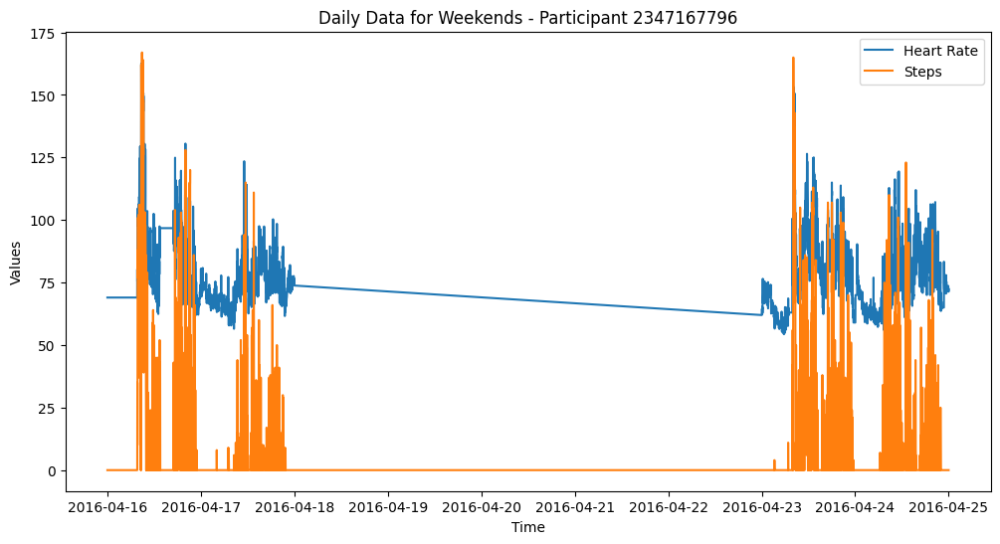

Training LSTM Autoencoder for Weekdays


ValueError: Training data contains 1 samples, which is not sufficient to split it into a validation and training set as specified by `validation_split=0.3`. Either provide more data, or a different value for the `validation_split` argument.

In [ ]:
import pandas as pd
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
from datetime import datetime

# Function to extract data for a specific participant
def extract_participant_data(merged_data, participant_id):
    return merged_data.get(participant_id, None)

# Function to split data into weekdays and weekends
def split_weekdays_weekends(data):
    data['DayOfWeek'] = data.index.dayofweek  # Monday=0, Sunday=6
    weekdays = data[data['DayOfWeek'] < 5]  # Weekdays (Monday=0 to Friday=4)
    weekends = data[data['DayOfWeek'] >= 5]  # Weekends (Saturday=5, Sunday=6)
    return weekdays, weekends

# Function to train LSTM autoencoder
def train_lstm_autoencoder(data):
    # Assuming data has shape (samples, time_steps, features)
    model = Sequential()
    model.add(LSTM(units=50, return_sequences=True, input_shape=(data.shape[1], data.shape[2])))
    model.add(LSTM(units=50, return_sequences=False))
    model.add(Dense(units=data.shape[2]))
    model.compile(optimizer='adam', loss='mean_squared_error')
    history = model.fit(data, data, epochs=50, batch_size=32, validation_split=0.3)
    return model

# Example usage
# Assuming merged_data contains the merged heart rate and steps data

# Extract data for a specific participant (e.g., participant_id = 2347167796)
participant_id = 2347167796
participant_data = extract_participant_data(merged_data, participant_id)

if participant_data is not None:
    # Split data into weekdays and weekends
    weekdays, weekends = split_weekdays_weekends(participant_data[['Value', 'Steps']])

    # Optional: Plot daily data for weekdays and weekends
    def plot_daily_data(data, title):
        plt.figure(figsize=(12, 6))
        plt.plot(data.index, data['Value'], label='Heart Rate')
        plt.plot(data.index, data['Steps'], label='Steps')
        plt.title(title)
        plt.xlabel('Time')
        plt.ylabel('Values')
        plt.legend()
        plt.show()

    plot_daily_data(weekdays, f'Daily Data for Weekdays - Participant {participant_id}')
    plot_daily_data(weekends, f'Daily Data for Weekends - Participant {participant_id}')

    # Train LSTM autoencoder separately for weekdays and weekends
    def train_and_evaluate(data, title):
        print(f"Training LSTM Autoencoder for {title}")
        scaler = StandardScaler()
        scaled_data = scaler.fit_transform(data)

        daily_data = np.expand_dims(scaled_data, axis=0)  # Shape: (1, samples, features)
        model = train_lstm_autoencoder(daily_data)
        reconstruction_error = model.evaluate(daily_data, daily_data, verbose=0)
        print(f"{title} Reconstruction Error: {reconstruction_error}")

        # Optionally, you can save the trained model for later use
        # model.save(f'{title}_model.h5')

    train_and_evaluate(weekdays[['Value', 'Steps']], 'Weekdays')
    train_and_evaluate(weekends[['Value', 'Steps']], 'Weekends')

else:
    print(f"Participant {participant_id} data not found.")


In [ ]:
weekdays[['Value', 'Steps']]

,Value,Steps
2016-04-12 07:19:00,113.100000,16.0
2016-04-12 07:20:00,110.000000,13.0
2016-04-12 07:21:00,99.444444,10.0
2016-04-12 07:22:00,92.375000,15.0
2016-04-12 07:23:00,88.142857,49.0
...,...,...
2016-04-29 06:52:00,64.333333,0.0
2016-04-29 06:53:00,65.000000,0.0
2016-04-29 06:54:00,67.800000,0.0
2016-04-29 06:55:00,61.833333,0.0
